In [1]:
import sys
sys.path.append("..")

In [2]:
import os

# prevent JAX from preallocating all GPU memory
os.environ["XLA_PYTHON_CLIENT_PREALLOCATE"] = "false"

# data loading
import pandas as pd
import numpy as np

# plotting
#import arviz as az
import matplotlib.pyplot as plt
import seaborn as sns

# pyro
import numpyro
import numpyro.distributions as dist
from numpyro.infer import Predictive
from numpyro.handlers import condition, trace
from numpyro.contrib.control_flow import scan, cond

numpyro.set_host_device_count(4)

# jax
import jax
import jax.numpy as jnp
import jax.random as random

if any([d.platform == "gpu" for d in jax.devices()]):
    numpyro.set_platform("gpu")

from jax.lib import xla_bridge
print(f"current XLA device: {xla_bridge.get_backend().platform}")

import weathergen as wx
import wxsbi

C:\Users\jw1301\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


current XLA device: cpu


In [3]:
# enable autoreload of source files
%load_ext autoreload
%autoreload 2

Here we auto-download the E-OBS basin data, if necessary.

# Data

In [6]:
basin_id = 6340800
basin_info = pd.read_csv("../data/eobs-basins/basins_info.csv")
name_map = wx.data.data_var_name_map(prec="pre", Tair_mean="tavg", Tair_min="tmin", Tair_max="tmax")
basin_data_all = wx.data.load_time_series_csv("../data/eobs-basins/eobs_basins_averaged_all.csv", name_map)


In [7]:
basin_data = basin_data_all.loc[basin_data_all.id == basin_id].drop(columns=basin_data_all.columns[0])

In [8]:
basin_info[basin_info.id == basin_id]

,id,wmo_reg,sub_reg,river,station,country,lat,lon,area,altitude_station,...,r_volume_yr,r_height_yr,clay,sand,mineral_bulk_density,altitude_basin,forest,impervious,pervious,slope
531,6340800,6,6401,SPREE,SPREMBERG,DE,51.577,14.37,2092.0,91.52,...,0.505018,241.404161,0.142248,0.526502,0.012846,206.270072,0.386012,0.024523,0.589464,2.507489


In [9]:
basin_data_train = basin_data["1950":"1980"]

Tair_freqs = [1/356.25, 2/365.25]
prec_freqs = [1/365.25, 2/365.25, 3/365.25]


# Model

In [11]:
from weathergen.wgen.wgen_gamlss import *

In [12]:
#wgen = wx.WGEN(basin_data_train, model = wx.wgen_glm_v2, order = 2, Tair_freqs=Tair_freqs, prec_freqs=prec_freqs)
#wgen = wx.WGEN(basin_data_train, order = 2, Tair_freqs=Tair_freqs, prec_freqs=prec_freqs)
wgen = wx.WGEN(basin_data_train, model = WGEN_GAMLSS(), order = 2, Tair_freqs=[1/365.25, 2/365.25], prec_freqs=[1/365.25, 2/365.25])

In [13]:
wgen.initial_states.shape

(1, 11321, 3, 2)

Run variational inference for parameter estimates:

In [15]:
from numpyro.infer import SVI, TraceGraph_ELBO
from numpyro.infer.autoguide import AutoDelta, AutoNormal, AutoMultivariateNormal

num_iter = 50_000
prng = random.PRNGKey(1234)
guide = AutoMultivariateNormal(wgen.step, init_loc_fn=numpyro.infer.init_to_median)
svi_result = wgen.fit(num_iter, guide, subsample_time=1000, rng=prng)

100%|██████████| 50000/50000 [03:30<00:00, 238.02it/s, init loss: 412717.4062, avg. loss [47501-50000]: 28595.6737]


Get posterior samples:

In [17]:
posterior_sampler = Predictive(guide, params=svi_result.params, num_samples=100)
posterior_params = posterior_sampler(prng)
{k: v.mean(axis=0) for k,v in posterior_params.items() if k != "_auto_latent"}

{'Tavg_loc_lag': Array([-0.19764814,  0.9538096 ], dtype=float32),
 'Tavg_loc_pred': Array([2.398603], dtype=float32),
 'Tavg_loc_scale_pred': Array([0.79891247], dtype=float32),
 'Tavg_loc_scale_seasonal': Array([ 0.08220787, -0.01758923, -0.01478404,  0.04059773], dtype=float32),
 'Tavg_loc_seasonal': Array([-0.82781744,  0.16022445, -2.8345146 ,  0.22919525], dtype=float32),
 'Tavg_loc_seasonal_lag_interaction': Array([-0.00972907,  0.00190808, -0.03636055, -0.00216361,  0.04068361,
         0.00813558,  0.10666931,  0.005878  ], dtype=float32),
 'Trange_alpha_Trange_prev': Array([-0.00331521,  0.06602173], dtype=float32),
 'Trange_alpha_pred': Array([1.5269383], dtype=float32),
 'Trange_alpha_seasonal': Array([-0.0025383 ,  0.05841029,  0.16809437,  0.05800278], dtype=float32),
 'Trange_alpha_seasonal_lag_interaction': Array([-0.0361576 ,  0.01078807, -0.10422897, -0.02001565, -0.07563651,
        -0.15259765, -0.482323  , -0.08416206], dtype=float32),
 'Trange_beta_Trange_prev': A

Get predictive distributions and run simulations

In [19]:
svi_predictive = Predictive(wgen.simulate, posterior_samples=posterior_params, parallel=True)
svi_preds = svi_predictive(prng)

In [20]:
obs = wgen.obs

In [21]:
from weathergen.plotting import *

## Model diagnostics

In [ ]:
fig = plt.figure(layout="tight", figsize=(7.5, 7.5))
fig.suptitle("Precipitation")

gs = GridSpec(3, 3, figure=fig)

# Row 1
ax_row_1 = [fig.add_subplot(gs[0, i]) for i in range(3)]
get_mean_plot(obs["prec"], svi_preds["prec"], basin_data_train.index, ax=ax_row_1[0])
get_std_plot(obs["prec"], svi_preds["prec"], basin_data_train.index, ax=ax_row_1[1])
get_max_plot(obs["prec"], svi_preds["prec"], basin_data_train.index, ax=ax_row_1[2])

# Row 2
ax_row_2 = [fig.add_subplot(gs[1, i]) for i in range(3)]
get_prop_wet_plot(obs["prec"], svi_preds["prec"], basin_data_train.index, ax=ax_row_2[0])
get_cond_mean_plot(obs["prec"], svi_preds["prec"], basin_data_train.index, ax=ax_row_2[1])
get_cond_std_plot(obs["prec"], svi_preds["prec"], basin_data_train.index, ax=ax_row_2[2])

# Row 3
ax_row_3 = [fig.add_subplot(gs[2, i]) for i in range(3)]
get_acf_plot(obs["prec"], svi_preds["prec"], basin_data_train.index, ax=ax_row_3[0], lag=1)
get_acf_plot(obs["prec"], svi_preds["prec"], basin_data_train.index, ax=ax_row_3[1], lag=2)
get_temp_precip_cor_plot(obs["Tavg"], svi_preds["Tavg"], obs["prec"], svi_preds["prec"], basin_data_train.index, ax=ax_row_3[2])


In [ ]:
fig = plt.figure(layout="tight", figsize=(10, 4))
fig.suptitle("Precipitation")

gs = GridSpec(2, 5, figure=fig)

# Row 1
ax_row_1 = [fig.add_subplot(gs[0, i]) for i in range(5)]
get_mean_plot(obs["prec"], svi_preds["prec"], basin_data_train.index, ax=ax_row_1[0])
get_std_plot(obs["prec"], svi_preds["prec"], basin_data_train.index, ax=ax_row_1[1])
get_max_plot(obs["prec"], svi_preds["prec"], basin_data_train.index, ax=ax_row_1[2])
get_prop_wet_plot(obs["prec"], svi_preds["prec"], basin_data_train.index, ax=ax_row_1[3])
get_temp_precip_cor_plot(obs["Tavg"], svi_preds["Tavg"], obs["prec"], svi_preds["prec"], basin_data_train.index, ax=ax_row_1[4])



# Row 2
ax_row_2 = [fig.add_subplot(gs[1, i]) for i in range(5)]
get_cond_mean_plot(obs["prec"], svi_preds["prec"], basin_data_train.index, ax=ax_row_2[0])
get_cond_std_plot(obs["prec"], svi_preds["prec"], basin_data_train.index, ax=ax_row_2[1])
get_acf_plot(obs["prec"], svi_preds["prec"], basin_data_train.index, ax=ax_row_2[2], lag=1)
get_acf_plot(obs["prec"], svi_preds["prec"], basin_data_train.index, ax=ax_row_2[3], lag=2)
ax_row_2[4].axis("off")

plt.savefig("plots/pr_paper.png", dpi = 300)

In [ ]:
fig = plt.figure(layout="tight", figsize=(6, 4))
fig.suptitle("Tavg")

gs = GridSpec(2, 3, figure=fig)

# Row 1
ax_row_1 = [fig.add_subplot(gs[0, i]) for i in range(3)]
get_mean_plot(obs["Tavg"], svi_preds["Tavg"], basin_data_train.index, ax=ax_row_1[0])
get_std_plot(obs["Tavg"], svi_preds["Tavg"], basin_data_train.index, ax=ax_row_1[1])
get_max_plot(obs["Tavg"], svi_preds["Tavg"], basin_data_train.index, ax=ax_row_1[2])

# Row 2
ax_row_2 = [fig.add_subplot(gs[1, i]) for i in range(3)]
get_min_plot(obs["Tavg"], svi_preds["Tavg"], basin_data_train.index, ax=ax_row_2[0])
get_acf_plot(obs["Tavg"], svi_preds["Tavg"], basin_data_train.index, ax=ax_row_2[1], lag=1)
get_acf_plot(obs["Tavg"], svi_preds["Tavg"], basin_data_train.index, ax=ax_row_2[2], lag=2)

plt.savefig("plots/tavg_paper.png", dpi = 300)

In [ ]:
fig = plt.figure(layout="tight", figsize=(6, 4))
#fig.suptitle("Trange")

gs = GridSpec(2, 3, figure=fig)

# Row 1
ax_row_1 = [fig.add_subplot(gs[0, i]) for i in range(3)]
get_mean_plot(obs["Trange"], svi_preds["Trange"], basin_data_train.index, ax=ax_row_1[0])
get_std_plot(obs["Trange"], svi_preds["Trange"], basin_data_train.index, ax=ax_row_1[1])
get_acf_plot(obs["Trange"], svi_preds["Trange"], basin_data_train.index, ax=ax_row_1[2], lag=1)

ax_row_2 = [fig.add_subplot(gs[1, i]) for i in range(3)]
get_acf_plot(obs["Trange"], svi_preds["Trange"], basin_data_train.index, ax=ax_row_2[0], lag=2)
get_max_plot(obs["Trange"], svi_preds["Trange"], basin_data_train.index, ax=ax_row_2[1])
get_min_plot(obs["Trange"], svi_preds["Trange"], basin_data_train.index, ax=ax_row_2[2])

plt.savefig("plots/trange_paper.png", dpi = 300)


fig = plt.figure(layout="tight", figsize=(6, 4))
#fig.suptitle("Tskew")
gs = GridSpec(2, 3, figure=fig)

# Row 1
ax_row_1 = [fig.add_subplot(gs[0, i]) for i in range(3)]
get_mean_plot(obs["Tskew"], svi_preds["Tskew"], basin_data_train.index, ax=ax_row_1[0])
get_std_plot(obs["Tskew"], svi_preds["Tskew"], basin_data_train.index, ax=ax_row_1[1])
get_acf_plot(obs["Tskew"], svi_preds["Tskew"], basin_data_train.index, ax=ax_row_1[2], lag=1)

ax_row_2 = [fig.add_subplot(gs[1, i]) for i in range(3)]
get_acf_plot(obs["Tskew"], svi_preds["Tskew"], basin_data_train.index, ax=ax_row_2[0], lag=2)
get_max_plot(obs["Tskew"], svi_preds["Tskew"], basin_data_train.index, ax=ax_row_2[1])
get_min_plot(obs["Tskew"], svi_preds["Tskew"], basin_data_train.index, ax=ax_row_2[2])

plt.savefig("plots/tskew_paper.png", dpi = 300)

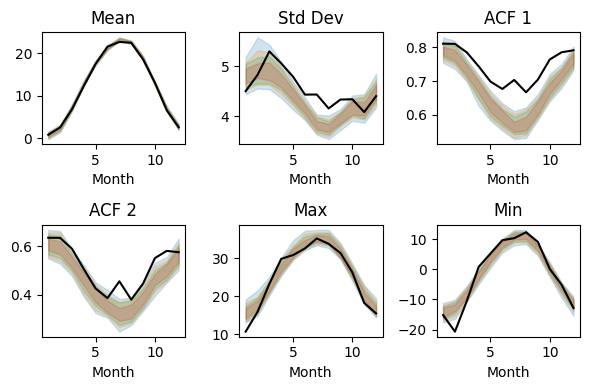

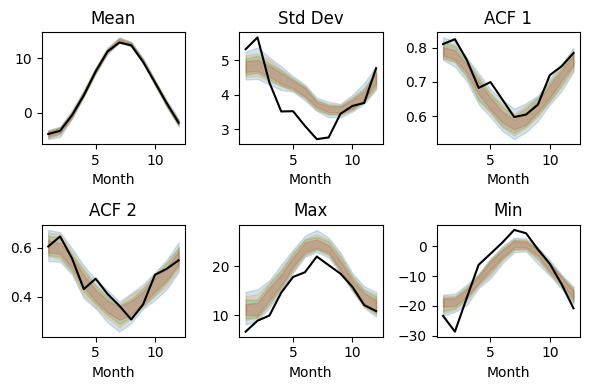

In [565]:
fig = plt.figure(layout="tight", figsize=(6, 4))
#fig.suptitle("Tmax")

gs = GridSpec(2, 3, figure=fig)

# Row 1
ax_row_1 = [fig.add_subplot(gs[0, i]) for i in range(3)]
get_mean_plot(obs["Tmax"], svi_preds["Tmax"], basin_data_train.index, ax=ax_row_1[0])
get_std_plot(obs["Tmax"], svi_preds["Tmax"], basin_data_train.index, ax=ax_row_1[1])
get_acf_plot(obs["Tmax"], svi_preds["Tmax"], basin_data_train.index, ax=ax_row_1[2], lag=1)

ax_row_2 = [fig.add_subplot(gs[1, i]) for i in range(3)]
get_acf_plot(obs["Tmax"], svi_preds["Tmax"], basin_data_train.index, ax=ax_row_2[0], lag=2)
get_max_plot(obs["Tmax"], svi_preds["Tmax"], basin_data_train.index, ax=ax_row_2[1])
get_min_plot(obs["Tmax"], svi_preds["Tmax"], basin_data_train.index, ax=ax_row_2[2])

plt.savefig("plots/tmax_paper.png", dpi = 300)


fig = plt.figure(layout="tight", figsize=(6, 4))
#fig.suptitle("Tmin")
gs = GridSpec(2, 3, figure=fig)

# Row 1
ax_row_1 = [fig.add_subplot(gs[0, i]) for i in range(3)]
get_mean_plot(obs["Tmin"], svi_preds["Tmin"], basin_data_train.index, ax=ax_row_1[0])
get_std_plot(obs["Tmin"], svi_preds["Tmin"], basin_data_train.index, ax=ax_row_1[1])
get_acf_plot(obs["Tmin"], svi_preds["Tmin"], basin_data_train.index, ax=ax_row_1[2], lag=1)

ax_row_2 = [fig.add_subplot(gs[1, i]) for i in range(3)]
get_acf_plot(obs["Tmin"], svi_preds["Tmin"], basin_data_train.index, ax=ax_row_2[0], lag=2)
get_max_plot(obs["Tmin"], svi_preds["Tmin"], basin_data_train.index, ax=ax_row_2[1])
get_min_plot(obs["Tmin"], svi_preds["Tmin"], basin_data_train.index, ax=ax_row_2[2])

plt.savefig("plots/tmin_paper.png", dpi = 300)

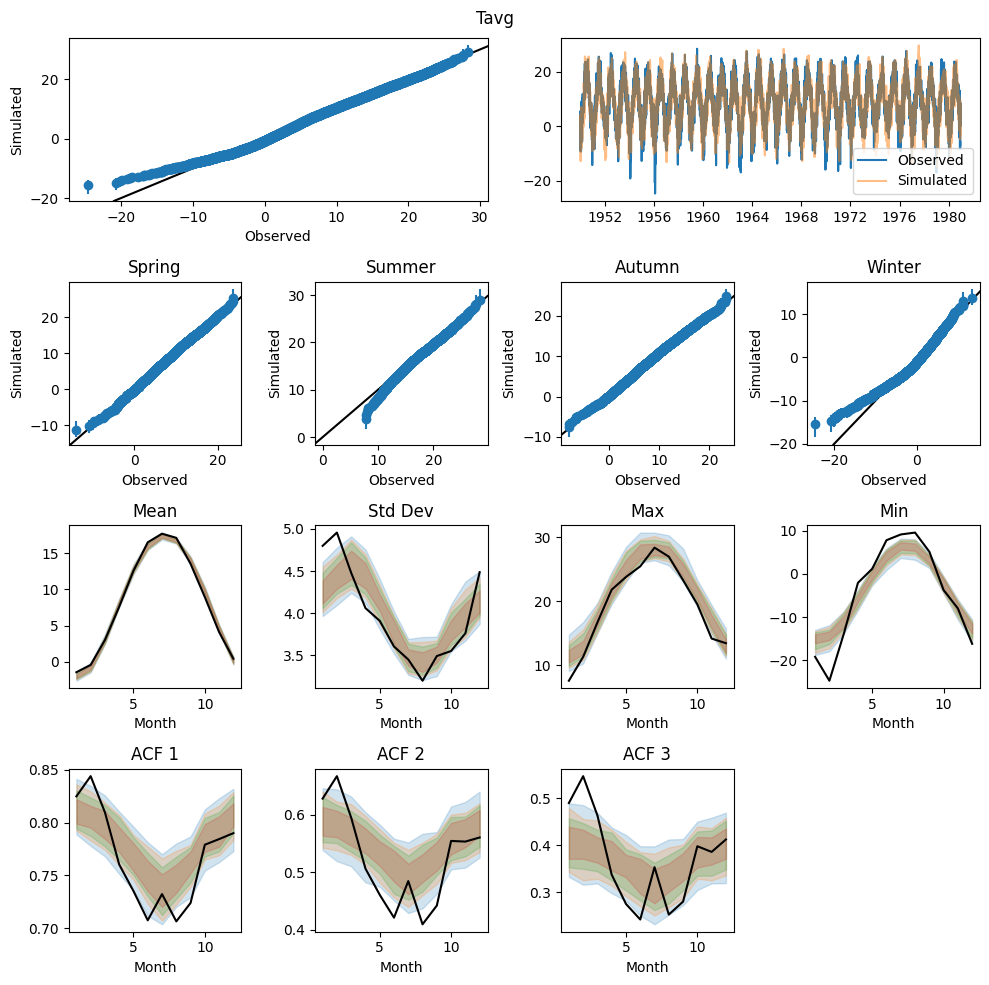

In [26]:
Tavg_overview(obs, svi_preds, basin_data_train)
#plt.savefig("plots/wgen_v5_Tavg.png")

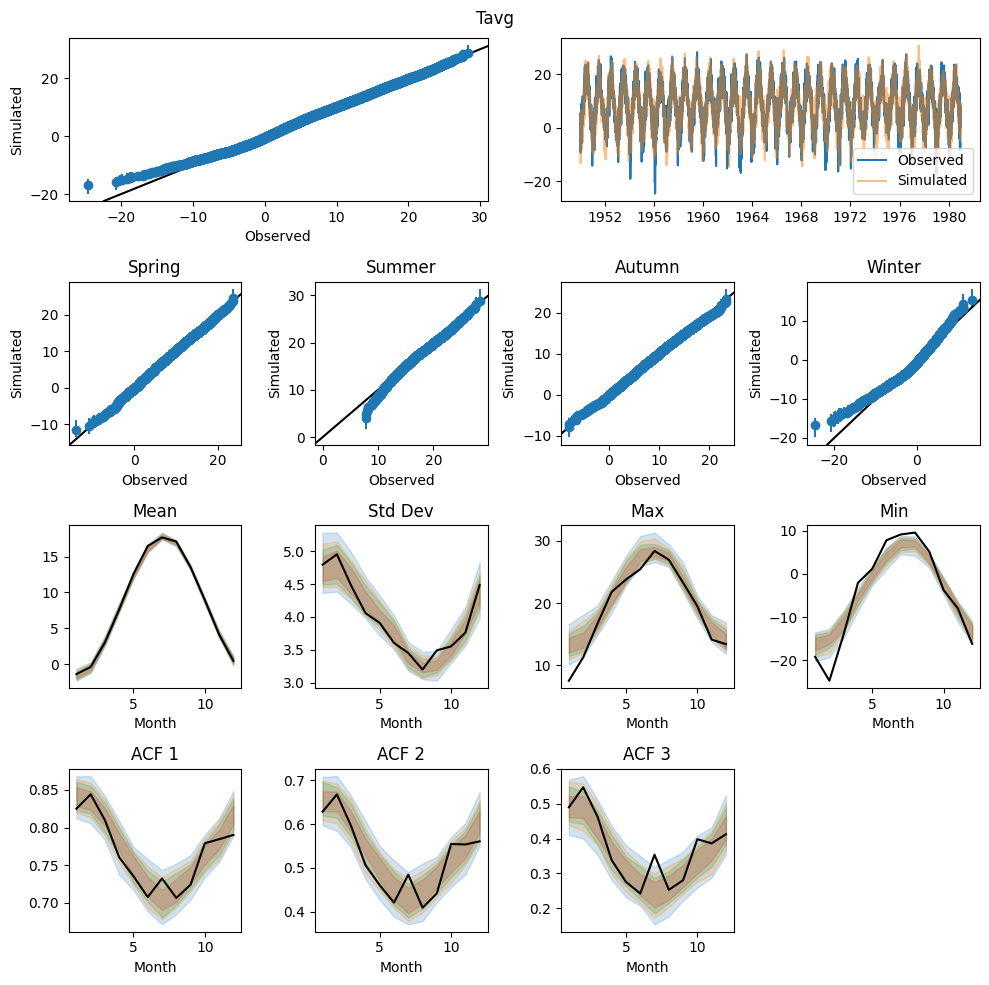

In [46]:
Tavg_overview(obs, svi_preds, basin_data_train)
#plt.savefig("plots/wgen_v5_Tavg.png")

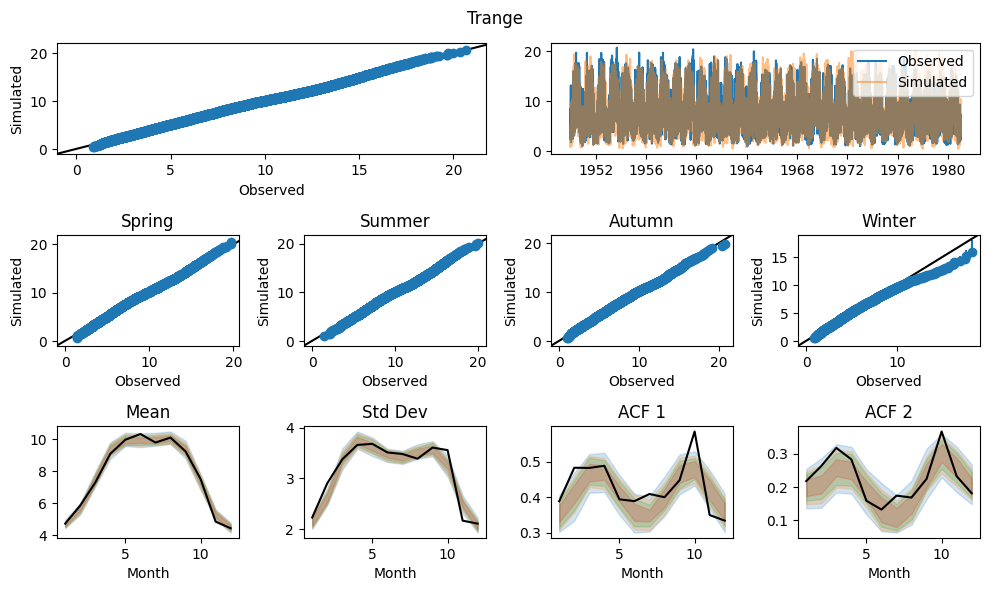

In [47]:
Trange_overview(obs, svi_preds, basin_data_train)
#plt.savefig("plots/wgen_v5_Trange.png")

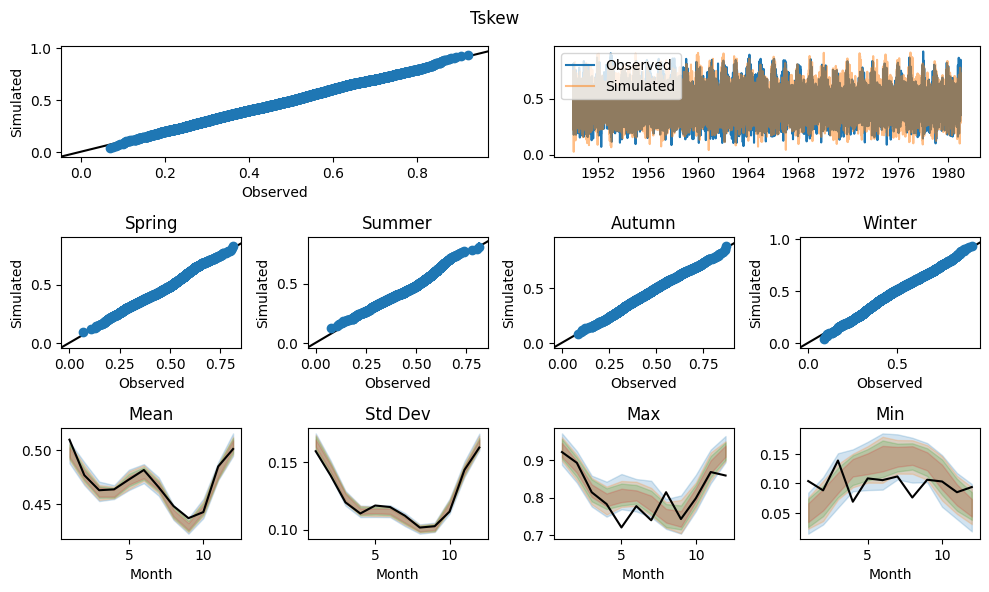

In [48]:
Tskew_overview(obs, svi_preds, basin_data_train)
#plt.savefig("plots/wgen_v5_Tskew.png")

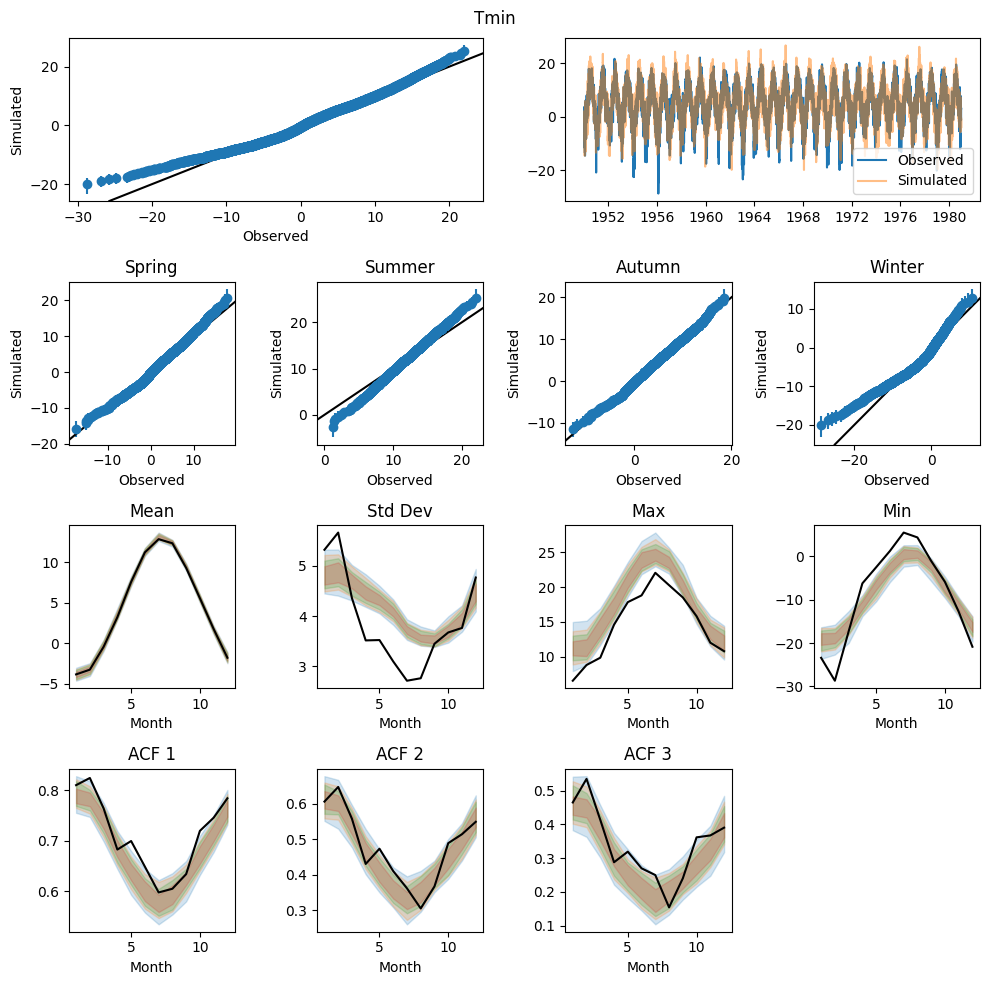

In [49]:
Tmin_overview(obs, svi_preds, basin_data_train)
#plt.savefig("plots/wgen_v5_Tmin.png")

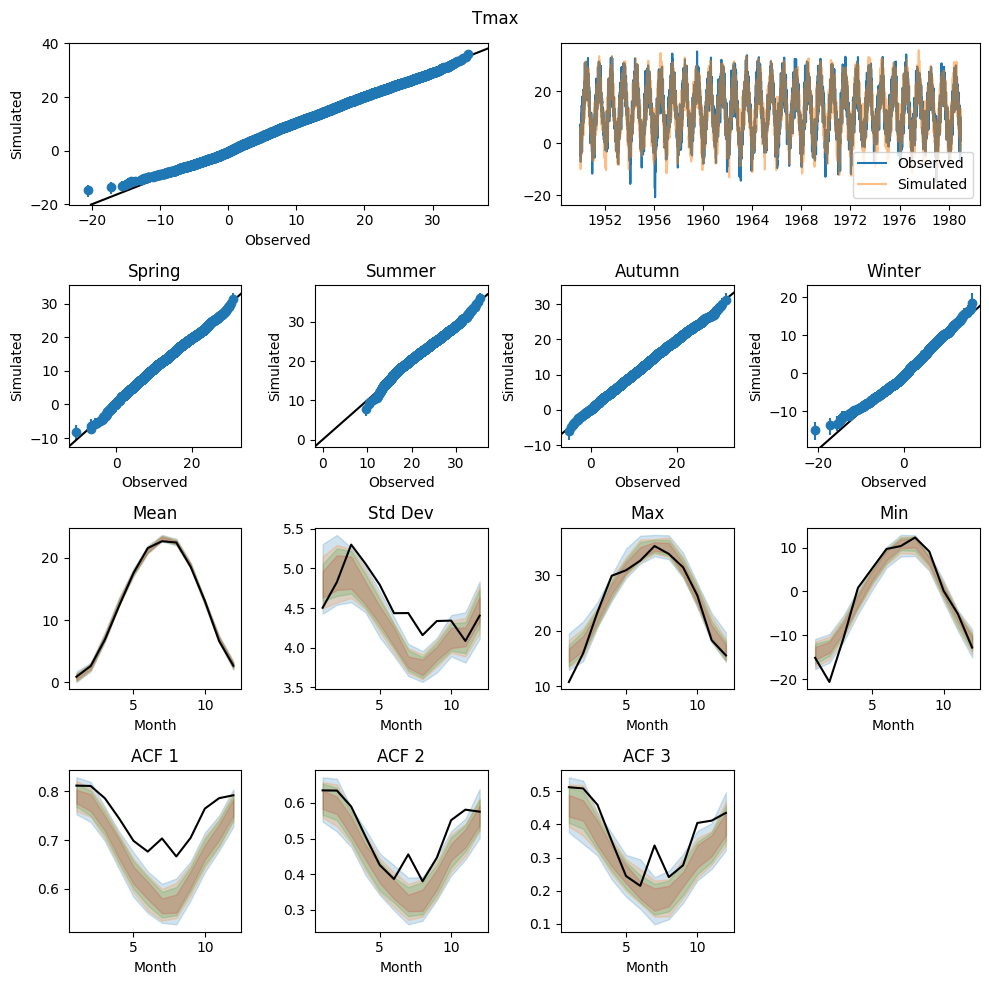

In [50]:
Tmax_overview(obs, svi_preds, basin_data_train)
#plt.savefig("plots/wgen_v5_Tmax.png")

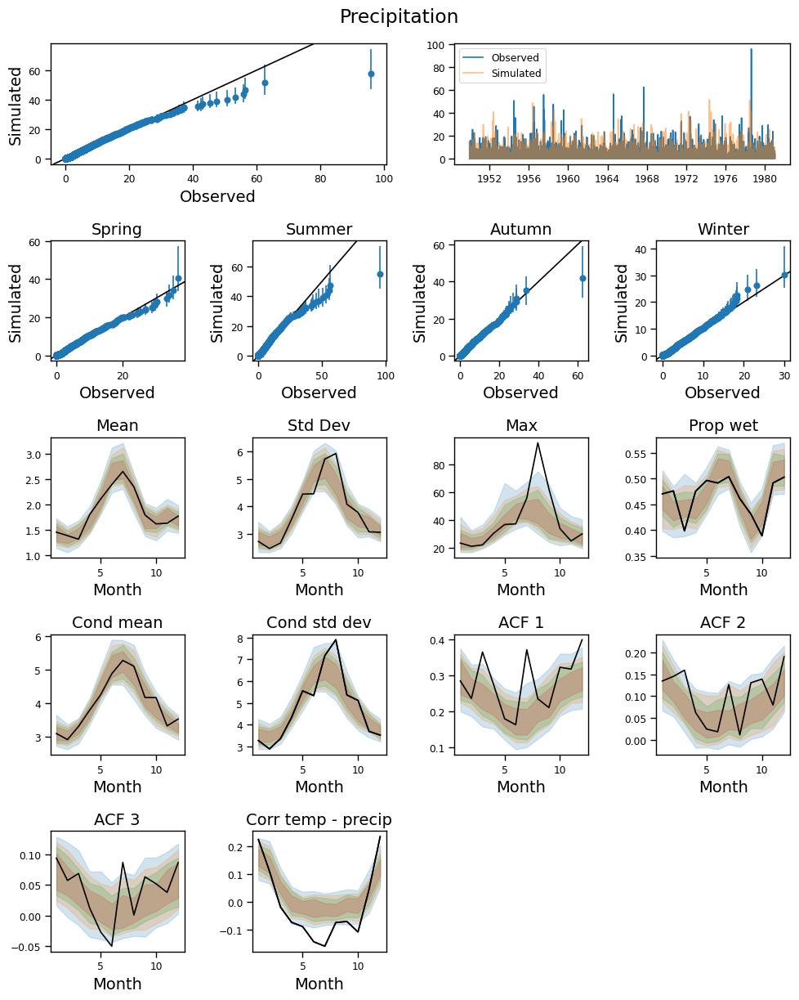

In [522]:
prec_overview(obs, svi_preds, basin_data_train)
plt.savefig("plots/wgen_v5_prec.png")

# SBI

In [37]:
import torch
from jax2torch.jax2torch import jax2torch, j2t, t2j
from sbi.inference import SNPE, SNLE, simulate_for_sbi
from sbi.utils.user_input_checks import process_prior, process_simulator

torch.manual_seed(1234)

In [38]:
def run_sbi(wgen, svi_result, observable_fct, obs_target, scale_factor = 2.5, parameter_mask = None, num_samples = 2000, num_rounds = 10):
    """
    Run SBI on a weather generator to calibrate it to a set of target statistics.

    Args:
        wgen: A WGEN object including a weather generator.
        svi_result: The result of an SVI fit through wgen.fit.
        observable_fct: A function taking as input arrays of realizations of ts, precip, Tmin, Tavg, Tmax and outputting summary statistics.
        obs_target: A vector of target summary statistics.
        scale_factor: Scaling amount for the posterior to obtain the SBI prior.
        parameter_mask: A mask to keep certain parameters from being scaled up. Helps with the SBI fit.
        
    Returns:
        tuple[array,array | None]: outputs, observable

    """
    sim, sim_prior = wgen.simulator(observable=observable_fct, rng_seed=1234) # Generate simulator and prior
    wgen_sbi = jax2torch(sim) # Convert to torch for sbi

    print("Sampling...")

    fitted_posterior = guide.get_posterior(svi_result.params)

    # Sample from mean of fitted posterior
    summary_stats_samples_from_mean_fitted_posterior = wgen_sbi(j2t(fitted_posterior.mean).unsqueeze(0).expand(num_samples, -1))

    # Sample from fitted posterior
    proposal_fitted_posterior = torch.distributions.MultivariateNormal(j2t(fitted_posterior.mean), j2t(fitted_posterior.covariance_matrix))
    samples_from_fitted_posterior = proposal_fitted_posterior.sample((num_samples,))
    summary_stats_samples_from_fitted_posterior = wgen_sbi(samples_from_fitted_posterior)

    # Sample from scaled up posterior (proposal for SBI)
    if parameter_mask is None:
        parameter_mask = 1.
    sbi_proposal = torch.distributions.MultivariateNormal(j2t(fitted_posterior.mean), j2t(jnp.diag(fitted_posterior.covariance_matrix)*jnp.eye(len(fitted_posterior.mean)) + parameter_mask*(scale_factor**2 - 1)*jnp.eye(len(fitted_posterior.mean))* jnp.diag(fitted_posterior.covariance_matrix)))
    samples_from_sbi_proposal = sbi_proposal.sample((num_samples,))
    summary_stats_samples_from_sbi_proposal = wgen_sbi(samples_from_sbi_proposal)

    # Plot fitted posterior and SBI proposal as well as targets
    fig, axs = plt.subplots(1, obs_target.shape[0], figsize = (obs_target.shape[0]*5, 5))
    for i in range(obs_stats.shape[0]):
        axs[i].hist(summary_stats_samples_from_fitted_posterior[:, i].numpy(), bins = 20, density = True, alpha = 0.5, label = "Fitted posterior")
        axs[i].hist(summary_stats_samples_from_sbi_proposal[:, i].numpy(), bins = 30, density = True, alpha = 0.5, label = "Scaled-up posterior")
        axs[i].legend(loc = "upper right")
        axs[i].axvline(obs_target[i,:].flatten(), c= "black")
    plt.show()

    print("Running SBI...")

    # Run SBIne
    sbi_alg = SNPE(sbi_proposal)
    num_simulations = 1000
    proposal = sbi_proposal
    for i in range(num_rounds):
        theta, x = simulate_for_sbi(wgen_sbi, proposal=proposal, num_simulations=num_simulations, simulation_batch_size=500)
        sbi_alg.append_simulations(theta, x, proposal, exclude_invalid_x=True)
        density_estimator = sbi_alg.train()
        sbi_posterior = sbi_alg.build_posterior(density_estimator).set_default_x(j2t(obs_target.squeeze()))
        proposal = sbi_posterior

    print("Sampling SBI posterior and point estimate...")

    # Sample from SBI posterior
    samples_from_sbi_posterior = sbi_posterior.sample((num_samples,))
    summary_stats_samples_from_sbi_posterior = wgen_sbi(samples_from_sbi_posterior)

    # Plot
    fig, axs = plt.subplots(1, obs_target.shape[0], figsize = (obs_target.shape[0]*5, 5))
    for i in range(obs_stats.shape[0]):
        axs[i].hist(summary_stats_samples_from_fitted_posterior[:, i].numpy(), bins = 20, density = True, alpha = 0.5, label = "Fitted posterior")
        axs[i].hist(summary_stats_samples_from_sbi_proposal[:, i].numpy(), bins = 30, density = True, alpha = 0.5, label = "Scaled-up posterior")
        axs[i].hist(summary_stats_samples_from_sbi_posterior[:, i].numpy(), bins = 30, density = True, alpha = 0.5, label = "After SBI")
        axs[i].legend(loc = "upper right")
        axs[i].axvline(obs_target[i,:].flatten(), c= "black")
    plt.show()

    # Get point estimate
    map_estimate = sbi_posterior.map()

    # Dict to return
    samples_summary_stats = {
        "mean_fitted_posterior": summary_stats_samples_from_mean_fitted_posterior,
        "fitted_posterior": summary_stats_samples_from_fitted_posterior, 
        "sbi_proposal": summary_stats_samples_from_sbi_proposal,
        "sbi_posterior": summary_stats_samples_from_sbi_posterior,
        "sbi_posterior_point_estimate": wgen_sbi(map_estimate.expand(num_samples, -1))
    }

    # Get realizations from weather generator
    simulator_get_obs, _ = wgen.simulator(rng_seed=1234)
    simulator_get_obs = jax2torch(simulator_get_obs)
    
    samples_obs = {
        "mean_fitted_posterior": simulator_get_obs(j2t(fitted_posterior.mean).unsqueeze(0).expand(100, -1)),
        "fitted_posterior": simulator_get_obs(proposal_fitted_posterior.sample((100,))),
        "sbi_posterior": simulator_get_obs(sbi_posterior.sample((100,))),
        "sbi_posterior_point_estimate": simulator_get_obs(map_estimate.expand(100, -1))
    }

    return sbi_posterior, samples_summary_stats, samples_obs


def check_if_list_in_string(l, x):
    for elem in l:
        if elem in x:
            return True
    return False
    
def get_parameter_mask(guide, ignore_elems):
    return jnp.concat([jnp.zeros_like(x) if check_if_list_in_string(ignore_elems, k) else jnp.ones_like(x) for k, x in guide._init_locs.items()])


In [39]:
import pickle
import os.path

def save_sbi_case_study(case_study, sbi_posterior, samples_summary_stats, samples_obs, analysis = "analysis_v8"):
    with open(os.path.join("sbi_results", analysis, f"case_study_{case_study}_sbi_posterior.pkl"), "wb") as handle:
        pickle.dump(sbi_posterior, handle)
    torch.save(samples_summary_stats, os.path.join("sbi_results", analysis, f"case_study_{case_study}_samples_summary_stats.pt"))
    torch.save(samples_obs, os.path.join("sbi_results", analysis, f"case_study_{case_study}_samples_summary_obs.pt"))


In [40]:
# Get parameter mask of parameters to ignore
posterior_sampler = Predictive(guide, params=svi_result.params, num_samples=100)
posterior_params = posterior_sampler(prng)


## Case study 1a (Tavg, pr, dry days const.):

Trend in tavg, precip, dry days constant:

In [59]:
num_rounds = 5

In [60]:
def case_study_1a(ts, precip, Tmin, Tavg, Tmax):
    pmean = jnp.mean(precip, axis = 0)
    pavgwet = jnp.mean(precip > 0, axis = 0)
    Tavgmean = jnp.mean(Tavg, axis = 0)
    return jnp.stack([pmean, pavgwet, Tavgmean])

In [61]:
obs['Tmin'] = obs['Tavg'] - obs['Tskew']*obs['Trange']
obs['Tmax'] = obs['Tmin'] + obs['Trange']
obs_stats = case_study_1a(wgen.timestamps[0,:,:], obs['prec'].T, obs['Tmin'].T, obs['Tavg'].T, obs['Tmax'].T)
obs_stats

Array([[1.8636943],
       [0.4654244],
       [8.347303 ]], dtype=float32)

In [62]:
obs_stats_target = obs_stats
obs_stats_target = obs_stats_target.at[0].mul(1.2)
obs_stats_target = obs_stats_target.at[2].add(3.5)
obs_stats_target

Array([[ 2.2364333],
       [ 0.4654244],
       [11.847303 ]], dtype=float32)

Sampling...


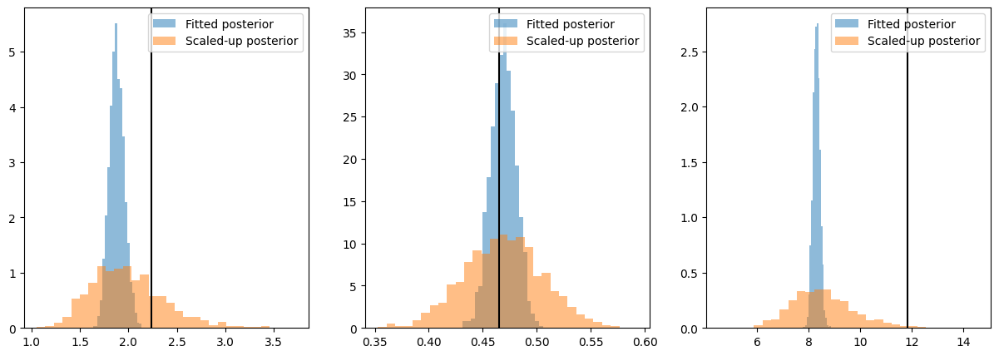

Running SBI...


Running 1000 simulations.: 100%|██████████| 1000/1000 [01:36<00:00, 10.39it/s]


 Neural network successfully converged after 57 epochs.

Running 1000 simulations.: 100%|██████████| 1000/1000 [01:42<00:00,  9.79it/s]


Using SNPE-C with atomic loss
 Neural network successfully converged after 59 epochs.

Running 1000 simulations.: 100%|██████████| 1000/1000 [01:24<00:00, 11.80it/s]


Using SNPE-C with atomic loss
 Neural network successfully converged after 66 epochs.

Running 1000 simulations.: 100%|██████████| 1000/1000 [01:27<00:00, 11.37it/s]


Using SNPE-C with atomic loss
 Neural network successfully converged after 46 epochs.

Running 1000 simulations.: 100%|██████████| 1000/1000 [01:24<00:00, 11.82it/s]


Using SNPE-C with atomic loss
 Neural network successfully converged after 31 epochs.Sampling SBI posterior and point estimate...


Drawing 2000 posterior samples: 100%|██████████| 2000/2000 [00:03<00:00, 506.60it/s]


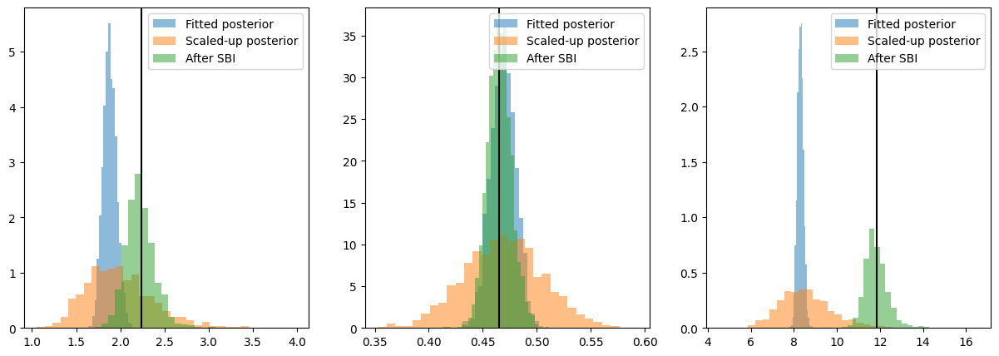

Drawing 100 posterior samples: 100%|██████████| 100/100 [00:00<00:00, 141.79it/s]


In [63]:
parameter_mask = get_parameter_mask(guide, ["Trange", "Tskew", "precip_occ_"])
sbi_posterior, samples_summary_stats, samples_obs = run_sbi(wgen, svi_result, observable_fct = case_study_1a, obs_target = obs_stats_target, scale_factor = 2., parameter_mask = parameter_mask, num_samples = 2000, num_rounds = num_rounds)
save_sbi_case_study("1a", sbi_posterior, samples_summary_stats, samples_obs, analysis = "analysis_v8")

## Case study 1b (as 1a but dry day prior scaled up):

Trend in tavg, precip, dry days constant:

In [66]:
num_rounds = 5

In [68]:
def case_study_1b(ts, precip, Tmin, Tavg, Tmax):
    pmean = jnp.mean(precip, axis = 0)
    pavgwet = jnp.mean(precip > 0, axis = 0)
    Tavgmean = jnp.mean(Tavg, axis = 0)
    return jnp.stack([pmean, pavgwet, Tavgmean])

In [69]:
obs['Tmin'] = obs['Tavg'] - obs['Tskew']*obs['Trange']
obs['Tmax'] = obs['Tmin'] + obs['Trange']
obs_stats = case_study_1b(wgen.timestamps[0,:,:], obs['prec'].T, obs['Tmin'].T, obs['Tavg'].T, obs['Tmax'].T)
obs_stats

Array([[1.8636943],
       [0.4654244],
       [8.347303 ]], dtype=float32)

In [70]:
obs_stats_target = obs_stats
obs_stats_target = obs_stats_target.at[0].mul(1.2)
obs_stats_target = obs_stats_target.at[2].add(3.5)
obs_stats_target

Array([[ 2.2364333],
       [ 0.4654244],
       [11.847303 ]], dtype=float32)

Sampling...


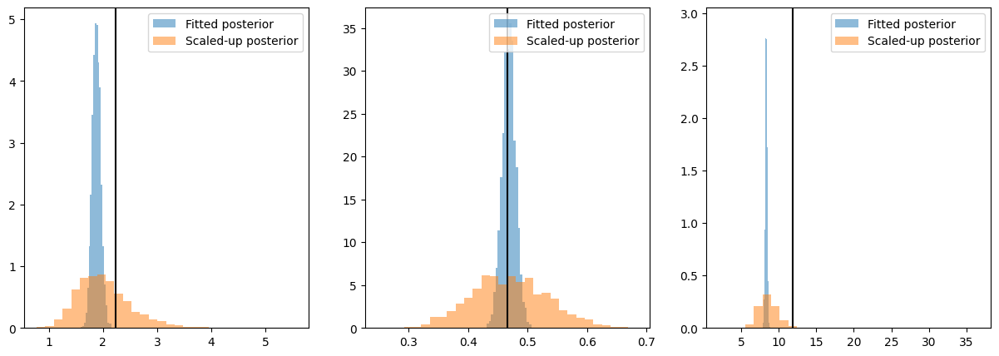

Running SBI...


Running 1000 simulations.: 100%|██████████| 1000/1000 [01:24<00:00, 11.79it/s]


 Neural network successfully converged after 60 epochs.

Running 1000 simulations.: 100%|██████████| 1000/1000 [01:34<00:00, 10.58it/s]


Using SNPE-C with atomic loss
 Neural network successfully converged after 53 epochs.

Running 1000 simulations.: 100%|██████████| 1000/1000 [01:29<00:00, 11.15it/s]


Using SNPE-C with atomic loss
 Neural network successfully converged after 67 epochs.

Running 1000 simulations.: 100%|██████████| 1000/1000 [01:22<00:00, 12.15it/s]


Using SNPE-C with atomic loss
 Neural network successfully converged after 49 epochs.

Running 1000 simulations.: 100%|██████████| 1000/1000 [01:24<00:00, 11.78it/s]


Using SNPE-C with atomic loss
 Neural network successfully converged after 37 epochs.Sampling SBI posterior and point estimate...


Drawing 2000 posterior samples: 100%|██████████| 2000/2000 [00:03<00:00, 551.66it/s]


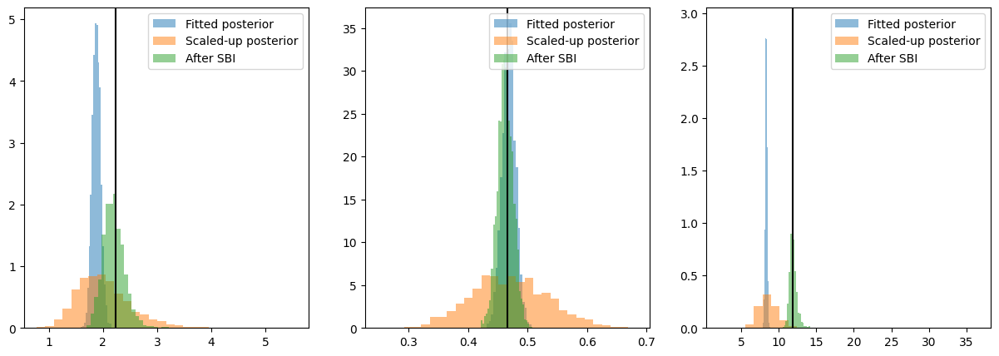

Drawing 100 posterior samples: 100%|██████████| 100/100 [00:00<00:00, 175.24it/s]


In [71]:
parameter_mask = get_parameter_mask(guide, ["Trange", "Tskew"])
sbi_posterior, samples_summary_stats, samples_obs = run_sbi(wgen, svi_result, observable_fct = case_study_1b, obs_target = obs_stats_target, scale_factor = 2., parameter_mask = parameter_mask, num_samples = 2000, num_rounds = num_rounds)
save_sbi_case_study("1b", sbi_posterior, samples_summary_stats, samples_obs, analysis = "analysis_v8")

## Case study 2 (Tavg, pr, heavy rain, icy days, tropical night, Trange)

In [73]:
num_rounds = 10

In [28]:
def case_study_2(ts, precip, Tmin, Tavg, Tmax):
    """
    ts: [1, timesteps, 4], 4: index, year, month, doy
    precip, Tmin, Tavg, Tmax: [timesteps, realizations]
    Returns: [summary_stats, realizations]
    """

    Tavgmean = jnp.mean(Tavg, axis = 0)
    
    pmean = jnp.mean(precip, axis = 0)
    heavy_rain = jnp.mean(precip > 20, axis = 0)

    icy_days = jnp.mean(Tmax < 0, axis = 0)
    tropical_nights = jnp.mean(Tmin > 20, axis = 0)

    Trangemean = jnp.mean(Tmax - Tmin, axis = 0)

    return jnp.stack([Tavgmean, pmean, heavy_rain, icy_days, tropical_nights, Trangemean])

obs['Tmin'] = obs['Tavg'] - obs['Tskew']*obs['Trange']
obs['Tmax'] = obs['Tmin'] + obs['Trange']
obs_stats = case_study_2(jnp.expand_dims(wgen.timestamps[0,:,:], 0), obs['prec'].T, obs['Tmin'].T, obs['Tavg'].T, obs['Tmax'].T)
obs_stats

Array([[8.3473034e+00],
       [1.8636943e+00],
       [7.5951605e-03],
       [8.3811715e-02],
       [5.2989495e-04],
       [7.7874007e+00]], dtype=float32)

In [76]:
obs_stats_target = obs_stats
obs_stats_target = obs_stats_target.at[0].add(3.1) # Tavg 
obs_stats_target = obs_stats_target.at[1].mul(1.3) # pmean 
obs_stats_target = obs_stats_target.at[2].mul(2.) # heavy_rain
obs_stats_target = obs_stats_target.at[3].set(0.01) # icy_days: 3 per year
obs_stats_target = obs_stats_target.at[4].set(0.08) # tropical_nights: 30 per year
obs_stats_target = obs_stats_target.at[5].mul(1.2) # Trangemean

obs_stats_target

Array([[1.1447304e+01],
       [2.4228024e+00],
       [1.5190321e-02],
       [9.9999998e-03],
       [7.9999998e-02],
       [9.3448811e+00]], dtype=float32)

Run SBI:

Sampling...


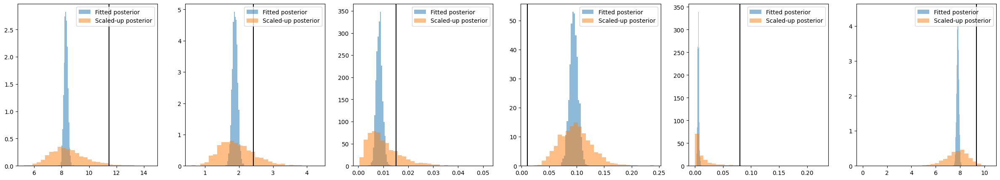

Running SBI...


Running 1000 simulations.: 100%|██████████| 1000/1000 [01:24<00:00, 11.79it/s]


 Neural network successfully converged after 71 epochs.

Running 1000 simulations.: 100%|██████████| 1000/1000 [01:21<00:00, 12.30it/s]


Using SNPE-C with atomic loss
 Neural network successfully converged after 52 epochs.

Running 1000 simulations.: 100%|██████████| 1000/1000 [01:21<00:00, 12.24it/s]


Using SNPE-C with atomic loss
 Neural network successfully converged after 60 epochs.

Running 1000 simulations.: 100%|██████████| 1000/1000 [01:31<00:00, 10.95it/s]


Using SNPE-C with atomic loss
 Neural network successfully converged after 30 epochs.

Running 1000 simulations.: 100%|██████████| 1000/1000 [01:25<00:00, 11.70it/s]


Using SNPE-C with atomic loss
 Neural network successfully converged after 65 epochs.Sampling SBI posterior and point estimate...


Drawing 2000 posterior samples: 100%|██████████| 2000/2000 [00:04<00:00, 415.39it/s]


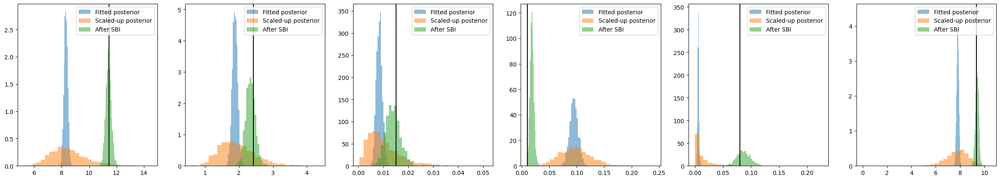

Drawing 100 posterior samples: 100%|██████████| 100/100 [00:00<00:00, 174.71it/s]


In [78]:
parameter_mask = get_parameter_mask(guide, ["seasonal"])
sbi_posterior, samples_summary_stats, samples_obs = run_sbi(wgen, svi_result, observable_fct = case_study_2, obs_target = obs_stats_target, scale_factor = 2.5, parameter_mask = parameter_mask, num_samples = 2000, num_rounds = 5)
save_sbi_case_study("2", sbi_posterior, samples_summary_stats, samples_obs, analysis = "analysis_v8")

## Case study 3a (seasonal Tavg, pr, monthly dry days const)

In [80]:
num_rounds = 10

In [82]:
def case_study_3a(ts, precip, Tmin, Tavg, Tmax):
    """
    ts: [1, timesteps, 4], 4: index, year, month, doy
    precip, Tmin, Tavg, Tmax: [timesteps, realizations]
    Returns: [summary_stats, realizations]
    """
    winter = jnp.isin(ts[:, :, 2], jnp.array([12, 1, 2])).T
    spring = jnp.isin(ts[:, :, 2], jnp.array([3, 4, 5])).T
    summer = jnp.isin(ts[:, :, 2], jnp.array([6, 7, 8])).T
    autumn = jnp.isin(ts[:, :, 2], jnp.array([9, 10, 11])).T

    pmean_winter = jnp.nanmean(jnp.where(winter, precip, jnp.nan), axis = 0)
    pmean_spring = jnp.nanmean(jnp.where(spring, precip, jnp.nan), axis = 0)
    pmean_summer = jnp.nanmean(jnp.where(summer, precip, jnp.nan), axis = 0)
    pmean_autumn = jnp.nanmean(jnp.where(autumn, precip, jnp.nan), axis = 0)

    wet = (precip > 0)
    
    monthly_pavg_wet = []
    for i in range(1, 13):
        month = (ts[:, :, 2] == i).T
        pavgwet_month = jnp.nanmean(jnp.where(month, wet, jnp.nan), axis = 0)
        monthly_pavg_wet.append(pavgwet_month)
    
    Tavg_winter = jnp.nanmean(jnp.where(winter, Tavg, jnp.nan), axis = 0)
    Tavg_spring = jnp.nanmean(jnp.where(spring, Tavg, jnp.nan), axis = 0)
    Tavg_summer = jnp.nanmean(jnp.where(summer, Tavg, jnp.nan), axis = 0)
    Tavg_autumn = jnp.nanmean(jnp.where(autumn, Tavg, jnp.nan), axis = 0)

    #icy_days = jnp.mean(Tmax < 0, axis = 0)
    #heavy_rain = jnp.mean(precip > 20, axis = 0)

    return jnp.stack([pmean_winter, pmean_spring, pmean_summer, pmean_autumn, Tavg_winter, Tavg_spring, Tavg_summer, Tavg_autumn, *monthly_pavg_wet])#, icy_days])

obs['Tmin'] = obs['Tavg'] - obs['Tskew']*obs['Trange']
obs['Tmax'] = obs['Tmin'] + obs['Trange']
obs_stats = case_study_3a(jnp.expand_dims(wgen.timestamps[0,:,:], 0), obs['prec'].T, obs['Tmin'].T, obs['Tavg'].T, obs['Tmax'].T)
obs_stats

Array([[ 1.5461818 ],
       [ 1.7449532 ],
       [ 2.4704154 ],
       [ 1.6852754 ],
       [-0.46448863],
       [ 7.7378182 ],
       [17.098232  ],
       [ 8.8563385 ],
       [ 0.47034338],
       [ 0.4760274 ],
       [ 0.39854318],
       [ 0.4752688 ],
       [ 0.49635795],
       [ 0.49139786],
       [ 0.503642  ],
       [ 0.46097815],
       [ 0.4311828 ],
       [ 0.38917795],
       [ 0.49139786],
       [ 0.50260144]], dtype=float32)

In [83]:
obs_stats_target = obs_stats
obs_stats_target = obs_stats_target.at[0].mul(1.3) # pmean winter
obs_stats_target = obs_stats_target.at[1].mul(1.3) # pmean spring
obs_stats_target = obs_stats_target.at[2].mul(1.) # pmean summer
obs_stats_target = obs_stats_target.at[3].mul(1.15) # pmean autumn

obs_stats_target = obs_stats_target.at[4].add(3.4) # Tavg winter
obs_stats_target = obs_stats_target.at[5].add(2.6) # Tavg spring
obs_stats_target = obs_stats_target.at[6].add(3.1) # Tavg summer
obs_stats_target = obs_stats_target.at[7].add(4.5) # Tavg autumn

obs_stats_target

Array([[ 2.0100362 ],
       [ 2.268439  ],
       [ 2.4704154 ],
       [ 1.9380667 ],
       [ 2.9355116 ],
       [10.337818  ],
       [20.198233  ],
       [13.3563385 ],
       [ 0.47034338],
       [ 0.4760274 ],
       [ 0.39854318],
       [ 0.4752688 ],
       [ 0.49635795],
       [ 0.49139786],
       [ 0.503642  ],
       [ 0.46097815],
       [ 0.4311828 ],
       [ 0.38917795],
       [ 0.49139786],
       [ 0.50260144]], dtype=float32)

Run SBI:

Sampling...


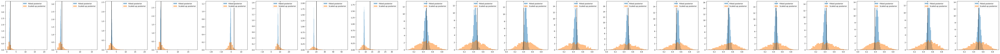

Running SBI...


Running 1000 simulations.: 100%|██████████| 1000/1000 [01:32<00:00, 10.78it/s]


 Neural network successfully converged after 85 epochs.

Running 1000 simulations.: 100%|██████████| 1000/1000 [01:27<00:00, 11.44it/s]


Using SNPE-C with atomic loss
 Neural network successfully converged after 31 epochs.

Running 1000 simulations.: 100%|██████████| 1000/1000 [01:26<00:00, 11.51it/s]


Using SNPE-C with atomic loss
 Neural network successfully converged after 60 epochs.

Running 1000 simulations.: 100%|██████████| 1000/1000 [01:25<00:00, 11.68it/s]


Using SNPE-C with atomic loss
 Neural network successfully converged after 43 epochs.

Running 1000 simulations.: 100%|██████████| 1000/1000 [01:32<00:00, 10.78it/s]


Using SNPE-C with atomic loss
 Neural network successfully converged after 32 epochs.

Running 1000 simulations.: 100%|██████████| 1000/1000 [01:28<00:00, 11.35it/s]


Using SNPE-C with atomic loss
 Neural network successfully converged after 56 epochs.

Running 1000 simulations.: 100%|██████████| 1000/1000 [01:23<00:00, 12.04it/s]


Using SNPE-C with atomic loss
 Neural network successfully converged after 45 epochs.

Running 1000 simulations.: 100%|██████████| 1000/1000 [01:24<00:00, 11.88it/s]


Using SNPE-C with atomic loss
 Neural network successfully converged after 53 epochs.

Running 1000 simulations.: 100%|██████████| 1000/1000 [01:23<00:00, 12.00it/s]


Using SNPE-C with atomic loss
 Neural network successfully converged after 59 epochs.

Running 1000 simulations.: 100%|██████████| 1000/1000 [01:25<00:00, 11.70it/s]


Using SNPE-C with atomic loss
 Neural network successfully converged after 59 epochs.Sampling SBI posterior and point estimate...


Drawing 2000 posterior samples: 100%|██████████| 2000/2000 [00:03<00:00, 585.85it/s]


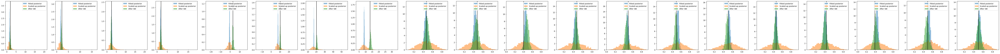

Drawing 100 posterior samples: 100%|██████████| 100/100 [00:00<00:00, 162.60it/s]


In [85]:
parameter_mask = get_parameter_mask(guide, ["Trange", "Tskew"])
sbi_posterior, samples_summary_stats, samples_obs = run_sbi(wgen, svi_result, observable_fct = case_study_3a, obs_target = obs_stats_target, scale_factor = 2.5, parameter_mask = parameter_mask, num_samples = 2000, num_rounds = num_rounds)
save_sbi_case_study("3a", sbi_posterior, samples_summary_stats, samples_obs, analysis = "analysis_v8")

## Case study 3b (seasonal Tavg, pr, overall dry days const, tight prior)

In [45]:
num_rounds = 10

In [91]:
def case_study_3b(ts, precip, Tmin, Tavg, Tmax):
    """
    ts: [1, timesteps, 4], 4: index, year, month, doy
    precip, Tmin, Tavg, Tmax: [timesteps, realizations]
    Returns: [summary_stats, realizations]
    """
    winter = jnp.isin(ts[:, :, 2], jnp.array([12, 1, 2])).T
    spring = jnp.isin(ts[:, :, 2], jnp.array([3, 4, 5])).T
    summer = jnp.isin(ts[:, :, 2], jnp.array([6, 7, 8])).T
    autumn = jnp.isin(ts[:, :, 2], jnp.array([9, 10, 11])).T

    pmean_winter = jnp.nanmean(jnp.where(winter, precip, jnp.nan), axis = 0)
    pmean_spring = jnp.nanmean(jnp.where(spring, precip, jnp.nan), axis = 0)
    pmean_summer = jnp.nanmean(jnp.where(summer, precip, jnp.nan), axis = 0)
    pmean_autumn = jnp.nanmean(jnp.where(autumn, precip, jnp.nan), axis = 0)

    wet = (precip > 0)
    pavg_wet = jnp.nanmean(wet, axis = 0)
    
    Tavg_winter = jnp.nanmean(jnp.where(winter, Tavg, jnp.nan), axis = 0)
    Tavg_spring = jnp.nanmean(jnp.where(spring, Tavg, jnp.nan), axis = 0)
    Tavg_summer = jnp.nanmean(jnp.where(summer, Tavg, jnp.nan), axis = 0)
    Tavg_autumn = jnp.nanmean(jnp.where(autumn, Tavg, jnp.nan), axis = 0)

    #icy_days = jnp.mean(Tmax < 0, axis = 0)
    #heavy_rain = jnp.mean(precip > 20, axis = 0)

    return jnp.stack([pmean_winter, pmean_spring, pmean_summer, pmean_autumn, Tavg_winter, Tavg_spring, Tavg_summer, Tavg_autumn, pavg_wet])#, icy_days])

obs['Tmin'] = obs['Tavg'] - obs['Tskew']*obs['Trange']
obs['Tmax'] = obs['Tmin'] + obs['Trange']
obs_stats = case_study_3b(jnp.expand_dims(wgen.timestamps[0,:,:], 0), obs['prec'].T, obs['Tmin'].T, obs['Tavg'].T, obs['Tmax'].T)
obs_stats

Array([[ 1.5461818 ],
       [ 1.7449532 ],
       [ 2.4704154 ],
       [ 1.6852754 ],
       [-0.46448863],
       [ 7.7378182 ],
       [17.098232  ],
       [ 8.8563385 ],
       [ 0.4654244 ]], dtype=float32)

In [93]:
obs_stats_target = obs_stats
obs_stats_target = obs_stats_target.at[0].mul(1.3) # pmean winter
obs_stats_target = obs_stats_target.at[1].mul(1.3) # pmean spring
obs_stats_target = obs_stats_target.at[2].mul(1.) # pmean summer
obs_stats_target = obs_stats_target.at[3].mul(1.15) # pmean autumn

obs_stats_target = obs_stats_target.at[4].add(3.4) # Tavg winter
obs_stats_target = obs_stats_target.at[5].add(2.6) # Tavg spring
obs_stats_target = obs_stats_target.at[6].add(3.1) # Tavg summer
obs_stats_target = obs_stats_target.at[7].add(4.5) # Tavg autumn

obs_stats_target

Array([[ 2.0100362],
       [ 2.268439 ],
       [ 2.4704154],
       [ 1.9380667],
       [ 2.9355116],
       [10.337818 ],
       [20.198233 ],
       [13.3563385],
       [ 0.4654244]], dtype=float32)

Run SBI:

Sampling...


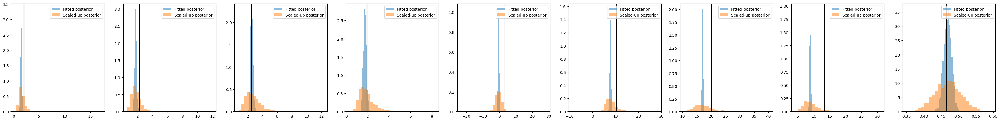

Running SBI...


Running 1000 simulations.: 100%|██████████| 1000/1000 [01:18<00:00, 12.73it/s]


 Neural network successfully converged after 60 epochs.

Running 1000 simulations.: 100%|██████████| 1000/1000 [01:23<00:00, 11.93it/s]


Using SNPE-C with atomic loss
 Neural network successfully converged after 65 epochs.

Running 1000 simulations.: 100%|██████████| 1000/1000 [01:20<00:00, 12.48it/s]


Using SNPE-C with atomic loss
 Neural network successfully converged after 29 epochs.

Running 1000 simulations.: 100%|██████████| 1000/1000 [01:21<00:00, 12.33it/s]


Using SNPE-C with atomic loss
 Neural network successfully converged after 59 epochs.

Running 1000 simulations.: 100%|██████████| 1000/1000 [01:37<00:00, 10.21it/s]


Using SNPE-C with atomic loss
 Neural network successfully converged after 54 epochs.

Running 1000 simulations.: 100%|██████████| 1000/1000 [01:25<00:00, 11.64it/s]


Using SNPE-C with atomic loss
 Neural network successfully converged after 48 epochs.

Running 1000 simulations.: 100%|██████████| 1000/1000 [01:24<00:00, 11.78it/s]


Using SNPE-C with atomic loss
 Neural network successfully converged after 21 epochs.

Running 1000 simulations.: 100%|██████████| 1000/1000 [01:27<00:00, 11.44it/s]


Using SNPE-C with atomic loss
 Neural network successfully converged after 56 epochs.

Running 1000 simulations.: 100%|██████████| 1000/1000 [01:26<00:00, 11.56it/s]


Using SNPE-C with atomic loss
 Neural network successfully converged after 47 epochs.

Running 1000 simulations.: 100%|██████████| 1000/1000 [01:40<00:00,  9.94it/s]


Using SNPE-C with atomic loss
 Neural network successfully converged after 29 epochs.Sampling SBI posterior and point estimate...


Drawing 2000 posterior samples: 100%|██████████| 2000/2000 [00:16<00:00, 119.09it/s]


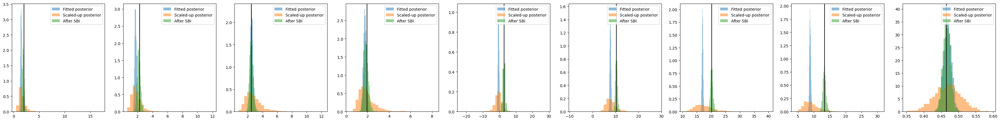

Drawing 100 posterior samples: 100%|██████████| 100/100 [00:00<00:00, 143.88it/s]


In [51]:
parameter_mask = get_parameter_mask(guide, ["Trange", "Tskew", "precip_occ_"])
sbi_posterior, samples_summary_stats, samples_obs = run_sbi(wgen, svi_result, observable_fct = case_study_3b, obs_target = obs_stats_target, scale_factor = 2.5, parameter_mask = parameter_mask, num_samples = 2000, num_rounds = num_rounds)
save_sbi_case_study("3b", sbi_posterior, samples_summary_stats, samples_obs, analysis = "analysis_v8")

## Case study 3c (seasonal Tavg, pr, overall dry days const, large prior)

In [93]:
num_rounds = 10

In [94]:
def case_study_3c(ts, precip, Tmin, Tavg, Tmax):
    """
    ts: [1, timesteps, 4], 4: index, year, month, doy
    precip, Tmin, Tavg, Tmax: [timesteps, realizations]
    Returns: [summary_stats, realizations]
    """
    winter = jnp.isin(ts[:, :, 2], jnp.array([12, 1, 2])).T
    spring = jnp.isin(ts[:, :, 2], jnp.array([3, 4, 5])).T
    summer = jnp.isin(ts[:, :, 2], jnp.array([6, 7, 8])).T
    autumn = jnp.isin(ts[:, :, 2], jnp.array([9, 10, 11])).T

    pmean_winter = jnp.nanmean(jnp.where(winter, precip, jnp.nan), axis = 0)
    pmean_spring = jnp.nanmean(jnp.where(spring, precip, jnp.nan), axis = 0)
    pmean_summer = jnp.nanmean(jnp.where(summer, precip, jnp.nan), axis = 0)
    pmean_autumn = jnp.nanmean(jnp.where(autumn, precip, jnp.nan), axis = 0)

    wet = (precip > 0)
    pavg_wet = jnp.nanmean(wet, axis = 0)
    
    Tavg_winter = jnp.nanmean(jnp.where(winter, Tavg, jnp.nan), axis = 0)
    Tavg_spring = jnp.nanmean(jnp.where(spring, Tavg, jnp.nan), axis = 0)
    Tavg_summer = jnp.nanmean(jnp.where(summer, Tavg, jnp.nan), axis = 0)
    Tavg_autumn = jnp.nanmean(jnp.where(autumn, Tavg, jnp.nan), axis = 0)

    #icy_days = jnp.mean(Tmax < 0, axis = 0)
    #heavy_rain = jnp.mean(precip > 20, axis = 0)

    return jnp.stack([pmean_winter, pmean_spring, pmean_summer, pmean_autumn, Tavg_winter, Tavg_spring, Tavg_summer, Tavg_autumn, pavg_wet])#, icy_days])

obs['Tmin'] = obs['Tavg'] - obs['Tskew']*obs['Trange']
obs['Tmax'] = obs['Tmin'] + obs['Trange']
obs_stats = case_study_3c(jnp.expand_dims(wgen.timestamps[0,:,:], 0), obs['prec'].T, obs['Tmin'].T, obs['Tavg'].T, obs['Tmax'].T)
obs_stats

Array([[ 1.5461818 ],
       [ 1.7449532 ],
       [ 2.4704154 ],
       [ 1.6852754 ],
       [-0.46448863],
       [ 7.7378182 ],
       [17.098232  ],
       [ 8.8563385 ],
       [ 0.4654244 ]], dtype=float32)

In [95]:
obs_stats_target = obs_stats
obs_stats_target = obs_stats_target.at[0].mul(1.3) # pmean winter
obs_stats_target = obs_stats_target.at[1].mul(1.3) # pmean spring
obs_stats_target = obs_stats_target.at[2].mul(1.) # pmean summer
obs_stats_target = obs_stats_target.at[3].mul(1.15) # pmean autumn

obs_stats_target = obs_stats_target.at[4].add(3.4) # Tavg winter
obs_stats_target = obs_stats_target.at[5].add(2.6) # Tavg spring
obs_stats_target = obs_stats_target.at[6].add(3.1) # Tavg summer
obs_stats_target = obs_stats_target.at[7].add(4.5) # Tavg autumn

obs_stats_target

Array([[ 2.0100362],
       [ 2.268439 ],
       [ 2.4704154],
       [ 1.9380667],
       [ 2.9355116],
       [10.337818 ],
       [20.198233 ],
       [13.3563385],
       [ 0.4654244]], dtype=float32)

Run SBI:

Sampling...


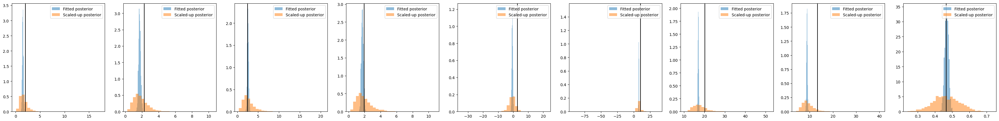

Running SBI...


Running 1000 simulations.: 100%|██████████| 1000/1000 [02:29<00:00,  6.68it/s]


 Neural network successfully converged after 89 epochs.

Running 1000 simulations.: 100%|██████████| 1000/1000 [01:36<00:00, 10.37it/s]


Using SNPE-C with atomic loss
 Neural network successfully converged after 68 epochs.

Running 1000 simulations.: 100%|██████████| 1000/1000 [01:32<00:00, 10.79it/s]


Using SNPE-C with atomic loss
 Neural network successfully converged after 26 epochs.

Running 1000 simulations.: 100%|██████████| 1000/1000 [01:32<00:00, 10.82it/s]


Using SNPE-C with atomic loss
 Neural network successfully converged after 32 epochs.

Running 1000 simulations.: 100%|██████████| 1000/1000 [01:32<00:00, 10.78it/s]


Using SNPE-C with atomic loss
 Neural network successfully converged after 63 epochs.

Running 1000 simulations.: 100%|██████████| 1000/1000 [01:30<00:00, 11.10it/s]


Using SNPE-C with atomic loss
 Neural network successfully converged after 69 epochs.

Running 1000 simulations.: 100%|██████████| 1000/1000 [01:25<00:00, 11.72it/s]


Using SNPE-C with atomic loss
 Neural network successfully converged after 35 epochs.

Running 1000 simulations.: 100%|██████████| 1000/1000 [01:22<00:00, 12.10it/s]


Using SNPE-C with atomic loss
 Neural network successfully converged after 32 epochs.

Running 1000 simulations.: 100%|██████████| 1000/1000 [01:23<00:00, 11.99it/s]


Using SNPE-C with atomic loss
 Neural network successfully converged after 77 epochs.

Running 1000 simulations.: 100%|██████████| 1000/1000 [01:24<00:00, 11.89it/s]


Using SNPE-C with atomic loss
 Neural network successfully converged after 23 epochs.Sampling SBI posterior and point estimate...


Drawing 2000 posterior samples: 100%|██████████| 2000/2000 [00:03<00:00, 607.42it/s]


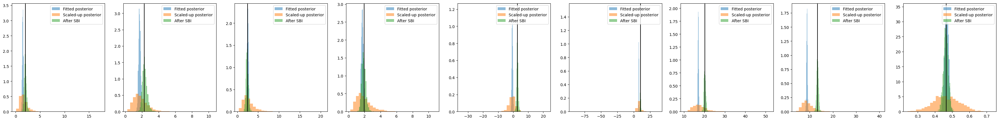

Drawing 100 posterior samples: 100%|██████████| 100/100 [00:00<00:00, 153.08it/s]


In [97]:
parameter_mask = get_parameter_mask(guide, ["Trange", "Tskew"])
sbi_posterior, samples_summary_stats, samples_obs = run_sbi(wgen, svi_result, observable_fct = case_study_3c, obs_target = obs_stats_target, scale_factor = 2.5, parameter_mask = parameter_mask, num_samples = 2000, num_rounds = num_rounds)
save_sbi_case_study("3c", sbi_posterior, samples_summary_stats, samples_obs, analysis = "analysis_v8")

## Case study 3d (seasonal Tavg, pr)

In [99]:
num_rounds = 10

In [95]:
def case_study_3d(ts, precip, Tmin, Tavg, Tmax):
    """
    ts: [1, timesteps, 4], 4: index, year, month, doy
    precip, Tmin, Tavg, Tmax: [timesteps, realizations]
    Returns: [summary_stats, realizations]
    """
    winter = jnp.isin(ts[:, :, 2], jnp.array([12, 1, 2])).T
    spring = jnp.isin(ts[:, :, 2], jnp.array([3, 4, 5])).T
    summer = jnp.isin(ts[:, :, 2], jnp.array([6, 7, 8])).T
    autumn = jnp.isin(ts[:, :, 2], jnp.array([9, 10, 11])).T

    pmean_winter = jnp.nanmean(jnp.where(winter, precip, jnp.nan), axis = 0)
    pmean_spring = jnp.nanmean(jnp.where(spring, precip, jnp.nan), axis = 0)
    pmean_summer = jnp.nanmean(jnp.where(summer, precip, jnp.nan), axis = 0)
    pmean_autumn = jnp.nanmean(jnp.where(autumn, precip, jnp.nan), axis = 0)
    
    Tavg_winter = jnp.nanmean(jnp.where(winter, Tavg, jnp.nan), axis = 0)
    Tavg_spring = jnp.nanmean(jnp.where(spring, Tavg, jnp.nan), axis = 0)
    Tavg_summer = jnp.nanmean(jnp.where(summer, Tavg, jnp.nan), axis = 0)
    Tavg_autumn = jnp.nanmean(jnp.where(autumn, Tavg, jnp.nan), axis = 0)

    #icy_days = jnp.mean(Tmax < 0, axis = 0)
    #heavy_rain = jnp.mean(precip > 20, axis = 0)

    return jnp.stack([pmean_winter, pmean_spring, pmean_summer, pmean_autumn, Tavg_winter, Tavg_spring, Tavg_summer, Tavg_autumn])#, icy_days])

obs['Tmin'] = obs['Tavg'] - obs['Tskew']*obs['Trange']
obs['Tmax'] = obs['Tmin'] + obs['Trange']
obs_stats = case_study_3d(jnp.expand_dims(wgen.timestamps[0,:,:], 0), obs['prec'].T, obs['Tmin'].T, obs['Tavg'].T, obs['Tmax'].T)
obs_stats

Array([[ 1.5461818 ],
       [ 1.7449532 ],
       [ 2.4704154 ],
       [ 1.6852754 ],
       [-0.46448863],
       [ 7.7378182 ],
       [17.098232  ],
       [ 8.8563385 ]], dtype=float32)

In [97]:
obs_stats_target = obs_stats
obs_stats_target = obs_stats_target.at[0].mul(1.3) # pmean winter
obs_stats_target = obs_stats_target.at[1].mul(1.3) # pmean spring
obs_stats_target = obs_stats_target.at[2].mul(1.) # pmean summer
obs_stats_target = obs_stats_target.at[3].mul(1.15) # pmean autumn

obs_stats_target = obs_stats_target.at[4].add(3.4) # Tavg winter
obs_stats_target = obs_stats_target.at[5].add(2.6) # Tavg spring
obs_stats_target = obs_stats_target.at[6].add(3.1) # Tavg summer
obs_stats_target = obs_stats_target.at[7].add(4.5) # Tavg autumn

obs_stats_target

Array([[ 2.0100362],
       [ 2.268439 ],
       [ 2.4704154],
       [ 1.9380667],
       [ 2.9355116],
       [10.337818 ],
       [20.198233 ],
       [13.3563385]], dtype=float32)

Run SBI:

Sampling...


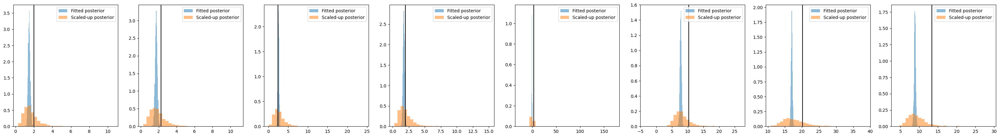

Running SBI...


Running 1000 simulations.: 100%|██████████| 1000/1000 [01:25<00:00, 11.69it/s]


 Neural network successfully converged after 70 epochs.

Running 1000 simulations.: 100%|██████████| 1000/1000 [01:19<00:00, 12.56it/s]


Using SNPE-C with atomic loss
 Neural network successfully converged after 62 epochs.

Running 1000 simulations.: 100%|██████████| 1000/1000 [01:20<00:00, 12.50it/s]


Using SNPE-C with atomic loss
 Neural network successfully converged after 49 epochs.

Running 1000 simulations.: 100%|██████████| 1000/1000 [01:27<00:00, 11.46it/s]


Using SNPE-C with atomic loss
 Neural network successfully converged after 32 epochs.

Running 1000 simulations.: 100%|██████████| 1000/1000 [01:21<00:00, 12.31it/s]


Using SNPE-C with atomic loss
 Neural network successfully converged after 30 epochs.

Running 1000 simulations.: 100%|██████████| 1000/1000 [01:22<00:00, 12.06it/s]


Using SNPE-C with atomic loss
 Neural network successfully converged after 24 epochs.

Running 1000 simulations.: 100%|██████████| 1000/1000 [01:21<00:00, 12.26it/s]


Using SNPE-C with atomic loss
 Neural network successfully converged after 32 epochs.

Running 1000 simulations.: 100%|██████████| 1000/1000 [01:23<00:00, 12.04it/s]


Using SNPE-C with atomic loss
 Neural network successfully converged after 33 epochs.

Running 1000 simulations.: 100%|██████████| 1000/1000 [01:29<00:00, 11.14it/s]


Using SNPE-C with atomic loss
 Neural network successfully converged after 83 epochs.

Running 1000 simulations.: 100%|██████████| 1000/1000 [06:47<00:00,  2.46it/s]


Using SNPE-C with atomic loss
 Neural network successfully converged after 46 epochs.Sampling SBI posterior and point estimate...


Drawing 2000 posterior samples: 100%|██████████| 2000/2000 [00:03<00:00, 634.45it/s]


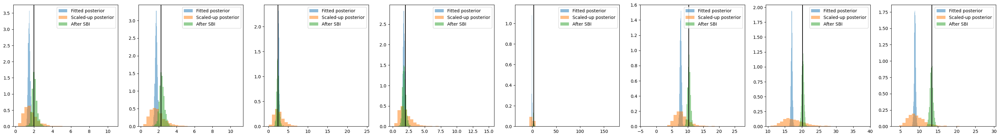

Drawing 100 posterior samples: 100%|██████████| 100/100 [00:00<00:00, 171.03it/s]


In [105]:
parameter_mask = get_parameter_mask(guide, ["Trange", "Tskew"])
sbi_posterior, samples_summary_stats, samples_obs = run_sbi(wgen, svi_result, observable_fct = case_study_3d, obs_target = obs_stats_target, scale_factor = 2.5, parameter_mask = parameter_mask, num_samples = 2000, num_rounds = num_rounds)
save_sbi_case_study("3d", sbi_posterior, samples_summary_stats, samples_obs, analysis = "analysis_v8")

## Addition: Case study 3e (seasonal target + 95th percentile)

In [87]:
num_rounds = 10

In [101]:
def case_study_3e(ts, precip, Tmin, Tavg, Tmax):
    """
    ts: [1, timesteps, 4], 4: index, year, month, doy
    precip, Tmin, Tavg, Tmax: [timesteps, realizations]
    Returns: [summary_stats, realizations]
    """
    winter = jnp.isin(ts[:, :, 2], jnp.array([12, 1, 2])).T
    spring = jnp.isin(ts[:, :, 2], jnp.array([3, 4, 5])).T
    summer = jnp.isin(ts[:, :, 2], jnp.array([6, 7, 8])).T
    autumn = jnp.isin(ts[:, :, 2], jnp.array([9, 10, 11])).T

    pmean_winter = jnp.nanmean(jnp.where(winter, precip, jnp.nan), axis = 0)
    pmean_spring = jnp.nanmean(jnp.where(spring, precip, jnp.nan), axis = 0)
    pmean_summer = jnp.nanmean(jnp.where(summer, precip, jnp.nan), axis = 0)
    pmean_autumn = jnp.nanmean(jnp.where(autumn, precip, jnp.nan), axis = 0)

    wet = (precip > 0)
    pavgwet_winter = jnp.nanmean(jnp.where(winter, wet, jnp.nan), axis = 0)
    pavgwet_spring = jnp.nanmean(jnp.where(spring, wet, jnp.nan), axis = 0)
    pavgwet_summer = jnp.nanmean(jnp.where(summer, wet, jnp.nan), axis = 0)
    pavgwet_autumn = jnp.nanmean(jnp.where(autumn, wet, jnp.nan), axis = 0)
    
    Tavg_winter = jnp.nanmean(jnp.where(winter, Tavg, jnp.nan), axis = 0)
    Tavg_spring = jnp.nanmean(jnp.where(spring, Tavg, jnp.nan), axis = 0)
    Tavg_summer = jnp.nanmean(jnp.where(summer, Tavg, jnp.nan), axis = 0)
    Tavg_autumn = jnp.nanmean(jnp.where(autumn, Tavg, jnp.nan), axis = 0)

    p95 = jnp.nanquantile(jnp.where(precip > 0, precip, jnp.nan), 0.95, axis = 0)

    #icy_days = jnp.mean(Tmax < 0, axis = 0)
    #heavy_rain = jnp.mean(precip > 20, axis = 0)

    return jnp.stack([pmean_winter, pmean_spring, pmean_summer, pmean_autumn, pavgwet_winter, pavgwet_spring, pavgwet_summer, pavgwet_autumn, Tavg_winter, Tavg_spring, Tavg_summer, Tavg_autumn, p95])#, icy_days])

obs['Tmin'] = obs['Tavg'] - obs['Tskew']*obs['Trange']
obs['Tmax'] = obs['Tmin'] + obs['Trange']
obs_stats = case_study_3e(jnp.expand_dims(wgen.timestamps[0,:,:], 0), obs['prec'].T, obs['Tmin'].T, obs['Tavg'].T, obs['Tmax'].T)
obs_stats

Array([[ 1.5461818 ],
       [ 1.7449532 ],
       [ 2.4704154 ],
       [ 1.6852754 ],
       [ 0.48320228],
       [ 0.45652175],
       [ 0.48527348],
       [ 0.43672457],
       [-0.46448863],
       [ 7.7378182 ],
       [17.098232  ],
       [ 8.8563385 ],
       [12.940038  ]], dtype=float32)

In [103]:
obs_stats_target = obs_stats
obs_stats_target = obs_stats_target.at[0].mul(1.3) # pmean winter
obs_stats_target = obs_stats_target.at[1].mul(1.3) # pmean spring
obs_stats_target = obs_stats_target.at[2].mul(1.) # pmean summer
obs_stats_target = obs_stats_target.at[3].mul(1.15) # pmean autumn

obs_stats_target = obs_stats_target.at[8].add(3.4) # Tavg winter
obs_stats_target = obs_stats_target.at[9].add(2.6) # Tavg spring
obs_stats_target = obs_stats_target.at[10].add(3.1) # Tavg summer
obs_stats_target = obs_stats_target.at[11].add(4.5) # Tavg autumn

obs_stats_target = obs_stats_target.at[-1].mul(1.4) # Tavg autumn

#obs_stats_target = obs_stats_target.at[12].add(-0.06) # icy days

obs_stats_target

Array([[ 2.0100362 ],
       [ 2.268439  ],
       [ 2.4704154 ],
       [ 1.9380667 ],
       [ 0.48320228],
       [ 0.45652175],
       [ 0.48527348],
       [ 0.43672457],
       [ 2.9355116 ],
       [10.337818  ],
       [20.198233  ],
       [13.3563385 ],
       [18.116053  ]], dtype=float32)

Run SBI:

Sampling...


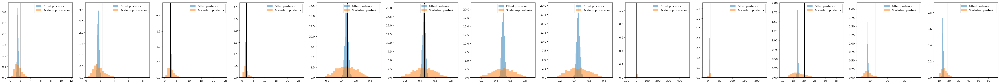

Running SBI...


Running 1000 simulations.: 100%|██████████| 1000/1000 [01:40<00:00, 10.00it/s]


 Neural network successfully converged after 81 epochs.

Running 1000 simulations.: 100%|██████████| 1000/1000 [01:33<00:00, 10.72it/s]


Using SNPE-C with atomic loss
 Neural network successfully converged after 30 epochs.

Running 1000 simulations.: 100%|██████████| 1000/1000 [01:39<00:00, 10.03it/s]


Using SNPE-C with atomic loss
 Neural network successfully converged after 42 epochs.

Running 1000 simulations.: 100%|██████████| 1000/1000 [01:38<00:00, 10.16it/s]


Using SNPE-C with atomic loss
 Neural network successfully converged after 51 epochs.

Running 1000 simulations.: 100%|██████████| 1000/1000 [01:39<00:00, 10.04it/s]


Using SNPE-C with atomic loss
 Neural network successfully converged after 34 epochs.

Running 1000 simulations.: 100%|██████████| 1000/1000 [01:37<00:00, 10.29it/s]


Using SNPE-C with atomic loss
 Neural network successfully converged after 28 epochs.

Running 1000 simulations.: 100%|██████████| 1000/1000 [01:47<00:00,  9.27it/s]


Using SNPE-C with atomic loss
 Neural network successfully converged after 37 epochs.

Running 1000 simulations.: 100%|██████████| 1000/1000 [01:46<00:00,  9.40it/s]


Using SNPE-C with atomic loss
 Neural network successfully converged after 42 epochs.

Running 1000 simulations.: 100%|██████████| 1000/1000 [01:35<00:00, 10.46it/s]


Using SNPE-C with atomic loss
 Neural network successfully converged after 57 epochs.

Running 1000 simulations.: 100%|██████████| 1000/1000 [01:35<00:00, 10.46it/s]


Using SNPE-C with atomic loss
 Neural network successfully converged after 33 epochs.Sampling SBI posterior and point estimate...


Drawing 2000 posterior samples: 100%|██████████| 2000/2000 [00:03<00:00, 566.98it/s]


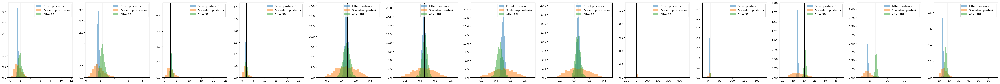

Drawing 100 posterior samples: 100%|██████████| 100/100 [00:00<00:00, 135.82it/s]


In [91]:
parameter_mask = get_parameter_mask(guide, ["Trange", "Tskew"])
sbi_posterior, samples_summary_stats, samples_obs = run_sbi(wgen, svi_result, observable_fct = case_study_3e, obs_target = obs_stats_target, scale_factor = 2.5, parameter_mask = parameter_mask, num_samples = 2000, num_rounds = num_rounds)
save_sbi_case_study("3e_seasonal_target", sbi_posterior, samples_summary_stats, samples_obs, analysis = "analysis_v8")

# Analysis

In [54]:
def make_line_plots(fut, hist, obs, time, target = None, ax = None, color_fut = "lightblue"):
    if ax is None:
        fig, ax = plt.subplots(figsize = (6,4))
        
    df_preds = pd.DataFrame(fut.squeeze().T)
    df_preds["time"] = time
    df_preds = df_preds.melt(id_vars="time", value_name="pred")
    df_preds = df_preds.groupby([df_preds.time.dt.month, df_preds.variable]).mean().drop(columns="time").reset_index()
    sns.lineplot(df_preds, x = "time", y = "pred", units = "variable", estimator = None, color = color_fut, alpha = 0.2, ax = ax)
    
    df_preds = pd.DataFrame(hist.squeeze().T)
    df_preds["time"] = time
    df_preds = df_preds.melt(id_vars="time", value_name="pred")
    df_preds = df_preds.groupby([df_preds.time.dt.month, df_preds.variable]).mean().drop(columns="time").reset_index()
    sns.lineplot(df_preds, x = "time", y = "pred", units = "variable", estimator = None, color = "grey", alpha = 0.2, ax = ax)
    
    df_obs = pd.DataFrame({"obs": obs.squeeze(), "time": basin_data_train.index})
    df_obs = df_obs.groupby(df_obs.time.dt.month)["obs"].mean().reset_index()
    sns.lineplot(df_obs, x="time", y="obs", color = "black", ax = ax)

    if target is not None:
        ax.axhline(target, color = "darkblue", linestyle = "dashed")

def add_seasonal_targets(targets, ax):
    ax.hlines(y = targets[0], xmin = 1, xmax = 2.5, color = "darkblue", linestyle = "dashed")
    ax.hlines(y = targets[1], xmin = 2.5, xmax = 5.5, color = "darkblue", linestyle = "dashed")
    ax.hlines(y = targets[2], xmin = 5.5, xmax = 8.5, color = "darkblue", linestyle = "dashed")
    ax.hlines(y = targets[3], xmin = 8.5, xmax = 11.5, color = "darkblue", linestyle = "dashed")
    ax.hlines(y = targets[0], xmin = 11.5, xmax = 12, color = "darkblue", linestyle = "dashed")

def add_monthly_targets(targets, ax):
    for i in range(2, 12):
        ax.hlines(y = targets[i-1], xmin = i-0.5, xmax = i+0.5, color = "darkblue", linestyle = "dashed")
    ax.hlines(y = targets[0], xmin = 1, xmax = 1.5, color = "darkblue", linestyle = "dashed")
    ax.hlines(y = targets[11], xmin = 11.5, xmax = 12, color = "darkblue", linestyle = "dashed")


In [56]:
def load_sbi_case_study(case_study, analysis = "analysis_v8"):
    with open(os.path.join("sbi_results", analysis, f"case_study_{case_study}_sbi_posterior.pkl"), "rb") as handle:
        sbi_posterior = pickle.load(handle)
    samples_summary_stats= torch.load(os.path.join("sbi_results", analysis, f"case_study_{case_study}_samples_summary_stats.pt"))
    samples_obs = torch.load(os.path.join("sbi_results", analysis, f"case_study_{case_study}_samples_summary_obs.pt"))
    return sbi_posterior, samples_summary_stats, samples_obs

## Case study 1

In [266]:
sbi_posterior, samples_summary_stats, samples_obs = load_sbi_case_study("1a")

In [267]:
obs_stats_target = case_study_1a(wgen.timestamps[0,:,:], obs['prec'].T, obs['Tmin'].T, obs['Tavg'].T, obs['Tmax'].T)
obs_stats_target = obs_stats_target.at[0].mul(1.2)
obs_stats_target = obs_stats_target.at[2].add(3.5)


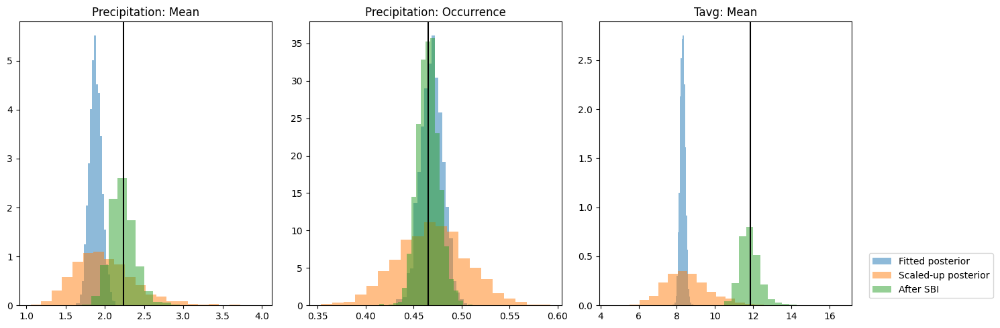

In [147]:
# Plot
titles = ["Precipitation: Mean", "Precipitation: Occurrence", "Tavg: Mean"]
fig, axs = plt.subplots(1, obs_stats_target.shape[0], figsize = (obs_stats_target.shape[0]*5, 5), layout="tight")
for i in range(obs_stats_target.shape[0]):
    axs[i].hist(samples_summary_stats["fitted_posterior"][:, i].numpy(), bins = 20, density = True, alpha = 0.5, label = "Fitted posterior")
    axs[i].hist(samples_summary_stats["sbi_proposal"][:, i].numpy(), bins = 20, density = True, alpha = 0.5, label = "Scaled-up posterior")
    axs[i].hist(samples_summary_stats["sbi_posterior"][:, i].numpy(), bins = 20, density = True, alpha = 0.5, label = "After SBI")
    axs[i].set_title(titles[i])
    axs[i].axvline(obs_stats_target[i,:].flatten(), c= "black")
axs[-1].legend(bbox_to_anchor = (1.05, 0.2))
plt.savefig("plots/analysis_v8/case_study_1.png", dpi = 300)


In [149]:
obs_hist = samples_obs["mean_fitted_posterior"]
obs_fut = samples_obs["sbi_posterior_point_estimate"]

pr_hist, tmin_hist, tavg_hist, tmax_hist = obs_hist[:, :, 0], obs_hist[:, :, 1], obs_hist[:, :, 2], obs_hist[:, :, 3]
pr_fut, tmin_fut, tavg_fut, tmax_fut = obs_fut[:, :, 0], obs_fut[:, :, 1], obs_fut[:, :, 2], obs_fut[:, :, 3]

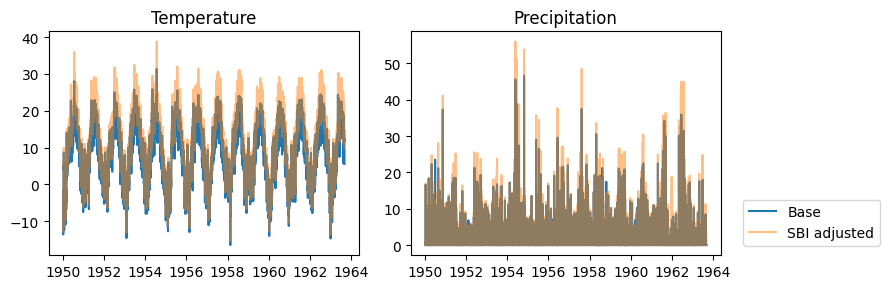

In [151]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (9, 3), layout = "tight")

ax1.plot(basin_data_train.index[:5000], tavg_hist[0, :5000], label = "Base")
ax1.plot(basin_data_train.index[:5000], tavg_fut[0, :5000], alpha = 0.5, label = "SBI adjusted")
ax1.set_title("Temperature")

ax2.plot(basin_data_train.index[:5000], pr_hist[0, :5000], label = "Base")
ax2.plot(basin_data_train.index[:5000], pr_fut[0, :5000], alpha = 0.5, label = "SBI adjusted")
ax2.legend(bbox_to_anchor = (1.05, 0.28))
ax2.set_title("Precipitation")

plt.savefig("plots/analysis_v8/case_study_1_temp_precip.png")

In [535]:
case_study_1a(jnp.expand_dims(wgen.timestamps[0,:,:], 0), *t2j(obs_fut.swapaxes(-1, 0))).std(axis = 1)


Array([0.05392236, 0.00684144, 0.11551996], dtype=float32)

In [539]:
case_study_1a(jnp.expand_dims(wgen.timestamps[0,:,:], 0), *t2j(obs_hist.swapaxes(-1, 0))).std(axis = 1)


Array([0.04911849, 0.00675225, 0.08744124], dtype=float32)

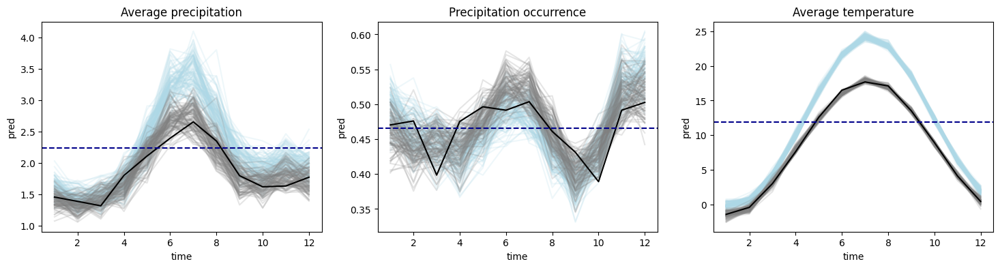

In [159]:
fig, axs = plt.subplots(1,3, figsize = (18,4))
make_line_plots(pr_fut, pr_hist, obs["prec"], basin_data_train.index, ax = axs[0], target = obs_stats_target[0])
#add_seasonal_targets(obs_stats_target[:4], axs[0])
axs[0].set_title("Average precipitation")

make_line_plots(pr_fut > 0, pr_hist > 0, obs["prec"] > 0, basin_data_train.index, ax = axs[1], target = obs_stats_target[1])
#add_seasonal_targets(obs_stats_target[4:9], axs[1])
axs[1].set_title("Precipitation occurrence")

make_line_plots(tavg_fut, tavg_hist, obs["Tavg"], basin_data_train.index, ax = axs[2], target = obs_stats_target[2])
#add_seasonal_targets(obs_stats_target[8:], axs[2])
axs[2].set_title("Average temperature")

plt.savefig("plots/analysis_v8/case_study_1_summary_plots.png")

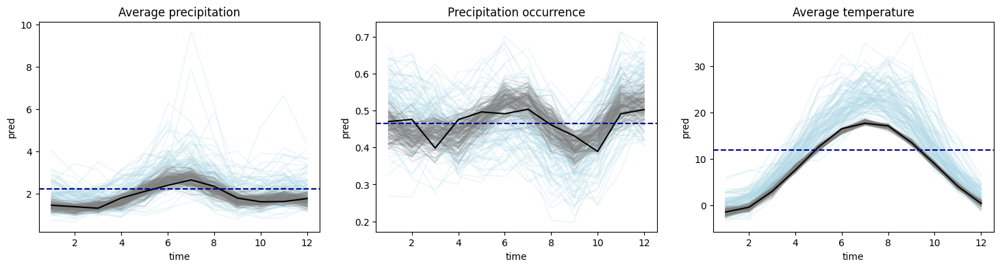

In [276]:
obs_hist = samples_obs["fitted_posterior"]
obs_fut = samples_obs["sbi_posterior"]

pr_hist, tmin_hist, tavg_hist, tmax_hist = obs_hist[:, :, 0], obs_hist[:, :, 1], obs_hist[:, :, 2], obs_hist[:, :, 3]
pr_fut, tmin_fut, tavg_fut, tmax_fut = obs_fut[:, :, 0], obs_fut[:, :, 1], obs_fut[:, :, 2], obs_fut[:, :, 3]

fig, axs = plt.subplots(1,3, figsize = (18,4))
make_line_plots(pr_fut, pr_hist, obs["prec"], basin_data_train.index, ax = axs[0], target = obs_stats_target[0])
#add_seasonal_targets(obs_stats_target[:4], axs[0])
axs[0].set_title("Average precipitation")

make_line_plots(pr_fut > 0, pr_hist > 0, obs["prec"] > 0, basin_data_train.index, ax = axs[1], target = obs_stats_target[1])
#add_seasonal_targets(obs_stats_target[4:9], axs[1])
axs[1].set_title("Precipitation occurrence")

make_line_plots(tavg_fut, tavg_hist, obs["Tavg"], basin_data_train.index, ax = axs[2], target = obs_stats_target[2])
#add_seasonal_targets(obs_stats_target[8:], axs[2])
axs[2].set_title("Average temperature")

plt.savefig("plots/analysis_v8/case_study_1_summary_plots_full_posterior.png")

In [272]:
samples_obs.keys()

dict_keys(['mean_fitted_posterior', 'fitted_posterior', 'sbi_posterior', 'sbi_posterior_point_estimate'])

In [551]:
np.mean(pr_fut.numpy() > 20)

0.01646206835644264

In [555]:
np.mean(pr_hist.numpy() > 20)*2

0.016832994789366777

## Case study 2

In [59]:
sbi_posterior, samples_summary_stats, samples_obs = load_sbi_case_study("2")

In [61]:
obs_stats_target = case_study_2(jnp.expand_dims(wgen.timestamps[0,:,:], 0), obs['prec'].T, obs['Tmin'].T, obs['Tavg'].T, obs['Tmax'].T)
obs_stats_target = obs_stats_target.at[0].add(3.1) # Tavg 
obs_stats_target = obs_stats_target.at[1].mul(1.3) # pmean 
obs_stats_target = obs_stats_target.at[2].mul(2.) # heavy_rain
obs_stats_target = obs_stats_target.at[3].set(0.01) # icy_days: 3 per year
obs_stats_target = obs_stats_target.at[4].set(0.08) # tropical_nights: 30 per year
obs_stats_target = obs_stats_target.at[5].mul(1.2) # Trangemean



Case study 2:

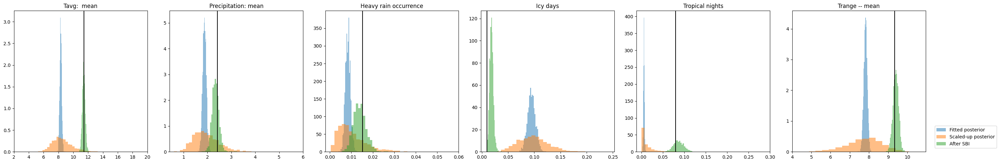

In [170]:
# Plot
titles = ["Tavg:  mean", "Precipitation: mean", "Heavy rain occurrence", "Icy days", "Tropical nights", "Trange -- mean"]
left_xlims = [2, None, None, None, None, 4]
right_xlims = [20, 6, 0.06, None, 0.30, None]

fig, axs = plt.subplots(1, obs_stats_target.shape[0], figsize = (obs_stats_target.shape[0]*5, 5), layout = "tight")
for i in range(obs_stats_target.shape[0]):
    axs[i].hist(samples_summary_stats["fitted_posterior"][:, i].numpy(), bins = 30, density = True, alpha = 0.5, label = "Fitted posterior")
    axs[i].hist(samples_summary_stats["sbi_proposal"][:, i].numpy(), bins = 30, density = True, alpha = 0.5, label = "Scaled-up posterior")
    axs[i].hist(samples_summary_stats["sbi_posterior"][:, i].numpy(), bins = 30, density = True, alpha = 0.5, label = "After SBI")
    #axs[i].legend(loc = "upper right")
    axs[i].set_title(titles[i])
    axs[i].axvline(obs_stats_target[i,:].flatten(), c= "black")
    axs[i].set_xlim(left = left_xlims[i], right = right_xlims[i])
axs[-1].legend(bbox_to_anchor = (1.05, 0.2))
plt.savefig("plots/analysis_v8/case_study_2_wide.png", dpi = 300)

In [103]:
obs_stats

Array([[8.3473034e+00],
       [1.8636943e+00],
       [7.5951605e-03],
       [8.3811715e-02],
       [5.2989495e-04],
       [7.7874007e+00]], dtype=float32)

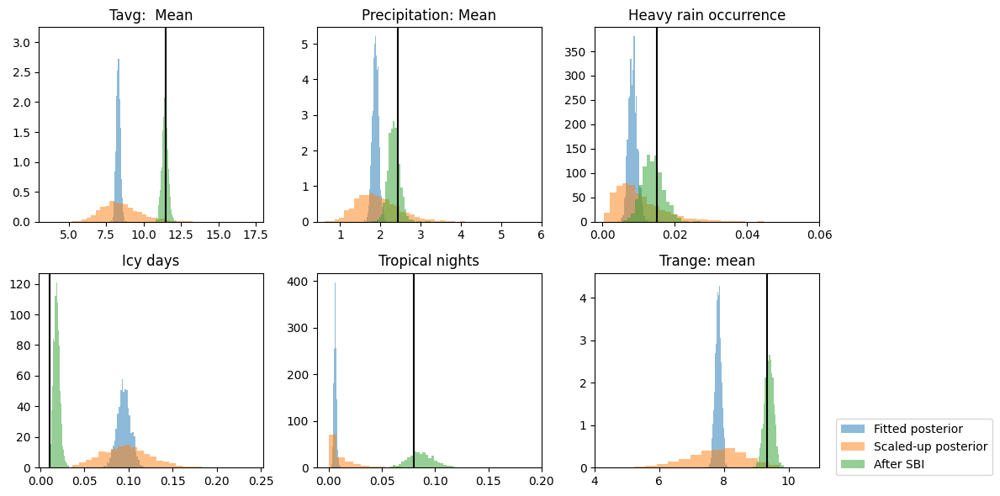

In [172]:
# Plot
titles = ["Tavg:  Mean", "Precipitation: Mean", "Heavy rain occurrence", "Icy days", "Tropical nights", "Trange: mean"]
left_xlims = [3, None, None, None, None, 4]
right_xlims = [18, 6, 0.06, None, 0.2, None]

fig, axs = plt.subplots(2, 3, figsize = (12, 6), layout = "tight")
axs = axs.ravel()
for i in range(obs_stats_target.shape[0]):
    axs[i].hist(samples_summary_stats["fitted_posterior"][:, i].numpy(), bins = 30, density = True, alpha = 0.5, label = "Fitted posterior")
    axs[i].hist(samples_summary_stats["sbi_proposal"][:, i].numpy(), bins = 30, density = True, alpha = 0.5, label = "Scaled-up posterior")
    axs[i].hist(samples_summary_stats["sbi_posterior"][:, i].numpy(), bins = 30, density = True, alpha = 0.5, label = "After SBI")
    #axs[i].legend(loc = "upper right")
    axs[i].set_title(titles[i])
    axs[i].axvline(obs_stats_target[i,:].flatten(), c= "black")
    axs[i].set_xlim(left = left_xlims[i], right = right_xlims[i])
axs[-1].legend(bbox_to_anchor = (1.05, 0.28))
plt.savefig("plots/analysis_v8/case_study_2.png", dpi = 300)

In [63]:
obs_hist = t2j(samples_obs["mean_fitted_posterior"])
obs_fut = t2j(samples_obs["sbi_posterior_point_estimate"])

pr_hist, tmin_hist, tavg_hist, tmax_hist = obs_hist[:, :, 0], obs_hist[:, :, 1], obs_hist[:, :, 2], obs_hist[:, :, 3]
pr_fut, tmin_fut, tavg_fut, tmax_fut = obs_fut[:, :, 0], obs_fut[:, :, 1], obs_fut[:, :, 2], obs_fut[:, :, 3]

trange_fut = tmax_fut - tmin_fut
trange_hist = tmax_hist - tmin_hist
tskew_fut = (tavg_fut - tmin_fut)/trange_fut
tskew_hist = (tavg_hist - tmin_hist)/trange_hist

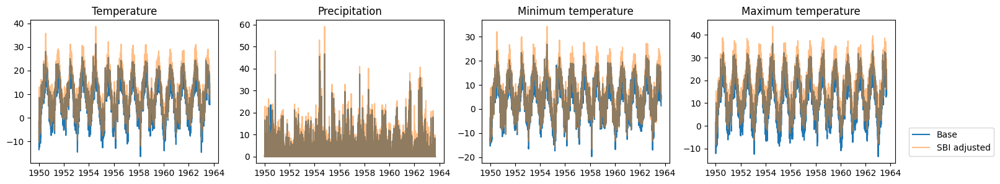

In [182]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize = (18, 3))

ax1.plot(basin_data_train.index[:5000], tavg_hist[0, :5000], label = "Base")
ax1.plot(basin_data_train.index[:5000], tavg_fut[0, :5000], alpha = 0.5, label = "SBI adjusted")
ax1.set_title("Temperature")

ax2.plot(basin_data_train.index[:5000], pr_hist[0, :5000], label = "Base")
ax2.plot(basin_data_train.index[:5000], pr_fut[0, :5000], alpha = 0.5, label = "SBI adjusted")
ax2.set_title("Precipitation")

ax3.plot(basin_data_train.index[:5000], tmin_hist[0, :5000], label = "Base")
ax3.plot(basin_data_train.index[:5000], tmin_fut[0, :5000], alpha = 0.5, label = "SBI adjusted")
ax3.set_title("Minimum temperature")

ax4.plot(basin_data_train.index[:5000], tmax_hist[0, :5000], label = "Base")
ax4.plot(basin_data_train.index[:5000], tmax_fut[0, :5000], alpha = 0.5, label = "SBI adjusted")
ax4.legend(bbox_to_anchor = (1.05, 0.28))
ax4.set_title("Maximum temperature")

plt.savefig("plots/analysis_v8/case_study_2_timeseries.png", dpi = 300)

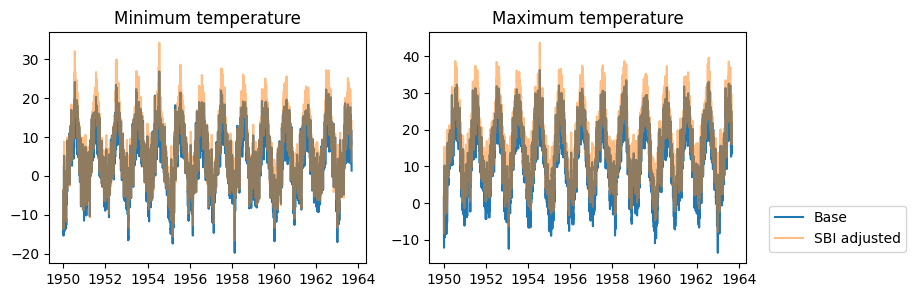

In [183]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (9, 3))

ax1.plot(basin_data_train.index[:5000], tmin_hist[0, :5000], label = "Base")
ax1.plot(basin_data_train.index[:5000], tmin_fut[0, :5000], alpha = 0.5, label = "Adjusted")
ax1.set_title("Minimum temperature")

ax2.plot(basin_data_train.index[:5000], tmax_hist[0, :5000], label = "Base")
ax2.plot(basin_data_train.index[:5000], tmax_fut[0, :5000], alpha = 0.5, label = "SBI adjusted")
ax2.legend(bbox_to_anchor = (1.05, 0.28))
ax2.set_title("Maximum temperature")

plt.savefig("plots/analysis_v8/case_study_2_timeseries.png", dpi = 300)

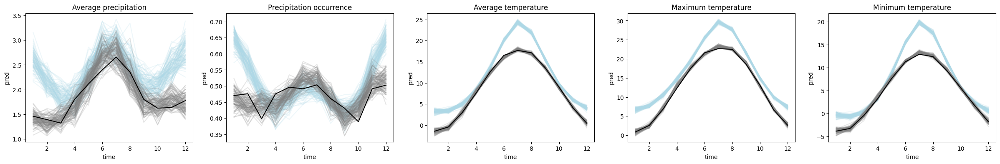

In [178]:
fig, axs = plt.subplots(1,5, figsize = (30,4))
make_line_plots(pr_fut, pr_hist, obs["prec"], basin_data_train.index, ax = axs[0])
#add_seasonal_targets(obs_stats_target[:4], axs[0])
axs[0].set_title("Average precipitation")

make_line_plots(pr_fut > 0, pr_hist > 0, obs["prec"] > 0, basin_data_train.index, ax = axs[1])
#add_seasonal_targets(obs_stats_target[4:9], axs[1])
axs[1].set_title("Precipitation occurrence")

make_line_plots(tavg_fut, tavg_hist, obs["Tavg"], basin_data_train.index, ax = axs[2])
#add_seasonal_targets(obs_stats_target[8:], axs[2])
axs[2].set_title("Average temperature")


make_line_plots(tmax_fut, tmax_hist, obs["Tmax"], basin_data_train.index, ax = axs[3])
#add_seasonal_targets(obs_stats_target[8:], axs[2])
axs[3].set_title("Maximum temperature")

make_line_plots(tmin_fut, tmin_hist, obs["Tmin"], basin_data_train.index, ax = axs[4])
#add_seasonal_targets(obs_stats_target[8:], axs[2])
axs[4].set_title("Minimum temperature")

plt.savefig("plots/analysis_v8/case_study_2_summary_plots.png")

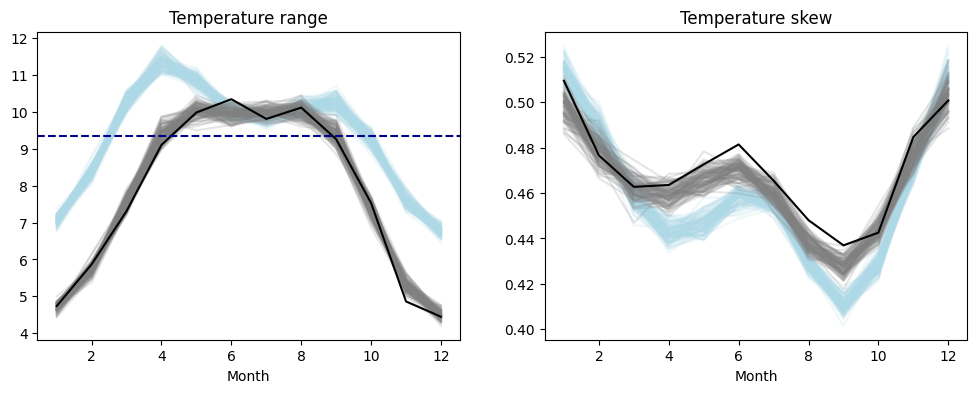

In [67]:
fig, axs = plt.subplots(1,2, figsize = (12,4))
make_line_plots(trange_fut, trange_hist, obs["Trange"], basin_data_train.index, target=obs_stats_target[-1], ax = axs[0])
axs[0].set_title("Temperature range")
make_line_plots(tskew_fut, tskew_hist, obs["Tskew"], basin_data_train.index, ax = axs[1])
axs[1].set_title("Temperature skew")
axs[0].set_xlabel("Month")
axs[1].set_xlabel("Month")
axs[0].set_ylabel("")
axs[1].set_ylabel("")


plt.savefig("plots/analysis_v8/case_study_2_summary_plots_range_skew.png")

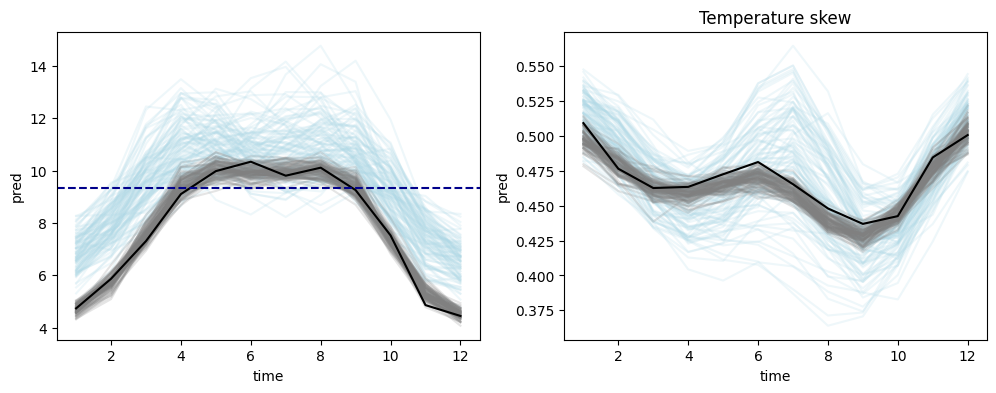

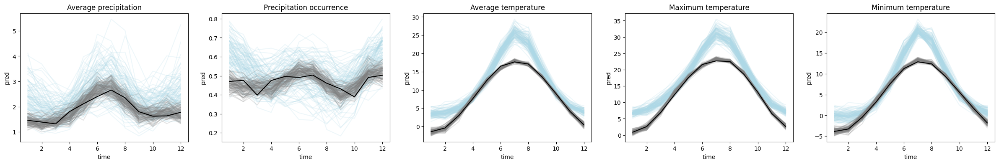

In [324]:
obs_hist = samples_obs["fitted_posterior"]
obs_fut = samples_obs["sbi_posterior"]

pr_hist, tmin_hist, tavg_hist, tmax_hist = obs_hist[:, :, 0], obs_hist[:, :, 1], obs_hist[:, :, 2], obs_hist[:, :, 3]
pr_fut, tmin_fut, tavg_fut, tmax_fut = obs_fut[:, :, 0], obs_fut[:, :, 1], obs_fut[:, :, 2], obs_fut[:, :, 3]

trange_fut = tmax_fut - tmin_fut
trange_hist = tmax_hist - tmin_hist
tskew_fut = (tavg_fut - tmin_fut)/trange_fut
tskew_hist = (tavg_hist - tmin_hist)/trange_hist



fig, axs = plt.subplots(1,2, figsize = (12,4))
make_line_plots(trange_fut, trange_hist, obs["Trange"], basin_data_train.index, target=obs_stats_target[-1], ax = axs[0])
axs[1].set_title("Temperature range")
make_line_plots(tskew_fut, tskew_hist, obs["Tskew"], basin_data_train.index, ax = axs[1])
axs[1].set_title("Temperature skew")

plt.savefig("plots/analysis_v8/case_study_2_summary_plots_range_skew_full_posterior.png")


fig, axs = plt.subplots(1,5, figsize = (30,4))
make_line_plots(pr_fut, pr_hist, obs["prec"], basin_data_train.index, ax = axs[0])
#add_seasonal_targets(obs_stats_target[:4], axs[0])
axs[0].set_title("Average precipitation")

make_line_plots(pr_fut > 0, pr_hist > 0, obs["prec"] > 0, basin_data_train.index, ax = axs[1])
#add_seasonal_targets(obs_stats_target[4:9], axs[1])
axs[1].set_title("Precipitation occurrence")

make_line_plots(tavg_fut, tavg_hist, obs["Tavg"], basin_data_train.index, ax = axs[2])
#add_seasonal_targets(obs_stats_target[8:], axs[2])
axs[2].set_title("Average temperature")


make_line_plots(tmax_fut, tmax_hist, obs["Tmax"], basin_data_train.index, ax = axs[3])
#add_seasonal_targets(obs_stats_target[8:], axs[2])
axs[3].set_title("Maximum temperature")

make_line_plots(tmin_fut, tmin_hist, obs["Tmin"], basin_data_train.index, ax = axs[4])
#add_seasonal_targets(obs_stats_target[8:], axs[2])
axs[4].set_title("Minimum temperature")

plt.savefig("plots/analysis_v8/case_study_2_summary_plots_full_posterior.png")

## Case study 3

### Overview part a)

In [455]:
sbi_posterior, samples_summary_stats, samples_obs = load_sbi_case_study("3a")

In [456]:
obs_stats_target = case_study_3a(jnp.expand_dims(wgen.timestamps[0,:,:], 0), obs['prec'].T, obs['Tmin'].T, obs['Tavg'].T, obs['Tmax'].T)
obs_stats_target = obs_stats_target.at[0].mul(1.3) # pmean winter
obs_stats_target = obs_stats_target.at[1].mul(1.3) # pmean spring
obs_stats_target = obs_stats_target.at[2].mul(1.) # pmean summer
obs_stats_target = obs_stats_target.at[3].mul(1.15) # pmean autumn

obs_stats_target = obs_stats_target.at[4].add(3.4) # Tavg winter
obs_stats_target = obs_stats_target.at[5].add(2.6) # Tavg spring
obs_stats_target = obs_stats_target.at[6].add(3.1) # Tavg summer
obs_stats_target = obs_stats_target.at[7].add(4.5) # Tavg autumn


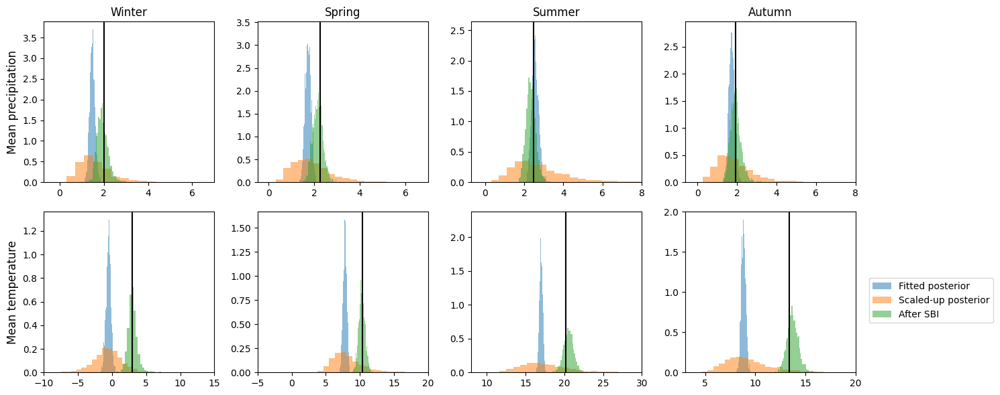

In [457]:
# Plot
idxs = [0, 1, 2, 3, 4, 5, 6, 7]

left_xlims = [None, None, None, None, -10, -5, 8, 3]
right_xlims = [7, 7, 8, 8, 15, 20, 30, 20]

samples_summary_stats_reduced_plot = dict()
samples_summary_stats_reduced_plot["fitted_posterior"] = samples_summary_stats["fitted_posterior"][:, idxs]
samples_summary_stats_reduced_plot["sbi_proposal"] = samples_summary_stats["sbi_proposal"][:, idxs]
samples_summary_stats_reduced_plot["sbi_posterior"] = samples_summary_stats["sbi_posterior"][:, idxs]
obs_stats_target_reduced_plot = obs_stats_target[idxs, :]

fig, axs = plt.subplots(2, 4, figsize = (15, 6), layout = "tight")
axs[0, 0].set_ylabel("Mean precipitation", size = "large")
axs[1, 0].set_ylabel("Mean temperature", size = "large")

axs = axs.ravel()
axs[0].set_title("Winter")
axs[1].set_title("Spring")
axs[2].set_title("Summer")
axs[3].set_title("Autumn")

for i in range(obs_stats_target_reduced_plot.shape[0]):
    axs[i].hist(samples_summary_stats_reduced_plot["fitted_posterior"][:, i].numpy(), bins = 50, density = True, alpha = 0.5, label = "Fitted posterior")
    axs[i].hist(samples_summary_stats_reduced_plot["sbi_proposal"][:, i].numpy(), bins = 50, density = True, alpha = 0.5, label = "Scaled-up posterior")
    axs[i].hist(samples_summary_stats_reduced_plot["sbi_posterior"][:, i].numpy(), bins = 50, density = True, alpha = 0.5, label = "After SBI")
    #axs[i].legend(loc = "upper right")
    #axs[i].set_title(titles[i])
    axs[i].axvline(obs_stats_target_reduced_plot[i,:].flatten(), c= "black")
    axs[i].set_xlim(left = left_xlims[i], right = right_xlims[i])
axs[-1].legend(bbox_to_anchor = (1.05, 0.28))
plt.savefig("plots/analysis_v8/case_study_3a.png", dpi = 300)

In [458]:
obs_hist = t2j(samples_obs["mean_fitted_posterior"])
obs_fut = t2j(samples_obs["sbi_posterior_point_estimate"])

pr_hist, tmin_hist, tavg_hist, tmax_hist = obs_hist[:, :, 0], obs_hist[:, :, 1], obs_hist[:, :, 2], obs_hist[:, :, 3]
pr_fut, tmin_fut, tavg_fut, tmax_fut = obs_fut[:, :, 0], obs_fut[:, :, 1], obs_fut[:, :, 2], obs_fut[:, :, 3]

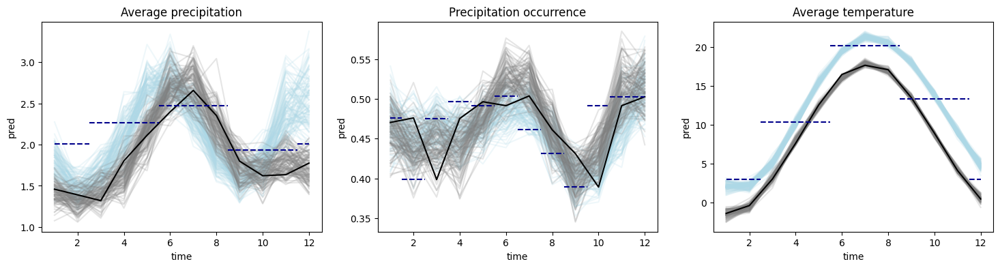

In [459]:
fig, axs = plt.subplots(1,3, figsize = (18,4))
make_line_plots(pr_fut, pr_hist, obs["prec"], basin_data_train.index, ax = axs[0])
add_seasonal_targets(obs_stats_target[:4], axs[0])
axs[0].set_title("Average precipitation")

make_line_plots(pr_fut > 0, pr_hist > 0, obs["prec"] > 0, basin_data_train.index, ax = axs[1])
add_monthly_targets(obs_stats_target[9:], axs[1])
axs[1].set_title("Precipitation occurrence")

make_line_plots(tavg_fut, tavg_hist, obs["Tavg"], basin_data_train.index, ax = axs[2])
add_seasonal_targets(obs_stats_target[4:9], axs[2])
axs[2].set_title("Average temperature")

plt.savefig("plots/analysis_v8/case_study_3a_ensemble.png", dpi = 300)

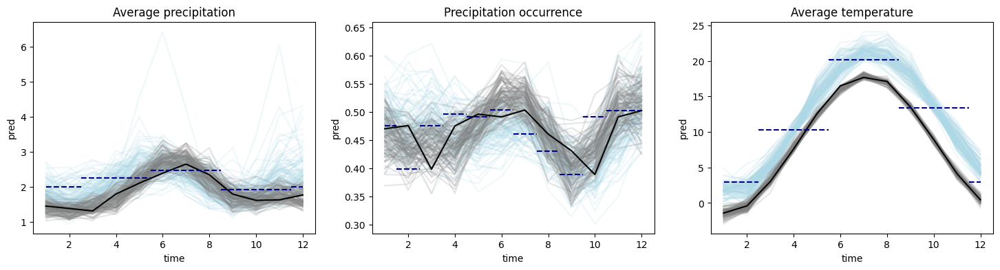

In [460]:
obs_hist = samples_obs["fitted_posterior"]
obs_fut = samples_obs["sbi_posterior"]

pr_hist, tmin_hist, tavg_hist, tmax_hist = obs_hist[:, :, 0], obs_hist[:, :, 1], obs_hist[:, :, 2], obs_hist[:, :, 3]
pr_fut, tmin_fut, tavg_fut, tmax_fut = obs_fut[:, :, 0], obs_fut[:, :, 1], obs_fut[:, :, 2], obs_fut[:, :, 3]

fig, axs = plt.subplots(1,3, figsize = (18,4))
make_line_plots(pr_fut, pr_hist, obs["prec"], basin_data_train.index, ax = axs[0])
add_seasonal_targets(obs_stats_target[:4], axs[0])
axs[0].set_title("Average precipitation")

make_line_plots(pr_fut > 0, pr_hist > 0, obs["prec"] > 0, basin_data_train.index, ax = axs[1])
add_monthly_targets(obs_stats_target[9:], axs[1])
axs[1].set_title("Precipitation occurrence")

make_line_plots(tavg_fut, tavg_hist, obs["Tavg"], basin_data_train.index, ax = axs[2])
add_seasonal_targets(obs_stats_target[4:9], axs[2])
axs[2].set_title("Average temperature")

plt.savefig("plots/analysis_v8/case_study_3a_ensemble_full_posterior.png", dpi = 300)

### Overview part b)

In [127]:
sbi_posterior, samples_summary_stats, samples_obs = load_sbi_case_study("3b")

In [129]:
obs_stats_target = case_study_3b(jnp.expand_dims(wgen.timestamps[0,:,:], 0), obs['prec'].T, obs['Tmin'].T, obs['Tavg'].T, obs['Tmax'].T)
obs_stats_target = obs_stats_target.at[0].mul(1.3) # pmean winter
obs_stats_target = obs_stats_target.at[1].mul(1.3) # pmean spring
obs_stats_target = obs_stats_target.at[2].mul(1.) # pmean summer
obs_stats_target = obs_stats_target.at[3].mul(1.15) # pmean autumn

obs_stats_target = obs_stats_target.at[4].add(3.4) # Tavg winter
obs_stats_target = obs_stats_target.at[5].add(2.6) # Tavg spring
obs_stats_target = obs_stats_target.at[6].add(3.1) # Tavg summer
obs_stats_target = obs_stats_target.at[7].add(4.5) # Tavg autumn

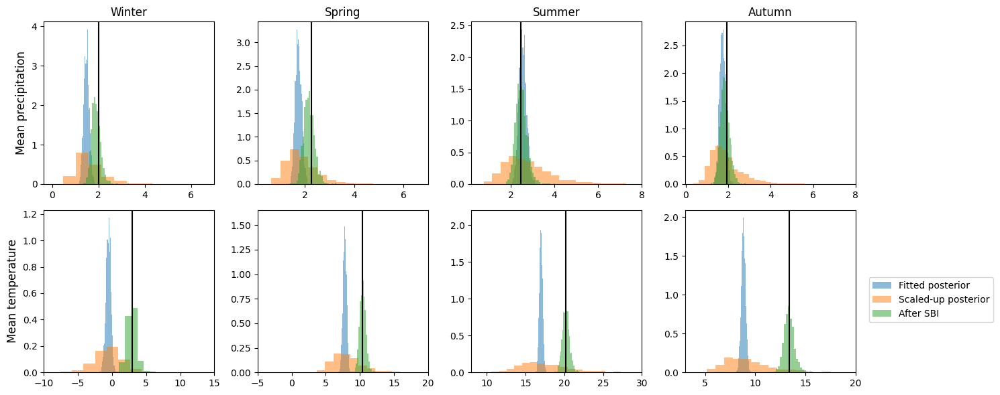

In [130]:
# Plot
idxs = [0, 1, 2, 3, 4, 5, 6, 7]

left_xlims = [None, None, None, None, -10, -5, 8, 3]
right_xlims = [7, 7, 8, 8, 15, 20, 30, 20]

samples_summary_stats_reduced_plot = dict()
samples_summary_stats_reduced_plot["fitted_posterior"] = samples_summary_stats["fitted_posterior"][:, idxs]
samples_summary_stats_reduced_plot["sbi_proposal"] = samples_summary_stats["sbi_proposal"][:, idxs]
samples_summary_stats_reduced_plot["sbi_posterior"] = samples_summary_stats["sbi_posterior"][:, idxs]
obs_stats_target_reduced_plot = obs_stats_target[idxs, :]

fig, axs = plt.subplots(2, 4, figsize = (15, 6), layout = "tight")
axs[0, 0].set_ylabel("Mean precipitation", size = "large")
axs[1, 0].set_ylabel("Mean temperature", size = "large")

axs = axs.ravel()
axs[0].set_title("Winter")
axs[1].set_title("Spring")
axs[2].set_title("Summer")
axs[3].set_title("Autumn")

for i in range(obs_stats_target_reduced_plot.shape[0]):
    axs[i].hist(samples_summary_stats_reduced_plot["fitted_posterior"][:, i].numpy(), bins = 30, density = True, alpha = 0.5, label = "Fitted posterior")
    axs[i].hist(samples_summary_stats_reduced_plot["sbi_proposal"][:, i].numpy(), bins = 30, density = True, alpha = 0.5, label = "Scaled-up posterior")
    axs[i].hist(samples_summary_stats_reduced_plot["sbi_posterior"][:, i].numpy(), bins = 30, density = True, alpha = 0.5, label = "After SBI")
    #axs[i].legend(loc = "upper right")
    #axs[i].set_title(titles[i])
    axs[i].axvline(obs_stats_target_reduced_plot[i,:].flatten(), c= "black")
    axs[i].set_xlim(left = left_xlims[i], right = right_xlims[i])
axs[-1].legend(bbox_to_anchor = (1.05, 0.28))
plt.savefig("plots/analysis_v8/case_study_3b.png", dpi = 300)

In [132]:
obs_hist = t2j(samples_obs["mean_fitted_posterior"])
obs_fut = t2j(samples_obs["sbi_posterior_point_estimate"])

pr_hist, tmin_hist, tavg_hist, tmax_hist = obs_hist[:, :, 0], obs_hist[:, :, 1], obs_hist[:, :, 2], obs_hist[:, :, 3]
pr_fut, tmin_fut, tavg_fut, tmax_fut = obs_fut[:, :, 0], obs_fut[:, :, 1], obs_fut[:, :, 2], obs_fut[:, :, 3]

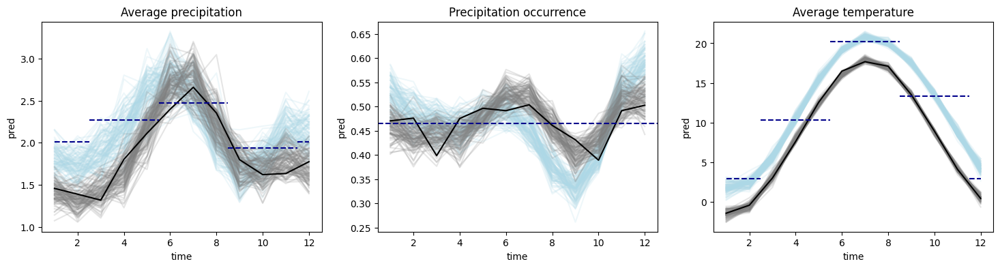

In [133]:
fig, axs = plt.subplots(1,3, figsize = (18,4))
make_line_plots(pr_fut, pr_hist, obs["prec"], basin_data_train.index, ax = axs[0])
add_seasonal_targets(obs_stats_target[:4], axs[0])
axs[0].set_title("Average precipitation")

make_line_plots(pr_fut > 0, pr_hist > 0, obs["prec"] > 0, basin_data_train.index, ax = axs[1], target = obs_stats_target[-1])
axs[1].set_title("Precipitation occurrence")

make_line_plots(tavg_fut, tavg_hist, obs["Tavg"], basin_data_train.index, ax = axs[2])
add_seasonal_targets(obs_stats_target[4:], axs[2])
axs[2].set_title("Average temperature")
plt.savefig("plots/analysis_v8/case_study_3b_ensemble.png")

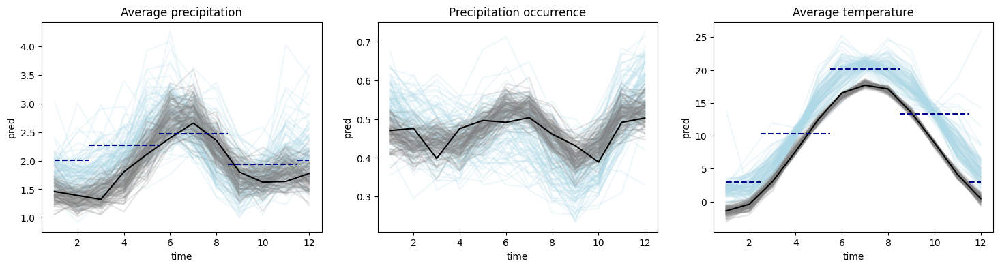

In [134]:
obs_hist = t2j(samples_obs["fitted_posterior"])
obs_fut = t2j(samples_obs["sbi_posterior"])

pr_hist, tmin_hist, tavg_hist, tmax_hist = obs_hist[:, :, 0], obs_hist[:, :, 1], obs_hist[:, :, 2], obs_hist[:, :, 3]
pr_fut, tmin_fut, tavg_fut, tmax_fut = obs_fut[:, :, 0], obs_fut[:, :, 1], obs_fut[:, :, 2], obs_fut[:, :, 3]

fig, axs = plt.subplots(1,3, figsize = (18,4))
make_line_plots(pr_fut, pr_hist, obs["prec"], basin_data_train.index, ax = axs[0])
add_seasonal_targets(obs_stats_target[:4], axs[0])
axs[0].set_title("Average precipitation")

make_line_plots(pr_fut > 0, pr_hist > 0, obs["prec"] > 0, basin_data_train.index, ax = axs[1])
axs[1].set_title("Precipitation occurrence")

make_line_plots(tavg_fut, tavg_hist, obs["Tavg"], basin_data_train.index, ax = axs[2])
add_seasonal_targets(obs_stats_target[4:], axs[2])
axs[2].set_title("Average temperature")
plt.savefig("plots/analysis_v8/case_study_3b_ensemble_full_posterior.png")

113

### Overview part c)

In [469]:
sbi_posterior, samples_summary_stats, samples_obs = load_sbi_case_study("3c")

In [470]:
obs_stats_target = case_study_3c(jnp.expand_dims(wgen.timestamps[0,:,:], 0), obs['prec'].T, obs['Tmin'].T, obs['Tavg'].T, obs['Tmax'].T)
obs_stats_target = obs_stats_target.at[0].mul(1.3) # pmean winter
obs_stats_target = obs_stats_target.at[1].mul(1.3) # pmean spring
obs_stats_target = obs_stats_target.at[2].mul(1.) # pmean summer
obs_stats_target = obs_stats_target.at[3].mul(1.15) # pmean autumn

obs_stats_target = obs_stats_target.at[4].add(3.4) # Tavg winter
obs_stats_target = obs_stats_target.at[5].add(2.6) # Tavg spring
obs_stats_target = obs_stats_target.at[6].add(3.1) # Tavg summer
obs_stats_target = obs_stats_target.at[7].add(4.5) # Tavg autumn



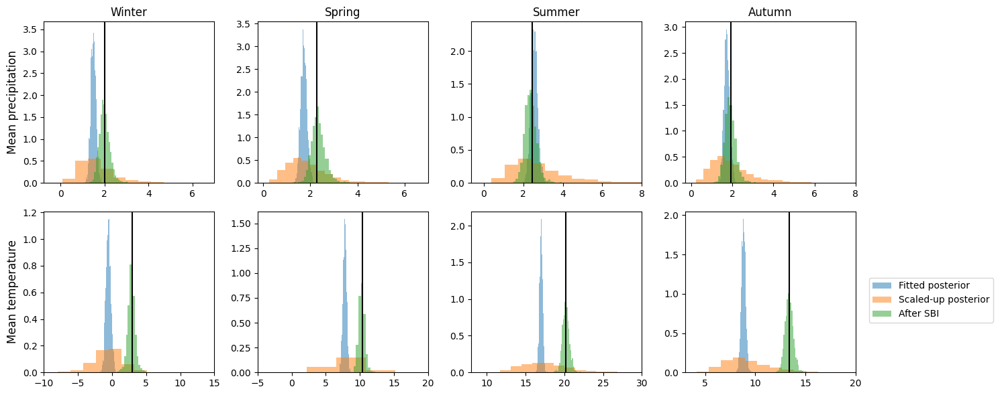

In [472]:
# Plot
idxs = [0, 1, 2, 3, 4, 5, 6, 7]

left_xlims = [None, None, None, None, -10, -5, 8, 3]
right_xlims = [7, 7, 8, 8, 15, 20, 30, 20]

samples_summary_stats_reduced_plot = dict()
samples_summary_stats_reduced_plot["fitted_posterior"] = samples_summary_stats["fitted_posterior"][:, idxs]
samples_summary_stats_reduced_plot["sbi_proposal"] = samples_summary_stats["sbi_proposal"][:, idxs]
samples_summary_stats_reduced_plot["sbi_posterior"] = samples_summary_stats["sbi_posterior"][:, idxs]
obs_stats_target_reduced_plot = obs_stats_target[idxs, :]

fig, axs = plt.subplots(2, 4, figsize = (15, 6), layout = "tight")
axs[0, 0].set_ylabel("Mean precipitation", size = "large")
axs[1, 0].set_ylabel("Mean temperature", size = "large")

axs = axs.ravel()
axs[0].set_title("Winter")
axs[1].set_title("Spring")
axs[2].set_title("Summer")
axs[3].set_title("Autumn")

for i in range(obs_stats_target_reduced_plot.shape[0]):
    axs[i].hist(samples_summary_stats_reduced_plot["fitted_posterior"][:, i].numpy(), bins = 30, density = True, alpha = 0.5, label = "Fitted posterior")
    axs[i].hist(samples_summary_stats_reduced_plot["sbi_proposal"][:, i].numpy(), bins = 30, density = True, alpha = 0.5, label = "Scaled-up posterior")
    axs[i].hist(samples_summary_stats_reduced_plot["sbi_posterior"][:, i].numpy(), bins = 30, density = True, alpha = 0.5, label = "After SBI")
    #axs[i].legend(loc = "upper right")
    #axs[i].set_title(titles[i])
    axs[i].axvline(obs_stats_target_reduced_plot[i,:].flatten(), c= "black")
    axs[i].set_xlim(left = left_xlims[i], right = right_xlims[i])
axs[-1].legend(bbox_to_anchor = (1.05, 0.28))
plt.savefig("plots/analysis_v8/case_study_3c.png", dpi = 300)

In [474]:
obs_hist = t2j(samples_obs["mean_fitted_posterior"])
obs_fut = t2j(samples_obs["sbi_posterior_point_estimate"])

pr_hist, tmin_hist, tavg_hist, tmax_hist = obs_hist[:, :, 0], obs_hist[:, :, 1], obs_hist[:, :, 2], obs_hist[:, :, 3]
pr_fut, tmin_fut, tavg_fut, tmax_fut = obs_fut[:, :, 0], obs_fut[:, :, 1], obs_fut[:, :, 2], obs_fut[:, :, 3]

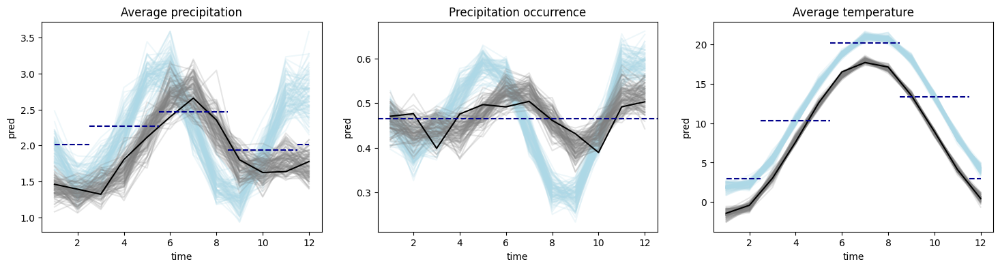

In [475]:
fig, axs = plt.subplots(1,3, figsize = (18,4))
make_line_plots(pr_fut, pr_hist, obs["prec"], basin_data_train.index, ax = axs[0])
add_seasonal_targets(obs_stats_target[:4], axs[0])
axs[0].set_title("Average precipitation")

make_line_plots(pr_fut > 0, pr_hist > 0, obs["prec"] > 0, basin_data_train.index, ax = axs[1], target = obs_stats_target[9])
axs[1].set_title("Precipitation occurrence")

make_line_plots(tavg_fut, tavg_hist, obs["Tavg"], basin_data_train.index, ax = axs[2])
add_seasonal_targets(obs_stats_target[4:], axs[2])
axs[2].set_title("Average temperature")
plt.savefig("plots/analysis_v8/case_study_3c_ensemble.png")

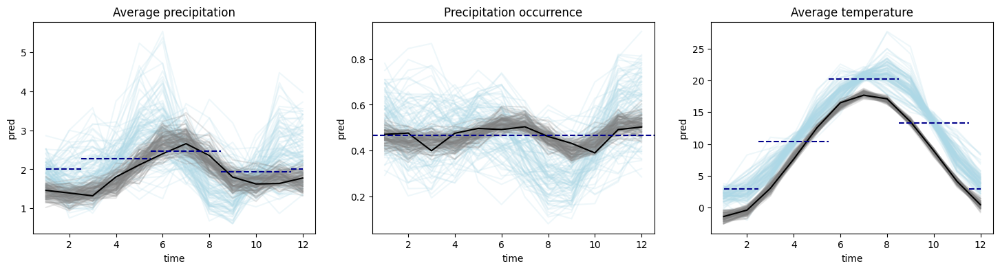

In [476]:
obs_hist = t2j(samples_obs["fitted_posterior"])
obs_fut = t2j(samples_obs["sbi_posterior"])

pr_hist, tmin_hist, tavg_hist, tmax_hist = obs_hist[:, :, 0], obs_hist[:, :, 1], obs_hist[:, :, 2], obs_hist[:, :, 3]
pr_fut, tmin_fut, tavg_fut, tmax_fut = obs_fut[:, :, 0], obs_fut[:, :, 1], obs_fut[:, :, 2], obs_fut[:, :, 3]

fig, axs = plt.subplots(1,3, figsize = (18,4))
make_line_plots(pr_fut, pr_hist, obs["prec"], basin_data_train.index, ax = axs[0])
add_seasonal_targets(obs_stats_target[:4], axs[0])
axs[0].set_title("Average precipitation")

make_line_plots(pr_fut > 0, pr_hist > 0, obs["prec"] > 0, basin_data_train.index, ax = axs[1], target = obs_stats_target[9])
axs[1].set_title("Precipitation occurrence")

make_line_plots(tavg_fut, tavg_hist, obs["Tavg"], basin_data_train.index, ax = axs[2])
add_seasonal_targets(obs_stats_target[4:], axs[2])
axs[2].set_title("Average temperature")
plt.savefig("plots/analysis_v8/case_study_3c_ensemble_full_posterior.png")

### Overview part d)

In [478]:
sbi_posterior, samples_summary_stats, samples_obs = load_sbi_case_study("3d")

In [479]:
obs_stats_target = case_study_3d(jnp.expand_dims(wgen.timestamps[0,:,:], 0), obs['prec'].T, obs['Tmin'].T, obs['Tavg'].T, obs['Tmax'].T)
obs_stats_target = obs_stats_target.at[0].mul(1.3) # pmean winter
obs_stats_target = obs_stats_target.at[1].mul(1.3) # pmean spring
obs_stats_target = obs_stats_target.at[2].mul(1.) # pmean summer
obs_stats_target = obs_stats_target.at[3].mul(1.15) # pmean autumn

obs_stats_target = obs_stats_target.at[4].add(3.4) # Tavg winter
obs_stats_target = obs_stats_target.at[5].add(2.6) # Tavg spring
obs_stats_target = obs_stats_target.at[6].add(3.1) # Tavg summer
obs_stats_target = obs_stats_target.at[7].add(4.5) # Tavg autumn


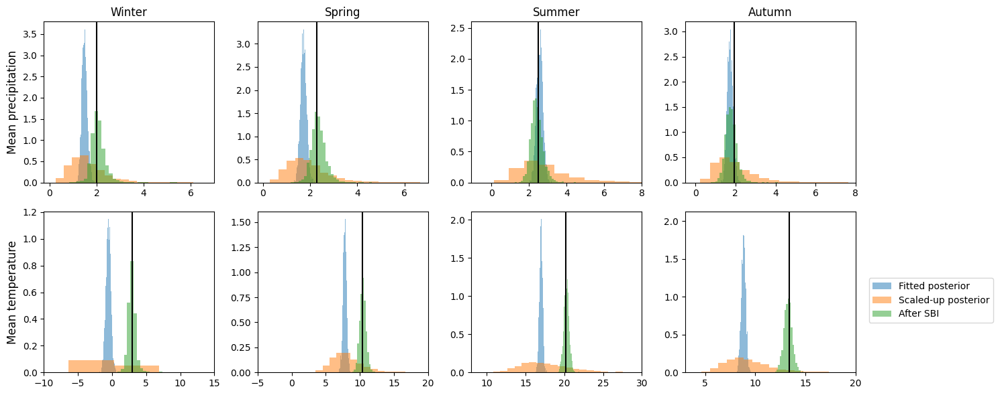

In [481]:
# Plot
idxs = [0, 1, 2, 3, 4, 5, 6, 7]

left_xlims = [None, None, None, None, -10, -5, 8, 3]
right_xlims = [7, 7, 8, 8, 15, 20, 30, 20]

samples_summary_stats_reduced_plot = dict()
samples_summary_stats_reduced_plot["fitted_posterior"] = samples_summary_stats["fitted_posterior"][:, idxs]
samples_summary_stats_reduced_plot["sbi_proposal"] = samples_summary_stats["sbi_proposal"][:, idxs]
samples_summary_stats_reduced_plot["sbi_posterior"] = samples_summary_stats["sbi_posterior"][:, idxs]
obs_stats_target_reduced_plot = obs_stats_target[idxs, :]

fig, axs = plt.subplots(2, 4, figsize = (15, 6), layout = "tight")
axs[0, 0].set_ylabel("Mean precipitation", size = "large")
axs[1, 0].set_ylabel("Mean temperature", size = "large")

axs = axs.ravel()
axs[0].set_title("Winter")
axs[1].set_title("Spring")
axs[2].set_title("Summer")
axs[3].set_title("Autumn")

for i in range(obs_stats_target_reduced_plot.shape[0]):
    axs[i].hist(samples_summary_stats_reduced_plot["fitted_posterior"][:, i].numpy(), bins = 30, density = True, alpha = 0.5, label = "Fitted posterior")
    axs[i].hist(samples_summary_stats_reduced_plot["sbi_proposal"][:, i].numpy(), bins = 30, density = True, alpha = 0.5, label = "Scaled-up posterior")
    axs[i].hist(samples_summary_stats_reduced_plot["sbi_posterior"][:, i].numpy(), bins = 30, density = True, alpha = 0.5, label = "After SBI")
    #axs[i].legend(loc = "upper right")
    #axs[i].set_title(titles[i])
    axs[i].axvline(obs_stats_target_reduced_plot[i,:].flatten(), c= "black")
    axs[i].set_xlim(left = left_xlims[i], right = right_xlims[i])
axs[-1].legend(bbox_to_anchor = (1.05, 0.28))
plt.savefig("plots/analysis_v8/case_study_3d.png", dpi = 300)

In [483]:
obs_hist = t2j(samples_obs["mean_fitted_posterior"])
obs_fut = t2j(samples_obs["sbi_posterior_point_estimate"])

pr_hist, tmin_hist, tavg_hist, tmax_hist = obs_hist[:, :, 0], obs_hist[:, :, 1], obs_hist[:, :, 2], obs_hist[:, :, 3]
pr_fut, tmin_fut, tavg_fut, tmax_fut = obs_fut[:, :, 0], obs_fut[:, :, 1], obs_fut[:, :, 2], obs_fut[:, :, 3]

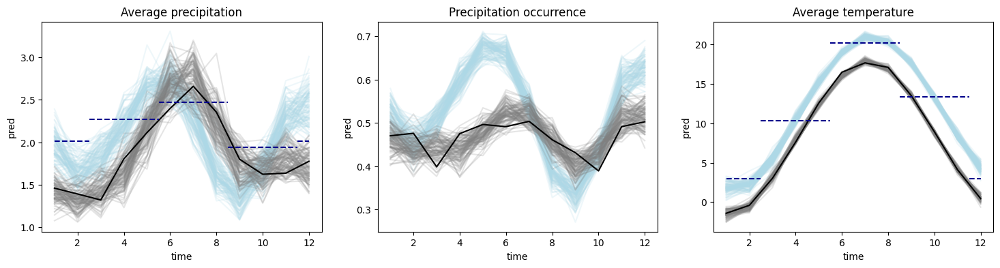

In [485]:
fig, axs = plt.subplots(1,3, figsize = (18,4))
make_line_plots(pr_fut, pr_hist, obs["prec"], basin_data_train.index, ax = axs[0])
add_seasonal_targets(obs_stats_target[:4], axs[0])
axs[0].set_title("Average precipitation")

make_line_plots(pr_fut > 0, pr_hist > 0, obs["prec"] > 0, basin_data_train.index, ax = axs[1])
axs[1].set_title("Precipitation occurrence")

make_line_plots(tavg_fut, tavg_hist, obs["Tavg"], basin_data_train.index, ax = axs[2])
add_seasonal_targets(obs_stats_target[4:], axs[2])
axs[2].set_title("Average temperature")
plt.savefig("plots/analysis_v8/case_study_3d_ensemble.png")

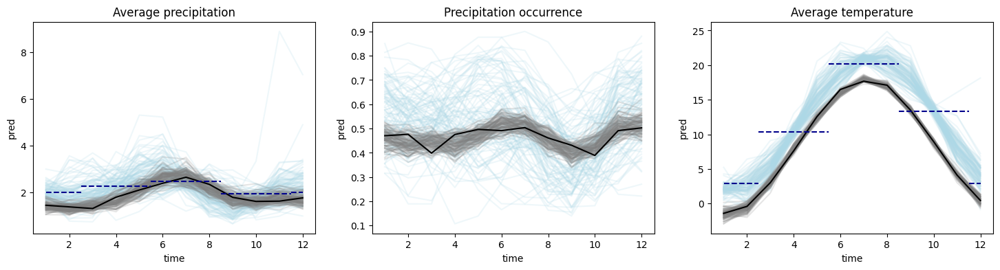

In [486]:
obs_hist = t2j(samples_obs["fitted_posterior"])
obs_fut = t2j(samples_obs["sbi_posterior"])

pr_hist, tmin_hist, tavg_hist, tmax_hist = obs_hist[:, :, 0], obs_hist[:, :, 1], obs_hist[:, :, 2], obs_hist[:, :, 3]
pr_fut, tmin_fut, tavg_fut, tmax_fut = obs_fut[:, :, 0], obs_fut[:, :, 1], obs_fut[:, :, 2], obs_fut[:, :, 3]

fig, axs = plt.subplots(1,3, figsize = (18,4))
make_line_plots(pr_fut, pr_hist, obs["prec"], basin_data_train.index, ax = axs[0])
add_seasonal_targets(obs_stats_target[:4], axs[0])
axs[0].set_title("Average precipitation")

make_line_plots(pr_fut > 0, pr_hist > 0, obs["prec"] > 0, basin_data_train.index, ax = axs[1])
axs[1].set_title("Precipitation occurrence")

make_line_plots(tavg_fut, tavg_hist, obs["Tavg"], basin_data_train.index, ax = axs[2])
add_seasonal_targets(obs_stats_target[4:], axs[2])
axs[2].set_title("Average temperature")
plt.savefig("plots/analysis_v8/case_study_3d_ensemble_full_posterior.png")

### Addition: Overview part e)

In [462]:
sbi_posterior, samples_summary_stats, samples_obs = load_sbi_case_study("3e_seasonal_target")

In [463]:
obs_stats_target = case_study_3b(jnp.expand_dims(wgen.timestamps[0,:,:], 0), obs['prec'].T, obs['Tmin'].T, obs['Tavg'].T, obs['Tmax'].T)
obs_stats_target = obs_stats_target.at[0].mul(1.3) # pmean winter
obs_stats_target = obs_stats_target.at[1].mul(1.3) # pmean spring
obs_stats_target = obs_stats_target.at[2].mul(1.) # pmean summer
obs_stats_target = obs_stats_target.at[3].mul(1.15) # pmean autumn

obs_stats_target = obs_stats_target.at[8].add(3.4) # Tavg winter
obs_stats_target = obs_stats_target.at[9].add(2.6) # Tavg spring
obs_stats_target = obs_stats_target.at[10].add(3.1) # Tavg summer
obs_stats_target = obs_stats_target.at[11].add(4.5) # Tavg autumn

obs_stats_target = obs_stats_target.at[-1].mul(1.4) # Tavg autumn


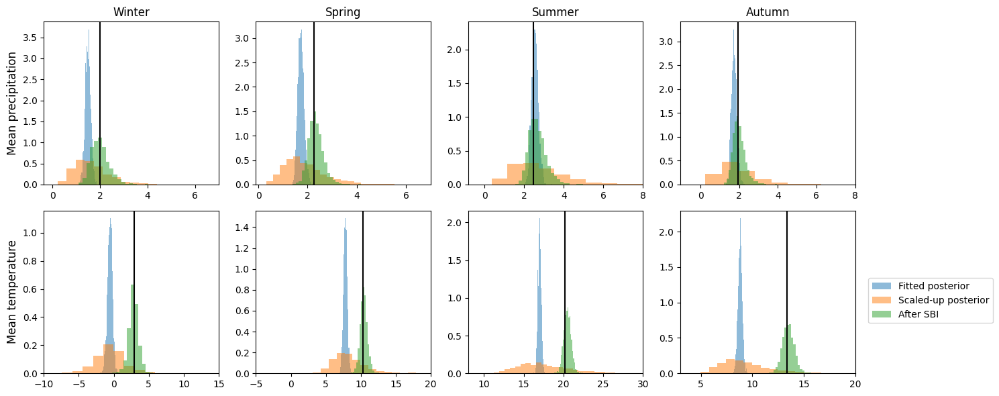

In [464]:
# Plot
idxs = [0, 1, 2, 3, 8, 9, 10, 11]

left_xlims = [None, None, None, None, -10, -5, 8, 3]
right_xlims = [7, 7, 8, 8, 15, 20, 30, 20]

samples_summary_stats_reduced_plot = dict()
samples_summary_stats_reduced_plot["fitted_posterior"] = samples_summary_stats["fitted_posterior"][:, idxs]
# Sort out a 5 diverging runs
samples_summary_stats_reduced_plot["sbi_proposal"] = torch.where(torch.abs(samples_summary_stats["sbi_proposal"][:, idxs]) > 30, torch.nan, samples_summary_stats["sbi_proposal"][:, idxs])# samples_summary_stats["sbi_proposal"][:, idxs]
samples_summary_stats_reduced_plot["sbi_posterior"] = torch.where(torch.abs(samples_summary_stats["sbi_posterior"][:, idxs]) > 30, torch.nan, samples_summary_stats["sbi_posterior"][:, idxs]) # samples_summary_stats["sbi_posterior"][:, idxs]
obs_stats_target_reduced_plot = obs_stats_target[idxs, :]

fig, axs = plt.subplots(2, 4, figsize = (15, 6), layout = "tight")
axs[0, 0].set_ylabel("Mean precipitation", size = "large")
axs[1, 0].set_ylabel("Mean temperature", size = "large")

axs = axs.ravel()
axs[0].set_title("Winter")
axs[1].set_title("Spring")
axs[2].set_title("Summer")
axs[3].set_title("Autumn")

for i in range(obs_stats_target_reduced_plot.shape[0]):
    axs[i].hist(samples_summary_stats_reduced_plot["fitted_posterior"][:, i].numpy(), bins = 30, density = True, alpha = 0.5, label = "Fitted posterior")
    axs[i].hist(samples_summary_stats_reduced_plot["sbi_proposal"][:, i].numpy(), bins = 30, density = True, alpha = 0.5, label = "Scaled-up posterior")
    axs[i].hist(samples_summary_stats_reduced_plot["sbi_posterior"][:, i].numpy(), bins = 30, density = True, alpha = 0.5, label = "After SBI")
    #axs[i].legend(loc = "upper right")
    #axs[i].set_title(titles[i])
    axs[i].axvline(obs_stats_target_reduced_plot[i,:].flatten(), c= "black")
    axs[i].set_xlim(left = left_xlims[i], right = right_xlims[i])
axs[-1].legend(bbox_to_anchor = (1.05, 0.28))
#plt.savefig("plots/analysis_v8/case_study_3e.png", dpi = 300)

In [465]:
obs_hist = t2j(samples_obs["mean_fitted_posterior"])
obs_fut = t2j(samples_obs["sbi_posterior_point_estimate"])

pr_hist, tmin_hist, tavg_hist, tmax_hist = obs_hist[:, :, 0], obs_hist[:, :, 1], obs_hist[:, :, 2], obs_hist[:, :, 3]
pr_fut, tmin_fut, tavg_fut, tmax_fut = obs_fut[:, :, 0], obs_fut[:, :, 1], obs_fut[:, :, 2], obs_fut[:, :, 3]

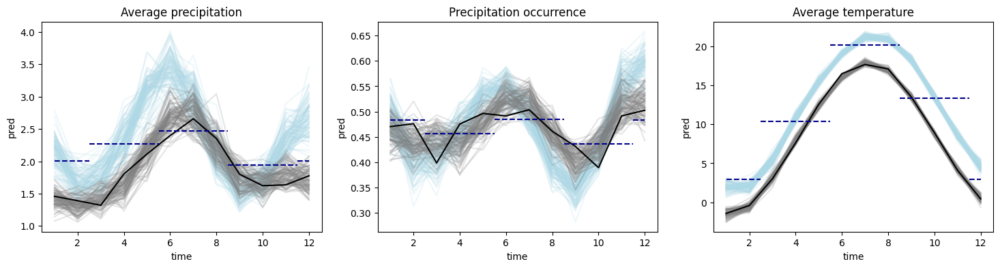

In [466]:
fig, axs = plt.subplots(1,3, figsize = (18,4))
make_line_plots(pr_fut, pr_hist, obs["prec"], basin_data_train.index, ax = axs[0])
add_seasonal_targets(obs_stats_target[:4], axs[0])
axs[0].set_title("Average precipitation")

make_line_plots(pr_fut > 0, pr_hist > 0, obs["prec"] > 0, basin_data_train.index, ax = axs[1])
add_seasonal_targets(obs_stats_target[4:8], axs[1])
axs[1].set_title("Precipitation occurrence")

make_line_plots(tavg_fut, tavg_hist, obs["Tavg"], basin_data_train.index, ax = axs[2])
add_seasonal_targets(obs_stats_target[8:12], axs[2])
axs[2].set_title("Average temperature")
#plt.savefig("plots/analysis_v8/case_study_3e_ensemble.png")

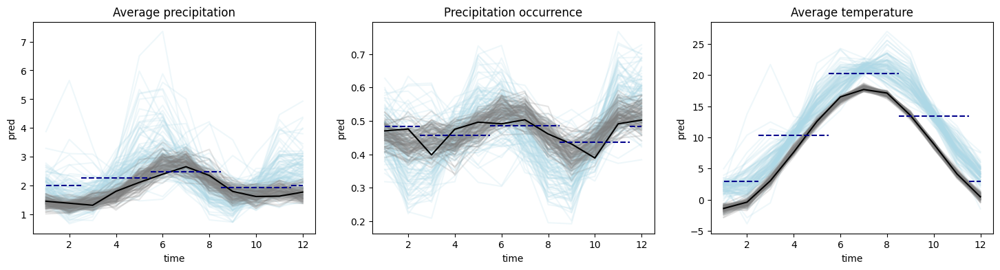

In [467]:
obs_hist = t2j(samples_obs["fitted_posterior"])
obs_fut = t2j(samples_obs["sbi_posterior"])

pr_hist, tmin_hist, tavg_hist, tmax_hist = obs_hist[:, :, 0], obs_hist[:, :, 1], obs_hist[:, :, 2], obs_hist[:, :, 3]
pr_fut, tmin_fut, tavg_fut, tmax_fut = obs_fut[:, :, 0], obs_fut[:, :, 1], obs_fut[:, :, 2], obs_fut[:, :, 3]

fig, axs = plt.subplots(1,3, figsize = (18,4))
make_line_plots(pr_fut, pr_hist, obs["prec"], basin_data_train.index, ax = axs[0])
add_seasonal_targets(obs_stats_target[:4], axs[0])
axs[0].set_title("Average precipitation")

make_line_plots(pr_fut > 0, pr_hist > 0, obs["prec"] > 0, basin_data_train.index, ax = axs[1])
add_seasonal_targets(obs_stats_target[4:8], axs[1])
axs[1].set_title("Precipitation occurrence")

make_line_plots(tavg_fut, tavg_hist, obs["Tavg"], basin_data_train.index, ax = axs[2])
add_seasonal_targets(obs_stats_target[8:12], axs[2])
axs[2].set_title("Average temperature")
#plt.savefig("plots/analysis_v8/case_study_3e_ensemble_full_posterior.png")

### Comparison of SBI posterior for occurrence

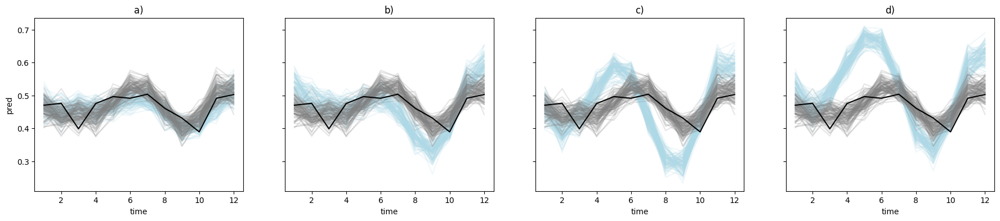

In [117]:
case_studies = ["3a", "3b", "3c", "3d"]
case_study_names = ["a)", "b)", "c)", "d)"]

fig, axs = plt.subplots(1,4, figsize = (22,4), sharey = True)

for i in range(4):

    case_study = case_studies[i]
    case_study_name = case_study_names[i]

    samples_obs = torch.load(f"sbi_results/analysis_v8/case_study_{case_study}_samples_summary_obs.pt")
    
    obs_hist = t2j(samples_obs["mean_fitted_posterior"])
    obs_fut = t2j(samples_obs["sbi_posterior_point_estimate"])
    
    pr_hist, tmin_hist, tavg_hist, tmax_hist = obs_hist[:, :, 0], obs_hist[:, :, 1], obs_hist[:, :, 2], obs_hist[:, :, 3]
    pr_fut, tmin_fut, tavg_fut, tmax_fut = obs_fut[:, :, 0], obs_fut[:, :, 1], obs_fut[:, :, 2], obs_fut[:, :, 3]

    make_line_plots(pr_fut > 0, pr_hist > 0, obs["prec"] > 0, basin_data_train.index, ax = axs[i])
    axs[i].set_title(case_study_name)

    #fig.suptitle("Precipitation occurrence")

plt.savefig("plots/analysis_v8/case_study_3_occ_comparison.png")

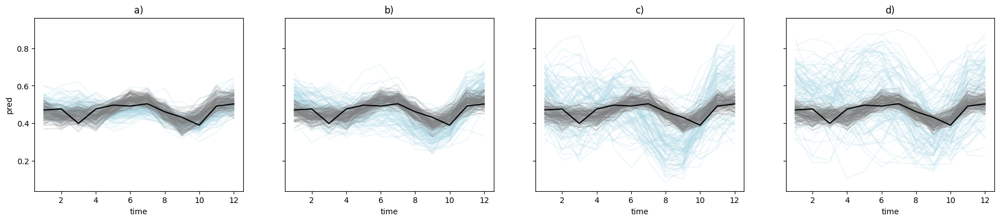

In [118]:
case_studies = ["3a", "3b", "3c", "3d"]
case_study_names = ["a)", "b)", "c)", "d)"]

fig, axs = plt.subplots(1,4, figsize = (22,4), sharey = True)

for i in range(4):

    case_study = case_studies[i]
    case_study_name = case_study_names[i]

    samples_obs = torch.load(f"sbi_results/analysis_v8/case_study_{case_study}_samples_summary_obs.pt")
    
    obs_hist = t2j(samples_obs["fitted_posterior"])
    obs_fut = t2j(samples_obs["sbi_posterior"])
    
    pr_hist, tmin_hist, tavg_hist, tmax_hist = obs_hist[:, :, 0], obs_hist[:, :, 1], obs_hist[:, :, 2], obs_hist[:, :, 3]
    pr_fut, tmin_fut, tavg_fut, tmax_fut = obs_fut[:, :, 0], obs_fut[:, :, 1], obs_fut[:, :, 2], obs_fut[:, :, 3]

    make_line_plots(pr_fut > 0, pr_hist > 0, obs["prec"] > 0, basin_data_train.index, ax = axs[i])
    axs[i].set_title(case_study_name)

    #fig.suptitle("Precipitation occurrence")

plt.savefig("plots/analysis_v8/case_study_3_occ_comparison_full_posterior.png")

# Old stuff

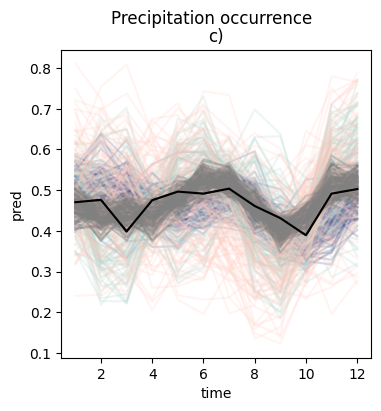

In [514]:
case_studies = ["4b", "6", "5b"]
case_study_names = ["a)", "b)", "c)"]
colors = ["#384085", "#A6D2C8", "#FFCBBF"]

fig, ax = plt.subplots(1,1, figsize = (4,4), sharey = True)

for i in range(3):

    case_study = case_studies[i]
    case_study_name = case_study_names[i]

    samples_summary_stats = torch.load(f"sbi_results/case_study_{case_study}_samples_summary_stats.pt")
    samples_obs = torch.load(f"sbi_results/case_study_{case_study}_samples_obs.pt")
    
    obs_hist = t2j(samples_obs["mean_fitted_posterior"])
    obs_fut = t2j(samples_obs["sbi_posterior"])
    
    pr_hist, tmin_hist, tavg_hist, tmax_hist = obs_hist[:, :, 0], obs_hist[:, :, 1], obs_hist[:, :, 2], obs_hist[:, :, 3]
    pr_fut, tmin_fut, tavg_fut, tmax_fut = obs_fut[:, :, 0], obs_fut[:, :, 1], obs_fut[:, :, 2], obs_fut[:, :, 3]

    make_line_plots(pr_fut > 0, pr_hist > 0, obs["prec"] > 0, basin_data_train.index, ax = ax, color_fut=colors[i])
    ax.set_title(case_study_name)

    fig.suptitle("Precipitation occurrence")



## Other analysis

Text(0.5, 1.0, 'Average temperature')

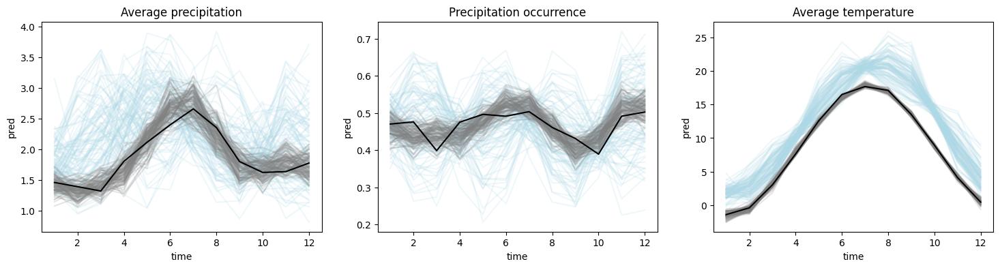

In [206]:
fig, axs = plt.subplots(1,3, figsize = (18,4))
make_line_plots(pr_fut, pr_hist, obs["prec"], basin_data_train.index, ax = axs[0])
#add_seasonal_targets(obs_stats_target[:4], axs[0])
axs[0].set_title("Average precipitation")

make_line_plots(pr_fut > 0, pr_hist > 0, obs["prec"] > 0, basin_data_train.index, ax = axs[1])
#add_seasonal_targets(obs_stats_target[4:9], axs[1])
axs[1].set_title("Precipitation occurrence")

make_line_plots(tavg_fut, tavg_hist, obs["Tavg"], basin_data_train.index, ax = axs[2])
#add_seasonal_targets(obs_stats_target[8:], axs[2])
axs[2].set_title("Average temperature")



Text(0.5, 1.0, 'Average temperature')

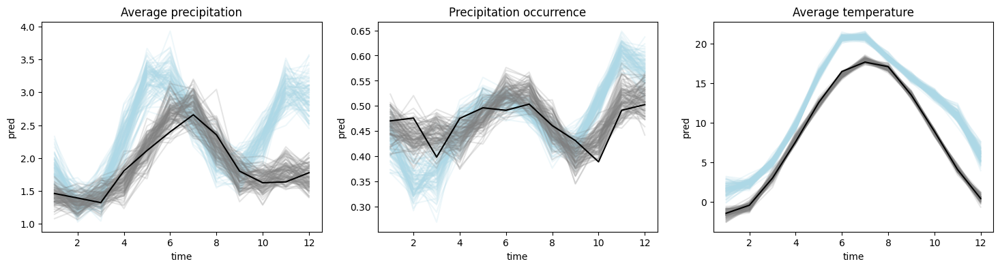

In [200]:
fig, axs = plt.subplots(1,3, figsize = (18,4))
make_line_plots(pr_fut, pr_hist, obs["prec"], basin_data_train.index, ax = axs[0])
#add_seasonal_targets(obs_stats_target[:4], axs[0])
axs[0].set_title("Average precipitation")

make_line_plots(pr_fut > 0, pr_hist > 0, obs["prec"] > 0, basin_data_train.index, ax = axs[1])
#add_seasonal_targets(obs_stats_target[4:9], axs[1])
axs[1].set_title("Precipitation occurrence")

make_line_plots(tavg_fut, tavg_hist, obs["Tavg"], basin_data_train.index, ax = axs[2])
#add_seasonal_targets(obs_stats_target[8:], axs[2])
axs[2].set_title("Average temperature")



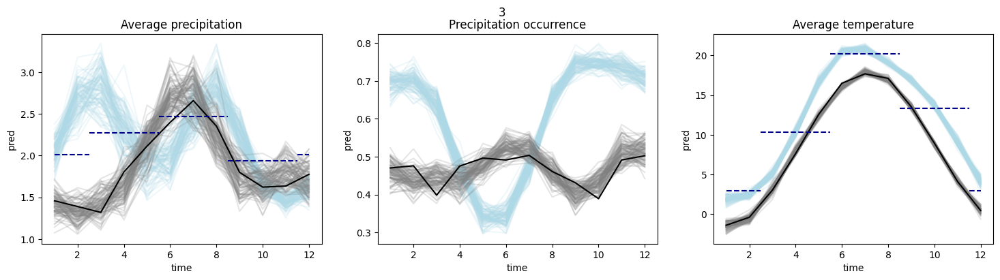

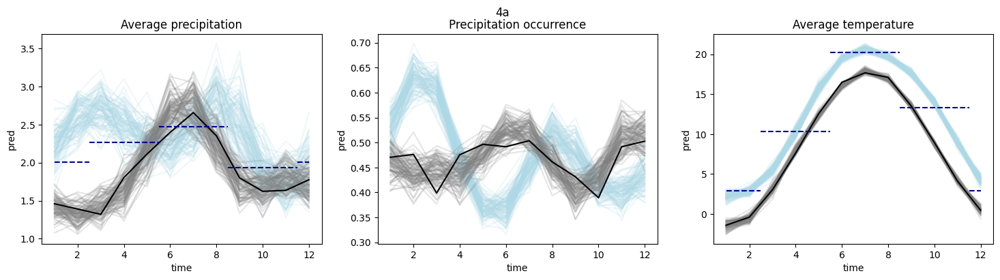

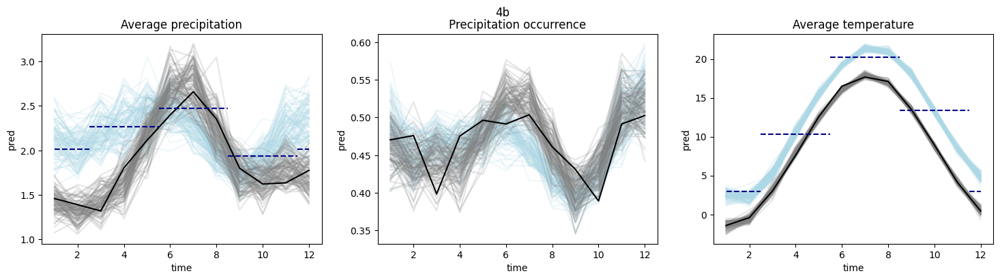

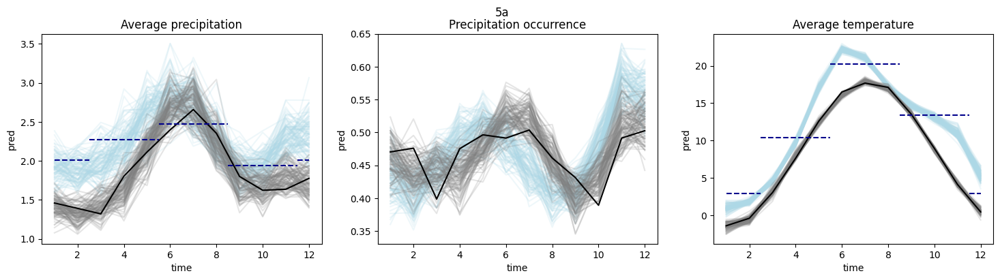

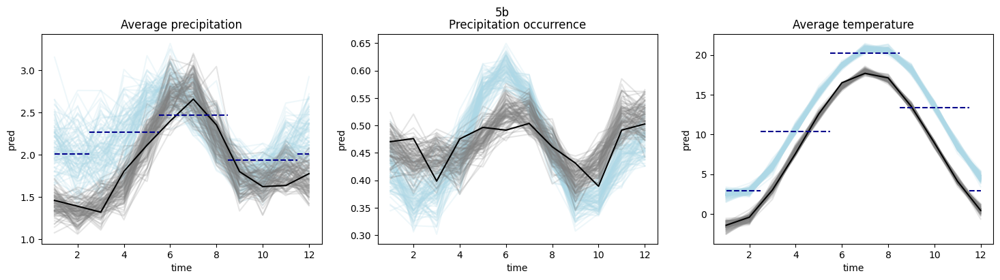

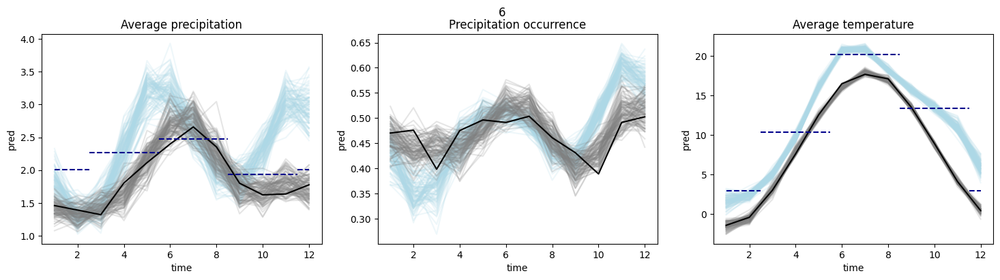

In [304]:
case_studies = ["3", "4a", "4b", "5a", "5b", "6"]

for case_study in case_studies:

    samples_summary_stats = torch.load(f"sbi_results/case_study_{case_study}_samples_summary_stats.pt")
    samples_obs = torch.load(f"sbi_results/case_study_{case_study}_samples_obs.pt")
    
    obs_hist = t2j(samples_obs["mean_fitted_posterior"])
    obs_fut = t2j(samples_obs["sbi_posterior_point_estimate"])
    
    pr_hist, tmin_hist, tavg_hist, tmax_hist = obs_hist[:, :, 0], obs_hist[:, :, 1], obs_hist[:, :, 2], obs_hist[:, :, 3]
    pr_fut, tmin_fut, tavg_fut, tmax_fut = obs_fut[:, :, 0], obs_fut[:, :, 1], obs_fut[:, :, 2], obs_fut[:, :, 3]

    fig, axs = plt.subplots(1,3, figsize = (18,4))
    make_line_plots(pr_fut, pr_hist, obs["prec"], basin_data_train.index, ax = axs[0])
    add_seasonal_targets(obs_stats_target[:4], axs[0])
    axs[0].set_title("Average precipitation")
    
    make_line_plots(pr_fut > 0, pr_hist > 0, obs["prec"] > 0, basin_data_train.index, ax = axs[1])
    axs[1].set_title("Precipitation occurrence")
    
    make_line_plots(tavg_fut, tavg_hist, obs["Tavg"], basin_data_train.index, ax = axs[2])
    add_seasonal_targets(obs_stats_target[4:], axs[2])
    axs[2].set_title("Average temperature")

    fig.suptitle(case_study)
    plt.show()
    

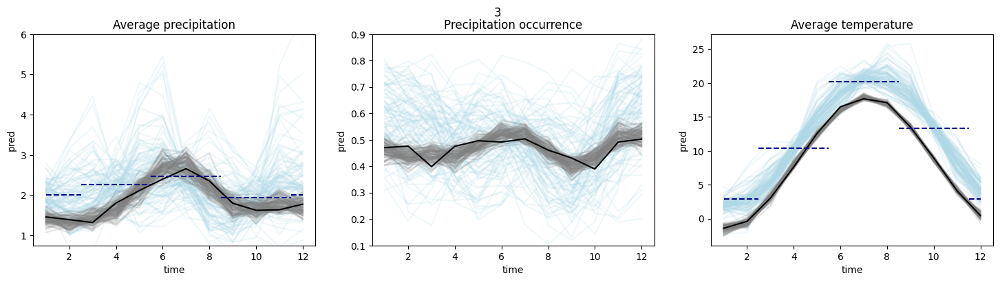

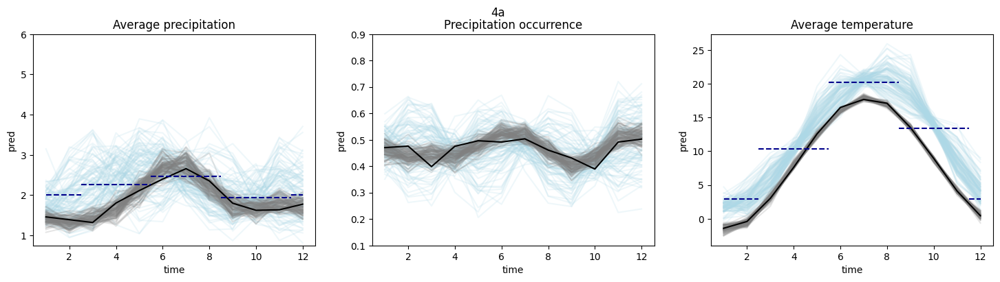

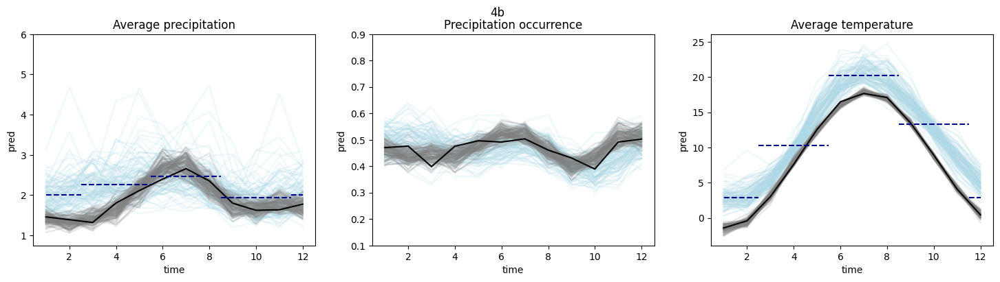

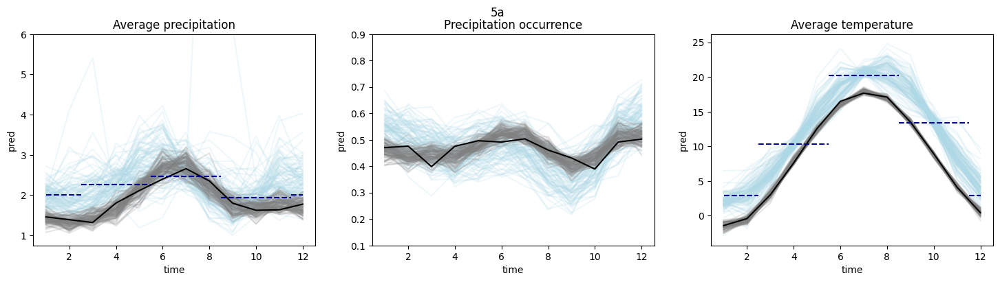

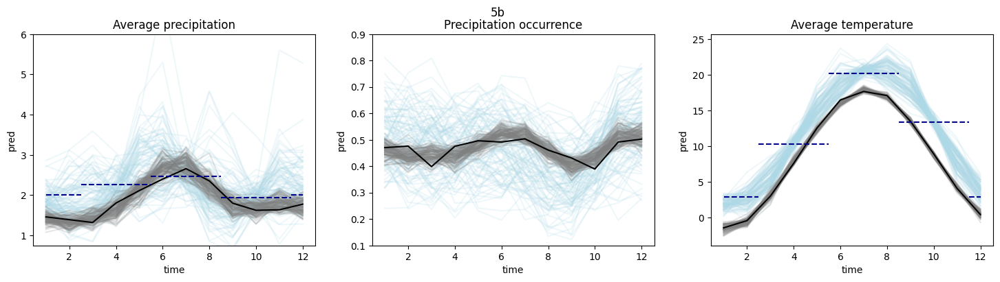

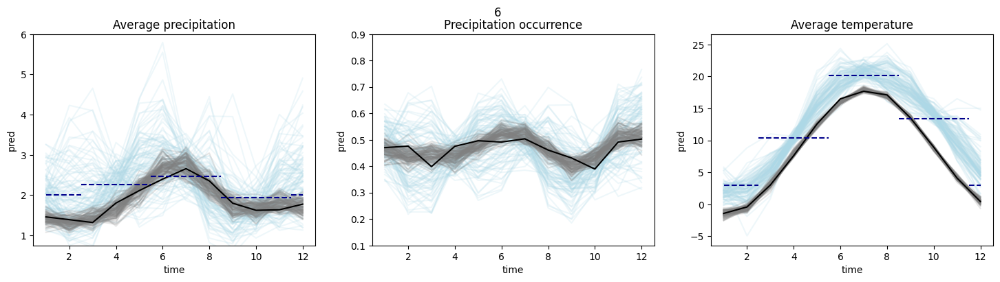

In [308]:
case_studies = ["3", "4a", "4b", "5a", "5b", "6"]

for case_study in case_studies:

    samples_summary_stats = torch.load(f"sbi_results/case_study_{case_study}_samples_summary_stats.pt")
    samples_obs = torch.load(f"sbi_results/case_study_{case_study}_samples_obs.pt")
    
    obs_hist = t2j(samples_obs["mean_fitted_posterior"])
    obs_fut = t2j(samples_obs["sbi_posterior"])
    
    pr_hist, tmin_hist, tavg_hist, tmax_hist = obs_hist[:, :, 0], obs_hist[:, :, 1], obs_hist[:, :, 2], obs_hist[:, :, 3]
    pr_fut, tmin_fut, tavg_fut, tmax_fut = obs_fut[:, :, 0], obs_fut[:, :, 1], obs_fut[:, :, 2], obs_fut[:, :, 3]

    fig, axs = plt.subplots(1,3, figsize = (18,4))
    make_line_plots(pr_fut, pr_hist, obs["prec"], basin_data_train.index, ax = axs[0])
    add_seasonal_targets(obs_stats_target[:4], axs[0])
    axs[0].set_ylim(0.75, 6)
    axs[0].set_title("Average precipitation")
    
    make_line_plots(pr_fut > 0, pr_hist > 0, obs["prec"] > 0, basin_data_train.index, ax = axs[1])
    axs[1].set_title("Precipitation occurrence")
    axs[1].set_ylim(0.1, 0.9)
    
    make_line_plots(tavg_fut, tavg_hist, obs["Tavg"], basin_data_train.index, ax = axs[2])
    add_seasonal_targets(obs_stats_target[4:], axs[2])
    axs[2].set_title("Average temperature")

    fig.suptitle(case_study)
    plt.show()
    

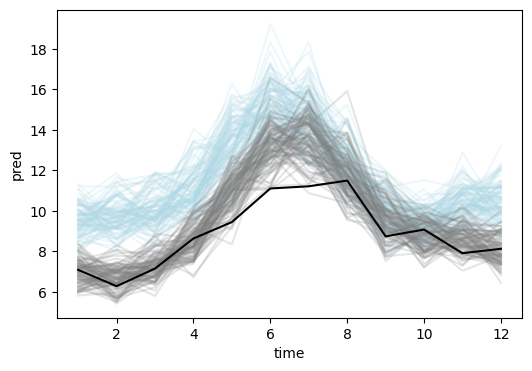

In [119]:
samples_summary_stats = torch.load("sbi_results/case_study_5a_samples_summary_stats.pt")
samples_obs = torch.load("sbi_results/case_study_5a_samples_obs.pt")

obs_hist = t2j(samples_obs["mean_fitted_posterior"])
obs_fut = t2j(samples_obs["sbi_posterior_point_estimate"])

pr_hist, tmin_hist, tavg_hist, tmax_hist = obs_hist[:, :, 0], obs_hist[:, :, 1], obs_hist[:, :, 2], obs_hist[:, :, 3]
pr_fut, tmin_fut, tavg_fut, tmax_fut = obs_fut[:, :, 0], obs_fut[:, :, 1], obs_fut[:, :, 2], obs_fut[:, :, 3]

make_line_plots_quantile(pr_fut, pr_hist, obs["prec"], basin_data_train.index)

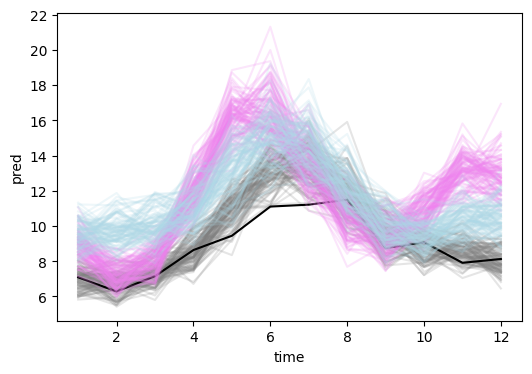

In [173]:
fig, ax = plt.subplots(figsize = (6,4))
make_lines_quantile(pr_hist, basin_data_train.index, ax = ax, col = "grey", q = 0.95)
make_lines_quantile_obs(obs["prec"], basin_data_train.index, ax = ax, q = 0.95)
pr_fut = t2j(torch.load("sbi_results/case_study_3b_samples_obs.pt")["sbi_posterior_point_estimate"])[:, :, 0]
make_lines_quantile(pr_fut, basin_data_train.index, ax = ax, col = "violet", q = 0.95)
pr_fut = t2j(torch.load("sbi_results/case_study_5a_samples_obs.pt")["sbi_posterior_point_estimate"])[:, :, 0]
make_lines_quantile(pr_fut, basin_data_train.index, ax = ax, col = "lightblue", q = 0.95)
  

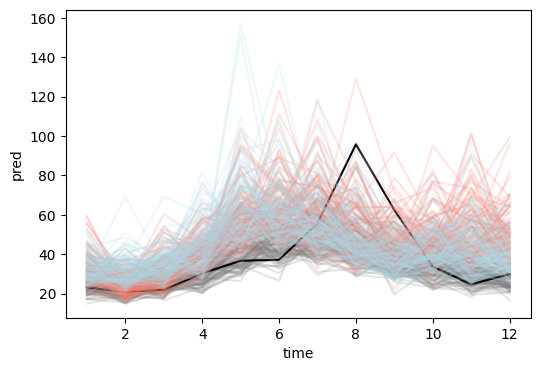

In [163]:
fig, ax = plt.subplots(figsize = (6,4))
make_lines_max(pr_hist, basin_data_train.index, ax = ax, col = "grey")
make_lines_max_obs(obs["prec"], basin_data_train.index, ax = ax)
pr_fut = t2j(torch.load("sbi_results/case_study_3b_samples_obs.pt")["sbi_posterior_point_estimate"])[:, :, 0]
make_lines_max(pr_fut, basin_data_train.index, ax = ax, col = "salmon")
pr_fut = t2j(torch.load("sbi_results/case_study_5a_samples_obs.pt")["sbi_posterior_point_estimate"])[:, :, 0]
make_lines_max(pr_fut, basin_data_train.index, ax = ax, col = "lightblue")
  

In [159]:
def make_lines_quantile(vals, time, ax, col = "lightblue", q = 0.95):
    df_preds = pd.DataFrame(vals.squeeze().T)
    df_preds["time"] = time
    df_preds = df_preds.melt(id_vars="time", value_name="pred")
    df_preds = df_preds.groupby([df_preds.time.dt.month, df_preds.variable]).quantile(q).drop(columns="time").reset_index()
    sns.lineplot(df_preds, x = "time", y = "pred", units = "variable", estimator = None, color = col, alpha = 0.2, ax = ax)

def make_lines_quantile_obs(obs, time, ax, q = 0.95):
    df_obs = pd.DataFrame({"obs": obs.squeeze(), "time": time})
    df_obs = df_obs.groupby(df_obs.time.dt.month)["obs"].quantile(q).reset_index()
    sns.lineplot(df_obs, x="time", y="obs", color = "black", ax = ax)

def make_lines_max(vals, time, ax, col = "lightblue"):
    df_preds = pd.DataFrame(vals.squeeze().T)
    df_preds["time"] = time
    df_preds = df_preds.melt(id_vars="time", value_name="pred")
    df_preds = df_preds.groupby([df_preds.time.dt.month, df_preds.variable]).max().drop(columns="time").reset_index()
    sns.lineplot(df_preds, x = "time", y = "pred", units = "variable", estimator = None, color = col, alpha = 0.2, ax = ax)

def make_lines_max_obs(obs, time, ax):
    df_obs = pd.DataFrame({"obs": obs.squeeze(), "time": time})
    df_obs = df_obs.groupby(df_obs.time.dt.month)["obs"].max().reset_index()
    sns.lineplot(df_obs, x="time", y="obs", color = "black", ax = ax)



<Axes: xlabel='time', ylabel='value'>

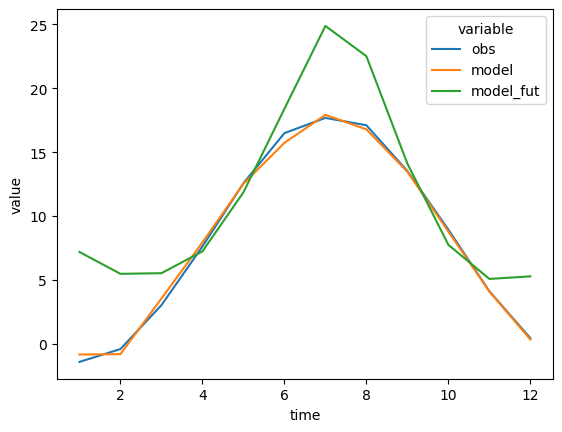

In [818]:
df_obs = pd.DataFrame({"obs": obs["Tavg"].squeeze(), "model": tavg_hist[0, :], "model_fut": tavg_fut[0, :], "time": basin_data_train.index})
df_obs = df_obs.groupby(df_obs.time.dt.month)[["obs", "model", "model_fut"]].mean().reset_index()
df_obs = df_obs.melt(id_vars = "time")
sns.lineplot(df_obs, x="time", y="value", hue = "variable")


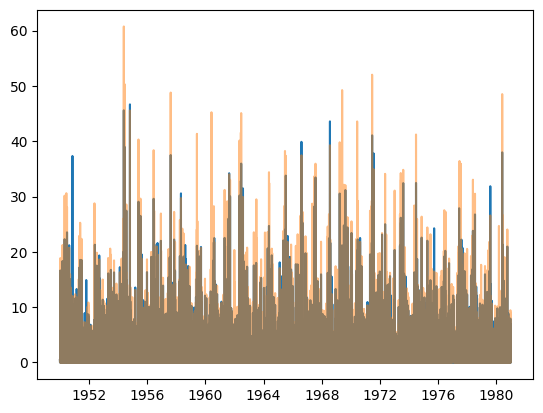

In [790]:
plt.plot(basin_data_train.index, pr_hist[0, :], label = "Base")
plt.plot(basin_data_train.index, pr_fut[0, :], alpha = 0.5, label = "Adjusted")


Text(0.5, 1.0, 'Precipitation')

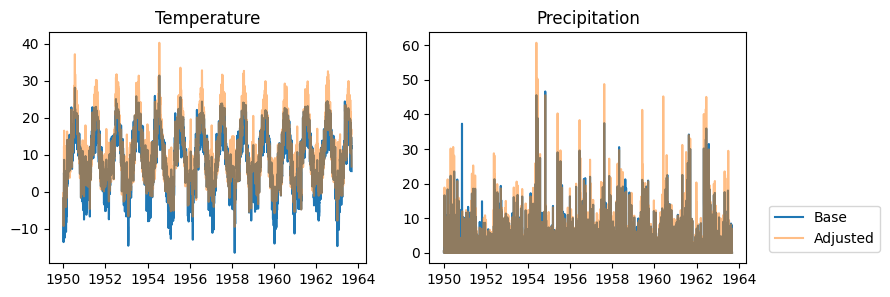

In [792]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (9, 3))

ax1.plot(basin_data_train.index[:5000], tavg_hist[0, :5000], label = "Base")
ax1.plot(basin_data_train.index[:5000], tavg_fut[0, :5000], alpha = 0.5, label = "Adjusted")
ax1.set_title("Temperature")

ax2.plot(basin_data_train.index[:5000], pr_hist[0, :5000], label = "Base")
ax2.plot(basin_data_train.index[:5000], pr_fut[0, :5000], alpha = 0.5, label = "Adjusted")
ax2.legend(bbox_to_anchor = (1.05, 0.28))
ax2.set_title("Precipitation")

## Evaluate 7

In [301]:
samples_summary_stats = torch.load("sbi_results/case_study_7_samples_summary_stats.pt")
samples_obs = torch.load("sbi_results/case_study_7_samples_obs.pt")

In [304]:
obs_hist = t2j(samples_obs["mean_fitted_posterior"])
obs_fut = t2j(samples_obs["sbi_posterior_point_estimate"])

pr_hist, tmin_hist, tavg_hist, tmax_hist = obs_hist[:, :, 0], obs_hist[:, :, 1], obs_hist[:, :, 2], obs_hist[:, :, 3]
pr_fut, tmin_fut, tavg_fut, tmax_fut = obs_fut[:, :, 0], obs_fut[:, :, 1], obs_fut[:, :, 2], obs_fut[:, :, 3]

Text(0.5, 1.0, 'Average temperature')

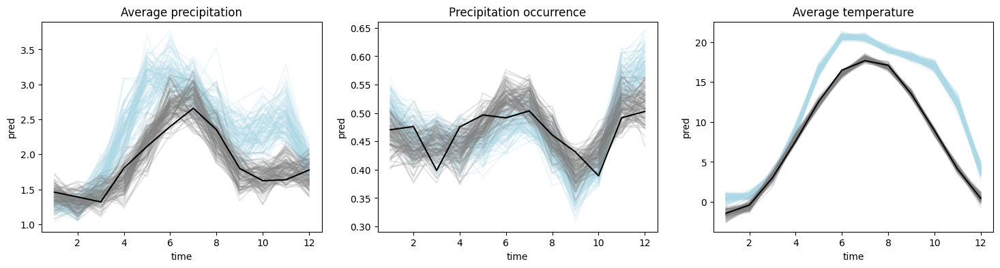

In [306]:
fig, axs = plt.subplots(1,3, figsize = (18,4))
make_line_plots(pr_fut, pr_hist, obs["prec"], basin_data_train.index, ax = axs[0])
#add_seasonal_targets(obs_stats_target[:4], axs[0])
axs[0].set_title("Average precipitation")

make_line_plots(pr_fut > 0, pr_hist > 0, obs["prec"] > 0, basin_data_train.index, ax = axs[1])
#add_seasonal_targets(obs_stats_target[4:9], axs[1])
axs[1].set_title("Precipitation occurrence")

make_line_plots(tavg_fut, tavg_hist, obs["Tavg"], basin_data_train.index, ax = axs[2])
#add_seasonal_targets(obs_stats_target[8:], axs[2])
axs[2].set_title("Average temperature")


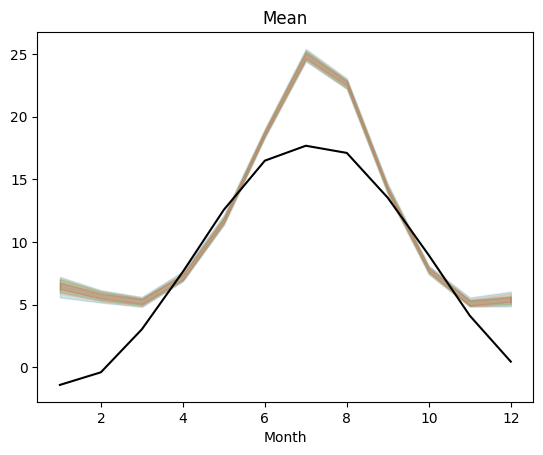

In [475]:
get_mean_plot(obs["Tavg"], tavg_fut, basin_data_train.index)


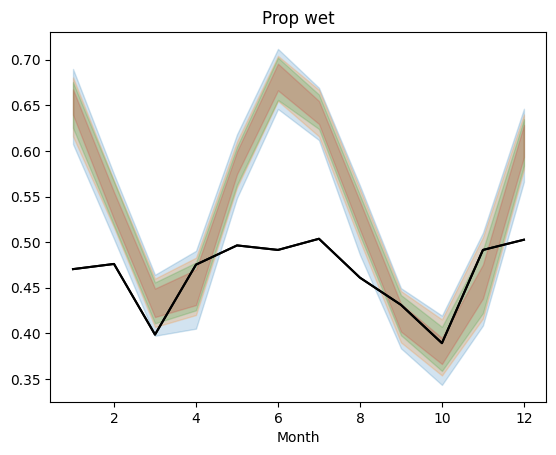

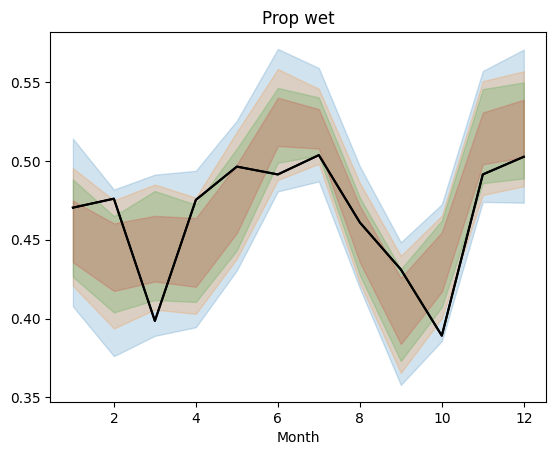

In [477]:
get_prop_wet_plot(obs["prec"], pr_fut, basin_data_train.index)
plt.show()
get_prop_wet_plot(obs["prec"], svi_preds["prec"], basin_data_train.index)


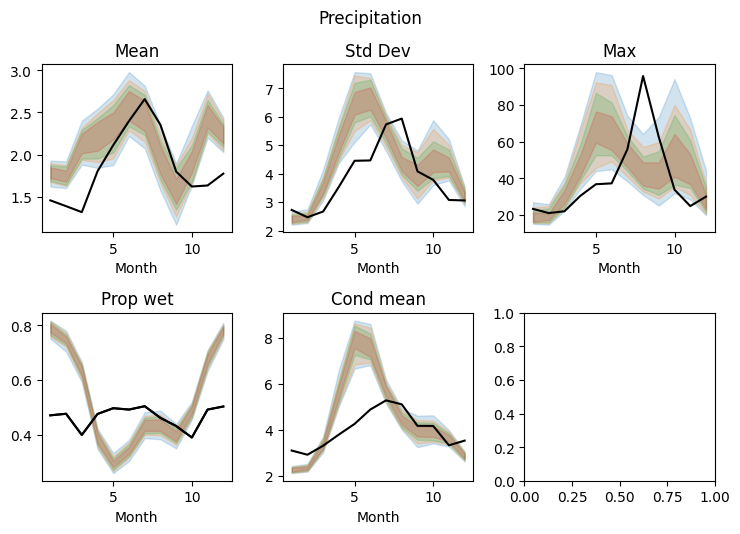

In [1047]:
fig = plt.figure(layout="tight", figsize=(7.5, 7.5))
fig.suptitle("Precipitation")

gs = GridSpec(3, 3, figure=fig)

# Row 1
ax_row_1 = [fig.add_subplot(gs[0, i]) for i in range(3)]
get_mean_plot(obs["prec"], pr_fut, basin_data_train.index, ax=ax_row_1[0])
get_std_plot(obs["prec"], pr_fut, basin_data_train.index, ax=ax_row_1[1])
get_max_plot(obs["prec"], pr_fut, basin_data_train.index, ax=ax_row_1[2])

# Row 2
ax_row_2 = [fig.add_subplot(gs[1, i]) for i in range(3)]
get_prop_wet_plot(obs["prec"], pr_fut, basin_data_train.index, ax=ax_row_2[0])
get_cond_mean_plot(obs["prec"], pr_fut, basin_data_train.index, ax=ax_row_2[1])


Overview plots:

In [ ]:
theta_adj = samples.median(0)[0].unsqueeze(0)
rain_samples_adj = simulator_get_rain(torch.concat(100*[theta_adj], axis = 0))

In [487]:
future_obs = {"prec": rain_samples_adj[:, :, 0], "Tmin": rain_samples_adj[:, :, 1], "Tavg": rain_samples_adj[:, :, 2], "Tmax": rain_samples_adj[:, :, 3], "Trange": rain_samples_adj[:, :, 3] - rain_samples_adj[:, :, 1]}
future_obs["Tskew"] = (future_obs["Tavg"] - future_obs["Tmin"])/future_obs["Trange"]
future_obs = {k: np.expand_dims(e, -1) for k, e in future_obs.items()}

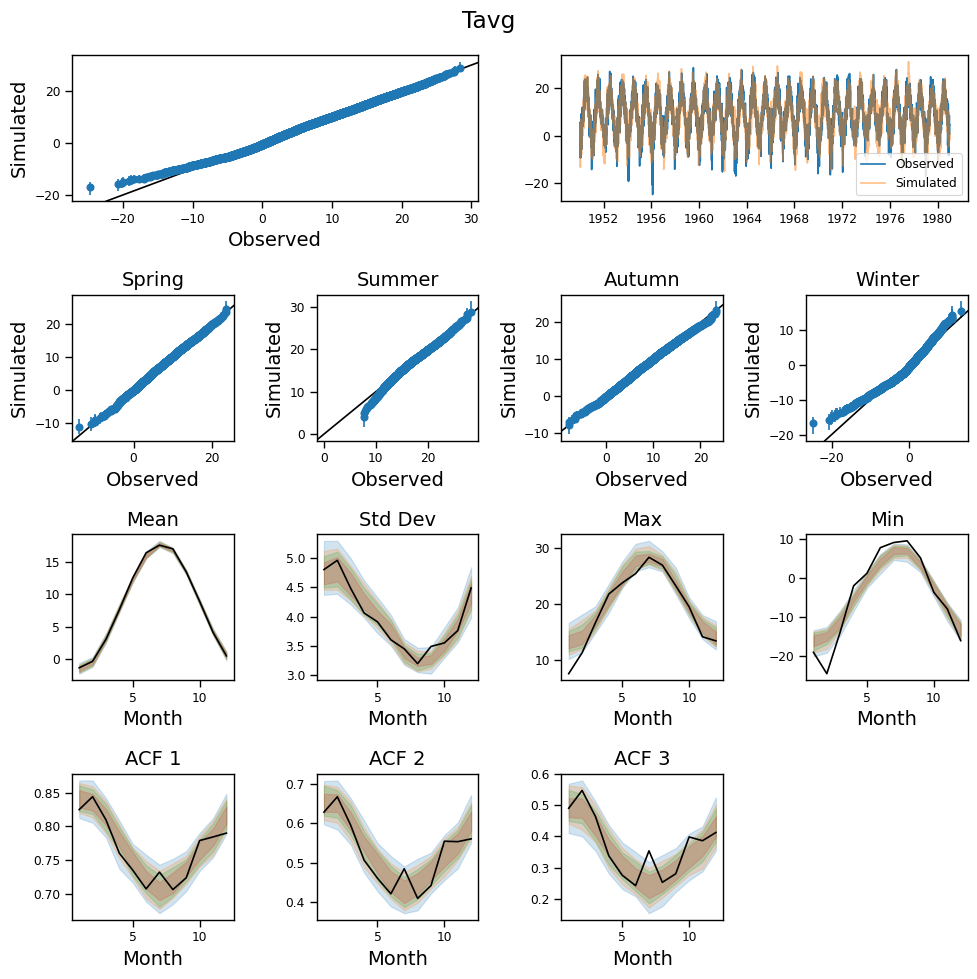

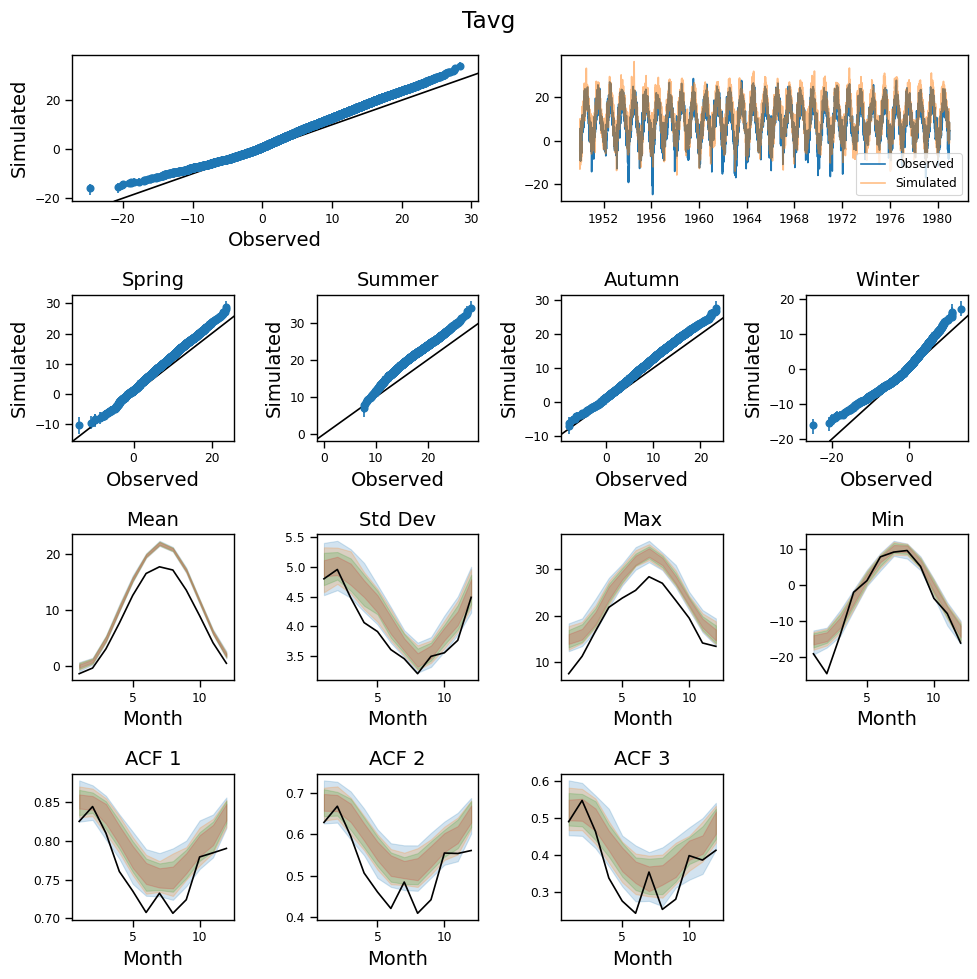

In [489]:
Tavg_overview(obs, svi_preds, basin_data_train)
Tavg_overview(obs, future_obs, basin_data_train)

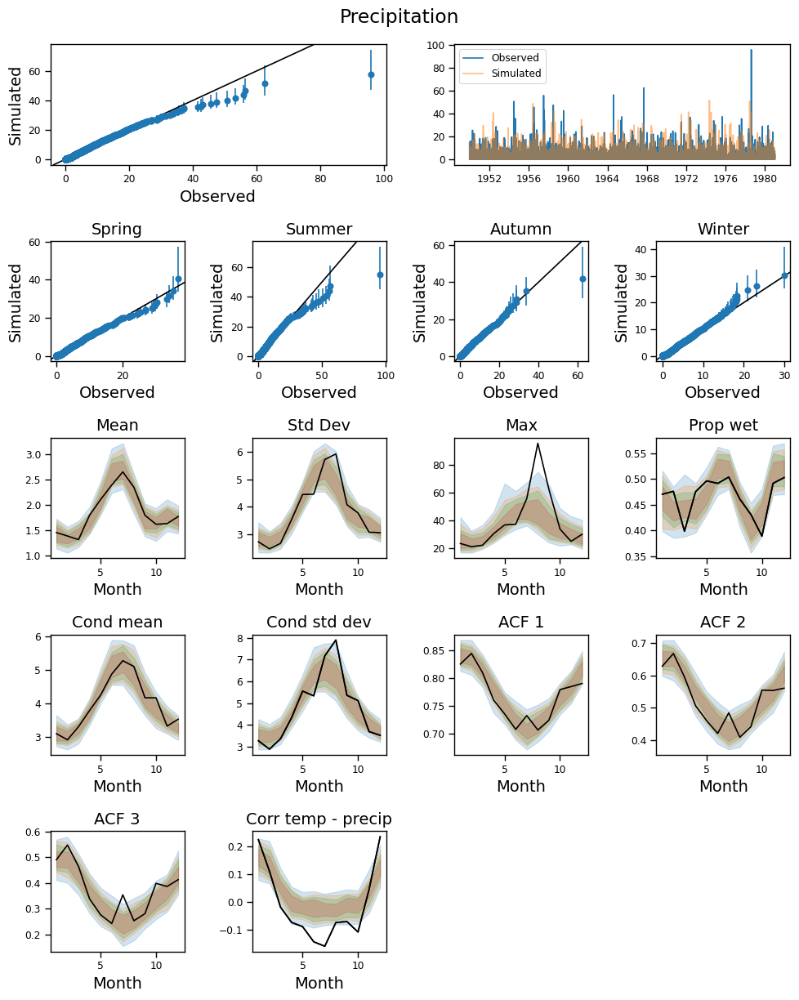

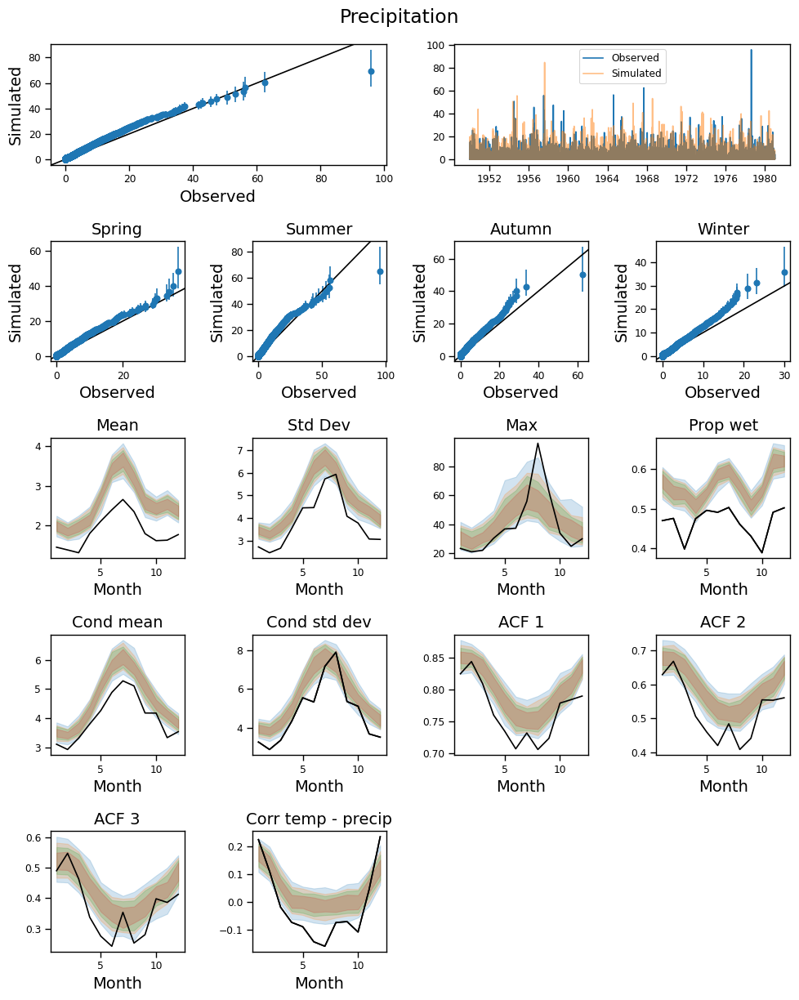

In [491]:
prec_overview(obs, svi_preds, basin_data_train)
prec_overview(obs, future_obs, basin_data_train)

In [197]:
print(f"Cond mean hist {rain_hist[rain_hist > 0].mean()}, cond mean fut: {rain_fut[rain_fut > 0].mean()}")

Cond mean hist 4.085076808929443, cond mean fut: 3.912468194961548


In [80]:
import seaborn as sns

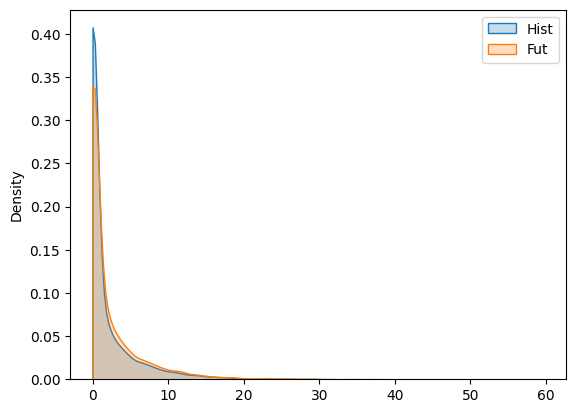

In [341]:
sns.kdeplot(rain_hist, cut = 0, fill = True, label = "Hist")
sns.kdeplot(rain_fut, cut = 0, fill = True, label = "Fut")
plt.legend()

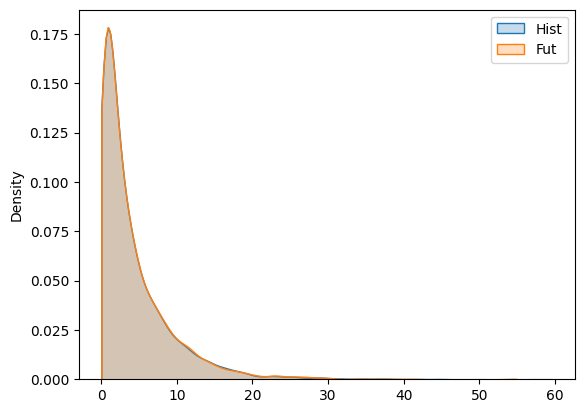

In [343]:
sns.kdeplot(rain_hist[rain_hist > 0], cut = 0, fill = True, label = "Hist")
sns.kdeplot(rain_fut[rain_fut > 0], cut = 0, fill = True, label = "Fut")
plt.legend()

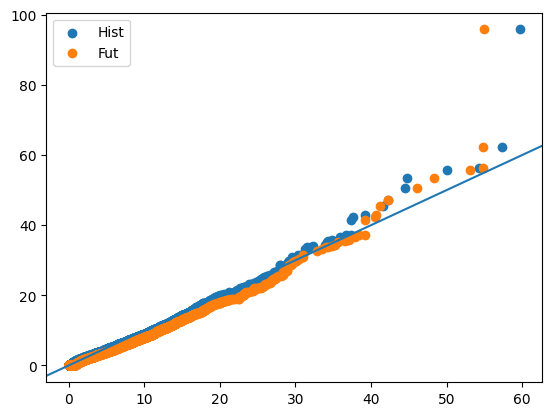

In [345]:
plt.scatter(np.sort(rain_hist), np.sort(rain_obs), label = "Hist")
plt.scatter(np.sort(rain_fut), np.sort(rain_obs), label = "Fut")
plt.axline((0,0), slope = 1)
plt.legend()

## Other

In [378]:
def precip_summary_stats(pr, cdd_thresh=0.0, axis=0):
    pmean = jnp.mean(pr, axis=axis)
    p95 = jnp.nanquantile(jnp.where(pr > 0, pr, jnp.nan), 0.95, axis=axis)
    rp95 = jnp.nanmean(jnp.where(pr > p95, pr, jnp.nan), axis=axis)
    fwd = jnp.mean(pr > 0, axis=axis)
    cdd = wx.utils.cumulative_dry_days(pr, threshold=cdd_thresh, axis=axis)
    return jnp.stack([pmean, rp95, fwd, cdd])

def tair_summary_stats(Tair_mean, Tair_min, Tair_max):
    Tavg = jnp.mean(Tair_mean, axis=0)
    Trange = jnp.mean(Tair_max - Tair_min, axis=0)
    Tskew = jnp.mean((Tair_mean - Tair_min) / (Tair_max - Tair_min), axis=0)
    ftd = jnp.mean(jnp.where(Tair_mean > 0, 1, 0), axis=0)
    # ffd = jnp.mean(jnp.where(Tair_mean <= 0, 1, 0), axis=0)
    return jnp.stack([Tavg, Trange, Tskew, ftd])

def wgen_summary_stats(ts, precip, Tmin, Tavg, Tmax):
    precip_stats = precip_summary_stats(precip)
    Tair_stats = tair_summary_stats(Tavg, Tmin, Tmax)
    return jnp.concat([precip_stats, Tair_stats], axis=0)
    # return precip_stats

summary_stat_names = ["prec_mean", "rp95", "norm wet days", "mean dry spell length", "Tair_mean", "Tair_range", "Tair_skew", "norm thaw days"]

In [379]:
wgen_sim, wgen_prior = wgen.simulator(observable=wgen_summary_stats, rng_seed=1234)

In [380]:
sim_stats = wgen_sim(wgen_prior.sample(jax.random.PRNGKey(0), (10,)))
sim_stats.shape

(10, 8)

In [381]:
obs['Tmin'] = obs['Tavg'] - obs['Tskew']*obs['Trange']
obs['Tmax'] = obs['Tmin'] + obs['Trange']
obs_stats = wgen_summary_stats(wgen.timestamps[0,:,:], obs['prec'].T, obs['Tmin'].T, obs['Tavg'].T, obs['Tmax'].T)
obs_stats

Array([[ 1.8636943 ],
       [20.212057  ],
       [ 0.4654244 ],
       [ 3.2772062 ],
       [ 8.347303  ],
       [ 7.7874007 ],
       [ 0.47035772],
       [ 0.84827346]], dtype=float32)

We can use the "true" prior of the model by wrapping it in a `torch` distribution as such:

    wx.distributions.NumPyro2TorchDistribution(wgen_prior)

However, the true prior for the GLM-type models is very uninformative and will generate many physically implausible or simply invalid simulations.

The two options here are therefore:

1. Design a better prior
2. Use the SVI calibrated posterior to construct a "better" prior for SBI

The more prinicpled option is (1), but it's also hard and time consuming. So we go with (2) instead :)


In [383]:
wgen_sbi = jax2torch(wgen_sim)
# wgen_sbi_prior = process_prior(wx.distributions.NumPyro2TorchDistribution(wgen_prior))


In [384]:
svi_posterior = guide.get_posterior(svi_result.params)
svi_posterior_torch = torch.distributions.MultivariateNormal(j2t(svi_posterior.mean), j2t(svi_posterior.covariance_matrix))
scale_factor = 2
svi_proposal = torch.distributions.MultivariateNormal(j2t(svi_posterior.mean), j2t(scale_factor**2*jnp.eye(len(svi_posterior.mean))*jnp.diag(svi_posterior.covariance_matrix)))
# svi_proposal = torch.distributions.MultivariateNormal(j2t(svi_posterior.mean), j2t(scale_factor**2*jnp.eye(len(svi_posterior.mean))*svi_posterior.covariance_matrix))

# sample from propsoal prior and run simulations
sbi_prior_samples = svi_proposal.sample((100,))
sbi_prior_obs = wgen_sbi(sbi_prior_samples)

In [385]:

# sample from SVI posterior
svi_posterior_samples = svi_posterior_torch.sample((200,))
svi_posterior_sims = wgen_sbi(svi_posterior_samples)

In [386]:
# sample from variance-inflated proposal
svi_prposoal_samples = svi_proposal.sample((200,))
svi_proposal_sims = wgen_sbi(svi_prposoal_samples)

In [387]:
posterior_sims = pd.DataFrame(svi_posterior_sims.numpy(), columns=summary_stat_names)
proposal_sims = pd.DataFrame(svi_proposal_sims.numpy(), columns=summary_stat_names)

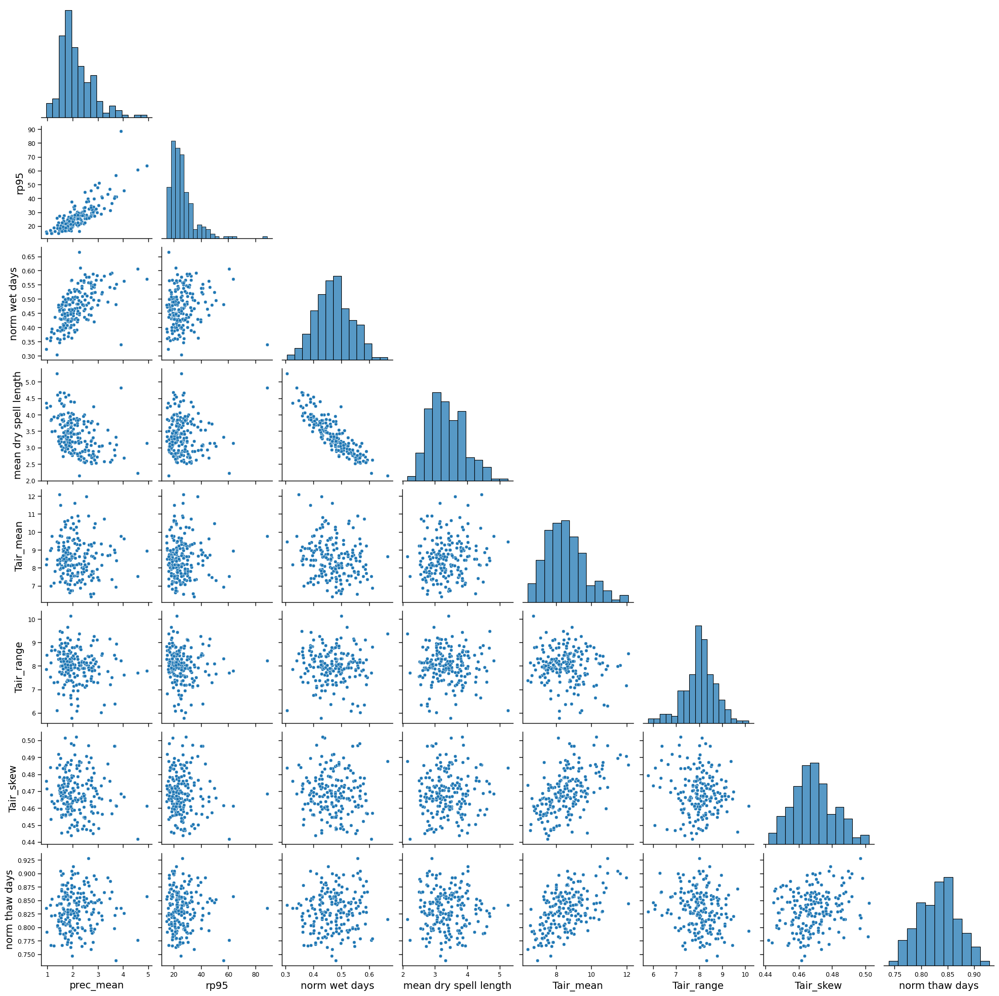

In [389]:
sns.set_context("paper", rc={"font.size":14,"axes.titlesize":14,"axes.labelsize":14})
sns.pairplot(proposal_sims.dropna(), corner=True)
#plt.savefig("../plots/wgen_summary_stats_corner_plot.png")

In [46]:
# compute empirical mean and covariance, dropping rows with nan values
svi_posterior_sims_mean = torch.mean(svi_posterior_sims[torch.isfinite(svi_posterior_sims).all(dim=1),:], dim=0)
svi_proposal_sims_mean = torch.mean(svi_proposal_sims[torch.isfinite(svi_proposal_sims).all(dim=1),:], dim=0)
svi_posterior_sims_cov = torch.cov(svi_posterior_sims[torch.isfinite(svi_posterior_sims).all(dim=1),:].T)
svi_proposal_sims_cov = torch.cov(svi_proposal_sims[torch.isfinite(svi_proposal_sims).all(dim=1),:].T)

<Axes: >

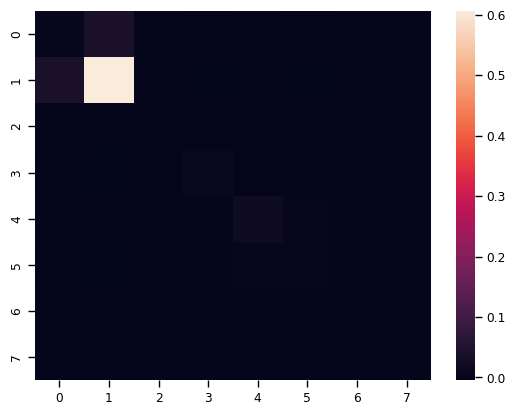

In [47]:
sns.heatmap(svi_posterior_sims_cov.numpy())

<Axes: >

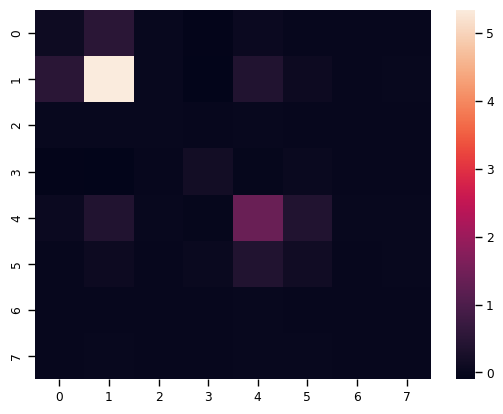

In [48]:
sns.heatmap(svi_proposal_sims_cov.numpy())

In [49]:
proposal_sims_dist = torch.distributions.MultivariateNormal(svi_proposal_sims_mean, svi_proposal_sims_cov)
obs_stats2 = t2j(proposal_sims_dist.sample((1,)).T)
obs_stats2 - obs_stats

Array([[-2.0868897e-01],
       [-2.3722725e+00],
       [ 1.8947244e-02],
       [-1.4467025e-01],
       [-1.0982389e+00],
       [-7.6457119e-01],
       [-5.2743554e-03],
       [ 2.3602247e-03]], dtype=float32)

In [ ]:
num_simulations = 2000
num_rounds = 1 # for some reason, single round inference seems to work much better than multi-round. might need to report this to the sbi developers?
proposal = svi_proposal
sbi_alg = SNPE(proposal)
# sbi_alg = SNLE(proposal)

In [ ]:
for i in range(num_rounds):
    print(f"Starting SBI round {i+1}/{num_rounds}")
    theta, x = simulate_for_sbi(wgen_sbi, proposal=proposal, num_simulations=num_simulations, simulation_batch_size=200)
    sbi_alg.append_simulations(theta, x, proposal, exclude_invalid_x=True)
    density_estimator = sbi_alg.train()
    sbi_posterior = sbi_alg.build_posterior(density_estimator).set_default_x(j2t(obs_stats.squeeze()))
    proposal = sbi_posterior
    print("")

In [ ]:
# sample from SBI posterior
sbi_samples = sbi_posterior.sample((200,))
sbi_posterior_sims = wgen_sbi(sbi_samples)

In [ ]:
# sample from recalibrated SBI posterior
obs_target = obs_stats2
sbi_samples2 = sbi_posterior.sample((200,), x=j2t(obs_target[:,0]))
sbi_posterior_sims2 = wgen_sbi(sbi_samples2)

In [ ]:
ncols = 4
nrows = 2
fig, axs = plt.subplots(nrows,ncols,figsize=(16,9))
for i in range(obs_stats.shape[0]):
    c = i % ncols
    r = i // ncols
    _,_,h1 = axs[r,c].hist(svi_posterior_sims.numpy()[:,i], bins=20, density=True, color='blue', alpha=0.8, label="SVI posterior")
    _,_,h2 = axs[r,c].hist(svi_proposal_sims.numpy()[:,i], bins=20, density=True, color='skyblue', alpha=0.7, label="SBI prior")
    _,_,h3 = axs[r,c].hist(sbi_posterior_sims.numpy()[:,i], bins=20, density=True, color='orange', alpha=0.6, label="SBI posterior")
    _,_,h4 = axs[r,c].hist(sbi_posterior_sims2.numpy()[:,i], bins=20, density=True, color='red', alpha=0.3, label="SBI posterior (recalibrated)")
    axs[r,c].axvline([obs_stats[i,:]], c='black', linestyle="--")
    axs[r,c].axvline([obs_target[i,:]], c='red', linestyle="--")
    axs[r,c].set_yticks([])
    axs[r,c].set_title(summary_stat_names[i])
for i in range(obs_stats.shape[0], ncols*nrows):
    c = i % ncols
    r = i // ncols
    fig.delaxes(axs[r,c])
labels = ["Initial posterior", "SBI proposal", "SBI posterior (obs.)", "SBI posterior (target)"]
fig.legend(handles=[h1,h2,h3,h4], labels=labels, ncol=4, loc="lower center", bbox_to_anchor=(0.5,-0.02))
plt.tight_layout()
plt.savefig("../plots/basin_6340800_sbi_posterior_all_recalibrated.png")
plt.show()

In [55]:
sbi_posterior_sims2_shift = t2j(sbi_posterior_sims2.mean(axis=0))
sbi_posterior_sims2_scale = t2j(sbi_posterior_sims2.std(axis=0))
sbi_posterior_sims2_standardized = (t2j(sbi_posterior_sims2) - sbi_posterior_sims2_shift) / sbi_posterior_sims2_scale
posterior_obs_resid = sbi_posterior_sims2_standardized - (obs_target.T - sbi_posterior_sims2_shift) / sbi_posterior_sims2_scale
posterior_obs_resid.shape

(200, 8)

(array([ 2.,  7., 24., 39., 60., 33., 20., 12.,  2.,  1.]),
 array([-2.96089768, -2.32558632, -1.69027519, -1.05496395, -0.4196527 ,
         0.21565843,  0.85096979,  1.48628116,  2.12159228,  2.75690341,
         3.39221454]),
 <BarContainer object of 10 artists>)

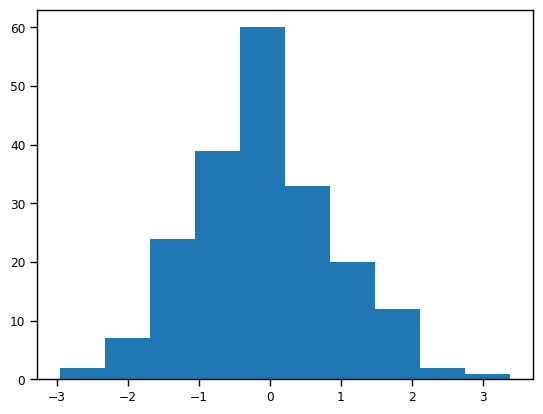

In [56]:
plt.hist(posterior_obs_resid[:,0])

In [57]:
summary_stats_df = basin_data_train[["prec","Tair_min","Tair_mean","Tair_max"]].groupby(basin_data_train.index.year).apply(lambda df: pd.DataFrame(wgen_summary_stats(df.index.values, df.prec.values, df.Tair_min.values, df.Tair_mean.values, df.Tair_max.values).reshape((1,-1)), columns=summary_stat_names)).reset_index().drop("level_1", axis=1)
summary_stats_df.describe()

,time,prec_mean,rp95,norm wet days,mean dry spell length,Tair_mean,Tair_range,Tair_skew,norm thaw days
count,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000
mean,1970.000000,1.841034,19.146120,0.464165,3.295445,8.464806,7.665947,0.483585,0.852496
std,11.979149,0.353711,4.528127,0.048617,0.514934,0.769984,0.580928,0.026299,0.049317
min,1950.000000,1.057300,13.098458,0.372603,2.553846,6.581241,6.549250,0.447778,0.753425
25%,1960.000000,1.523839,15.737223,0.427397,2.885246,7.802209,7.438528,0.464979,0.816940
50%,1970.000000,1.854292,18.018492,0.476712,3.216667,8.450788,7.685133,0.475402,0.852055
75%,1980.000000,2.098828,21.663124,0.498630,3.649123,9.033152,8.031537,0.493390,0.887671
max,1990.000000,2.655576,28.655827,0.546448,4.571429,10.052711,9.160261,0.537237,0.972603


In [58]:
obs_stats3 = obs_stats.at[1].add(5.0).at[2].add(-0.1).at[3].add(0.5)
obs_stats3 - obs_stats

Array([[ 0.        ],
       [ 5.        ],
       [-0.09999999],
       [ 0.5       ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ]], dtype=float32)

In [59]:
# sample from recalibrated SBI posterior
obs_target = obs_stats3
sbi_samples3 = sbi_posterior.sample((200,), x=j2t(obs_target[:,0]))
sbi_samples3_mean = torch.quantile(sbi_samples3, q=0.5, axis=0, keepdims=True)*torch.ones((200,1))
sbi_posterior_sims3 = wgen_sbi(sbi_samples3_mean)

Drawing 200 posterior samples:   0%|          | 0/200 [00:00<?, ?it/s]

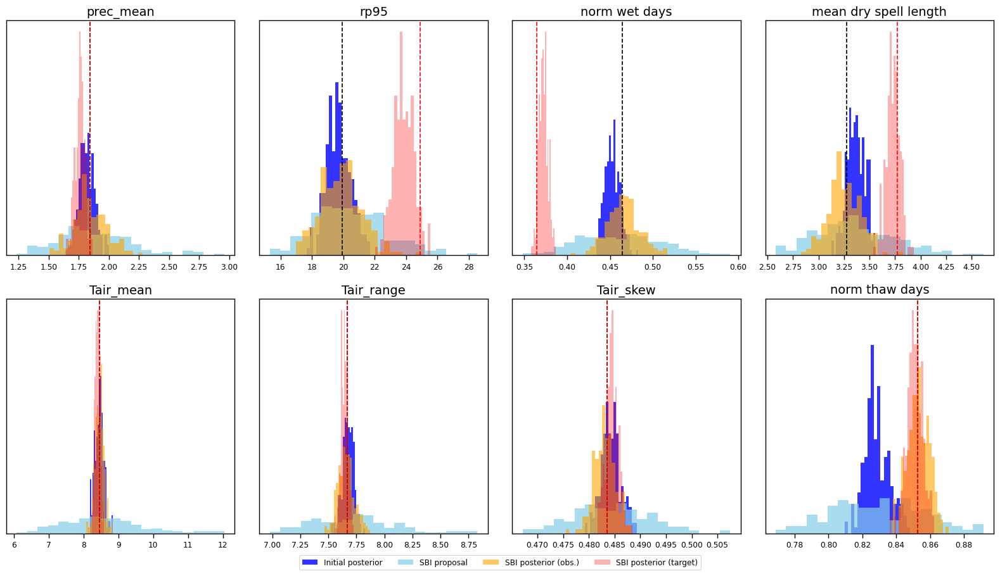

In [60]:
ncols = 4
nrows = 2
fig, axs = plt.subplots(nrows,ncols,figsize=(16,9))
for i in range(obs_stats.shape[0]):
    c = i % ncols
    r = i // ncols
    _,_,h1 = axs[r,c].hist(svi_posterior_sims.numpy()[:,i], bins=20, density=True, color='blue', alpha=0.8)
    _,_,h2 = axs[r,c].hist(svi_proposal_sims.numpy()[:,i], bins=20, density=True, color='skyblue', alpha=0.7)
    _,_,h3 = axs[r,c].hist(sbi_posterior_sims.numpy()[:,i], bins=20, density=True, color='orange', alpha=0.6)
    _,_,h4 = axs[r,c].hist(sbi_posterior_sims3.numpy()[:,i], bins=20, density=True, color='red', alpha=0.3)
    axs[r,c].axvline([obs_stats[i,:]], c='black', linestyle="--")
    axs[r,c].axvline([obs_target[i,:]], c='red', linestyle="--")
    axs[r,c].set_yticks([])
    axs[r,c].set_title(summary_stat_names[i])
for i in range(obs_stats.shape[0], ncols*nrows):
    c = i % ncols
    r = i // ncols
    fig.delaxes(axs[r,c])
labels = ["Initial posterior", "SBI proposal", "SBI posterior (obs.)", "SBI posterior (target)"]
fig.legend(handles=[h1,h2,h3,h4], labels=labels, ncol=4, loc="lower center", bbox_to_anchor=(0.5,-0.02))
plt.tight_layout()
plt.savefig("../plots/basin_6340800_sbi_posterior_rp95_wd_cdd_recalibrated.png")
plt.show()

In [61]:
sbi_posterior_samples_mean = sbi_samples.mean(axis=0, keepdims=True)
sbi_posterior_sims_mean = wgen_sbi(sbi_posterior_samples_mean)
sbi_posterior_sims_mean

tensor([[ 1.8457, 19.1253,  0.4719,  3.1900,  8.3043,  7.6414,  0.4813,  0.8474]])

In [62]:
sbi_params1 = wgen_prior.constrain(t2j(sbi_samples), as_dict=True)
sbi_params2 = wgen_prior.constrain(t2j(sbi_samples2), as_dict=True)
sbi_params3 = wgen_prior.constrain(t2j(sbi_samples3), as_dict=True)

In [63]:
sbi_predictive1 = Predictive(wgen.simulate, posterior_samples=sbi_params1, parallel=True)
sbi_preds1 = sbi_predictive1(prng)

In [64]:
sbi_predictive2 = Predictive(wgen.simulate, posterior_samples=sbi_params2, parallel=True)
sbi_preds2 = sbi_predictive2(prng)

In [65]:
sbi_predictive3 = Predictive(wgen.simulate, posterior_samples=sbi_params3, parallel=True)
sbi_preds3 = sbi_predictive3(prng)

In [66]:
sbi_preds1["Tavg"].shape

(200, 14975, 1)

In [67]:
wgen.obs['Tavg'].shape

(1, 14975)

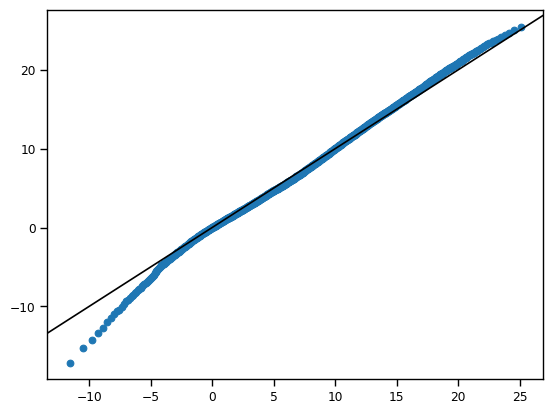

In [68]:
Tavg_preds1 = sbi_preds1["Tavg"].flatten().sort()
Tavg_obs1 = wgen.obs["Tavg"].squeeze().sort()
plt.scatter(np.quantile(Tavg_preds1, np.arange(0.001,0.999,0.001)), np.quantile(Tavg_obs1, np.arange(0.001,0.999,0.001)))
plt.axline((0,0),slope=1,color="black")

In [69]:
import xarray as xr

def to_xarray(data, preds):
    timestamps = data.index
    Tavg_sims = xr.DataArray(preds["Tavg"].squeeze(), dims=("sample","time"), coords={"time": timestamps.values}, name="Tavg_sim")
    Tmin_sims = xr.DataArray(preds["Tmin"].squeeze(), dims=("sample","time"), coords={"time": timestamps.values}, name="Tmin_sim")
    Tmax_sims = xr.DataArray(preds["Tmax"].squeeze(), dims=("sample","time"), coords={"time": timestamps.values}, name="Tmax_sim")
    prec_sims = xr.DataArray(preds["prec"].squeeze(), dims=("sample","time"), coords={"time": timestamps.values}, name="prec_sim")
    obs = data.to_xarray().astype(np.float32)
    return xr.merge([Tavg_sims, Tmin_sims, Tmax_sims, prec_sims, obs])

In [70]:
sbi_sims1_arr = to_xarray(basin_data_train[["Tair_mean","Tair_min","Tair_max","prec"]].iloc[wgen.first_valid_idx:,:], sbi_preds1)
sbi_sims2_arr = to_xarray(basin_data_train[["Tair_mean","Tair_min","Tair_max","prec"]].iloc[wgen.first_valid_idx:,:], sbi_preds2)
sbi_sims3_arr = to_xarray(basin_data_train[["Tair_mean","Tair_min","Tair_max","prec"]].iloc[wgen.first_valid_idx:,:], sbi_preds3)

In [72]:
sbi_sims1_arr.to_netcdf("../data/products/wgen_glm_v3_basin=6340800_sbi_obs_stats.nc")
sbi_sims2_arr.to_netcdf("../data/products/wgen_glm_v3_basin=6340800_sbi_rand_stats.nc")
sbi_sims3_arr.to_netcdf("../data/products/wgen_glm_v3_basin=6340800_sbi_tuned_stats.nc")

In [73]:
sbi_sims1_arr

<xarray.Dataset> Size: 48MB
Dimensions:    (time: 14975, sample: 200)
Coordinates:
  * time       (time) datetime64[ns] 120kB 1950-01-01 1950-01-02 ... 1990-12-31
Dimensions without coordinates: sample
Data variables:
    Tavg_sim   (sample, time) float32 12MB 2.318 3.241 2.972 ... 0.9073 -0.04229
    Tmin_sim   (sample, time) float32 12MB -4.668 1.906 ... -0.1766 -1.746
    Tmax_sim   (sample, time) float32 12MB 9.926 5.33 5.359 ... 2.711 3.549
    prec_sim   (sample, time) float32 12MB 0.0 0.0 5.898 4.239 ... 0.0 0.0 0.0
    Tair_mean  (time) float32 60kB -4.592 -0.241 1.185 ... 4.872 5.884 4.019
    Tair_min   (time) float32 60kB -5.684 -5.416 -0.2187 ... 0.4121 3.41 1.914
    Tair_max   (time) float32 60kB -2.228 0.9776 2.022 ... 6.171 9.602 6.355
    prec       (time) float32 60kB 0.0 14.84 3.41 2.306 ... 0.0 4.842 0.0 2.197